# Gas powerplant - ADP investigation 
- I found out that it is not that easy to make the model of value function (Linear model does not work). 
- I have tried to come up with some basis functions that would make sense, but it seems like the linear model is not capable of capturing the problem. 
- The complex problem, with government incentive and powerplant months left was simplified. Now the only variables are the prices and the state of a powerplant. Balance might be added to the model as a linear component helping the project.  

- This notebook is about a better basis functions, or maybe a completely new model of the value function. 
- I will start by precise modelling of the last Vf, then I will go in other time epochs. 

# 1. Epoch 298 
- Get a lot of (state, utility) pairs, so that we see the function "plotted" by scatter. Look at the data and try to moodel them reasonably. 

In [1]:
import sys
import os
sys.path.append("/Users/filiprolenec/Desktop/MT/MTpython/src")

In [2]:
from gas_example.optimization.adp_algorithm import adp_algorithm_complete
from gas_example.optimization.optimization import get_state_utility_pairs, get_best_action
from gas_example.optimization.sampling import get_state_sample
from gas_example.optimization.vf import Vf
from gas_example.enum_types import PowerplantState
from gas_example.simulation.state import State


In [3]:
import matplotlib.pyplot as plt
from scipy import optimize
import seaborn as sns
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
sns.set()

In [4]:
time_epoch = 298
VF_SAMPLE_GLOBAL = 1000
VF_SAMPLE_IND = 100
next_vf = Vf()

In [5]:
sampled_states = get_state_sample()
state_reward_pairs_raw = get_state_utility_pairs(sampled_states, next_vf)

In [6]:
def get_sparks_and_utilities(state_reward_pairs, plant_state): 
    chosen_states  = [state for state in state_reward_pairs_raw.keys() if state.plant_state ==plant_state]
    utilities = [state_reward_pairs_raw[state] for state in state_reward_pairs_raw.keys() if state.plant_state ==plant_state]
    sparks = [state.get_spark_price() for state in chosen_states]
    
    return sparks, utilities

In [7]:
def plot_spark_utility_graph(plant_state): 
    sparks, utilities = get_sparks_and_utilities(state_reward_pairs_raw, plant_state)
    
    plt.scatter(sparks, utilities)
    plt.xlabel("Spark")
    plt.ylabel("Utility")
    plt.title(f"Spark vs Utility {plant_state}")
    plt.show()


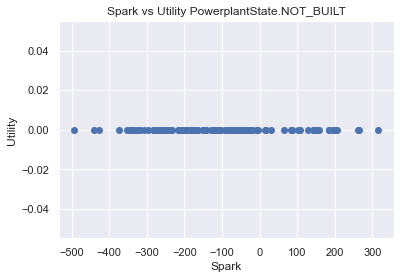

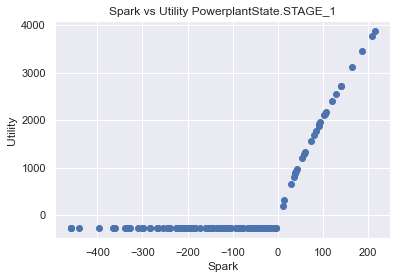

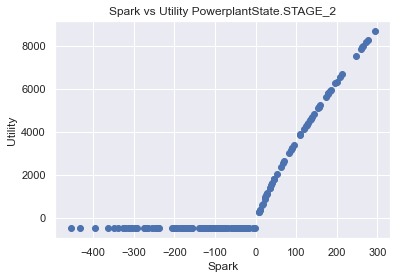

In [8]:
for state in PowerplantState: 
    plot_spark_utility_graph(state)

**Stage 1 and 2 are similar, we will not focus on them individually. Trying to find a linear model of stage 1**

In [9]:
plant_state =PowerplantState.STAGE_1

In [10]:
sparks, utilities = get_sparks_and_utilities(state_reward_pairs_raw, plant_state)

In [11]:
x = np.array(sparks).reshape(-1,1)
y = np.array(utilities)
model = LinearRegression().fit(x, y)
model.coef_

array([4.83952331])

In [12]:
sparks_sample = np.linspace(-200,200,401)
a = model.predict(sparks_sample.reshape(-1,1))

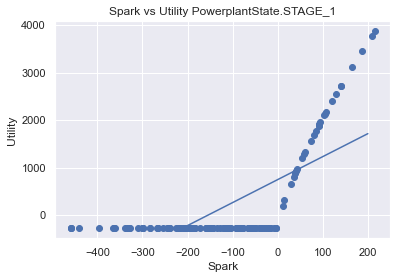

In [13]:
plt.scatter(sparks, utilities)
plt.plot(sparks_sample, a)
plt.xlabel("Spark")
plt.ylabel("Utility")
plt.title(f"Spark vs Utility {plant_state}")
plt.show()

# Obsolete, the optimization is not done by curve fit anymore

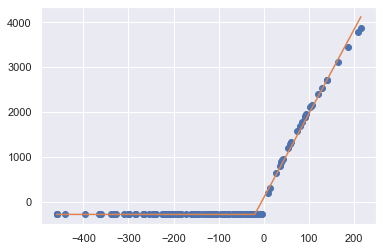

In [14]:
def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

p , e = optimize.curve_fit(piecewise_linear, sparks, utilities)
xd = np.linspace(min(sparks), max(sparks), 500)
plt.plot(sparks, utilities, "o")
plt.plot(xd, piecewise_linear(xd, *p))

# Looking good 
- What is the equation? Now we want to write a strategy that will behave based on these value functions. 
- We save the vfs parameters as csv and we will use it in another notebook. ADP simulaiton. 


# Testing
- All at once, what will be the value function in time 0?

N/A% (0 of 300) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

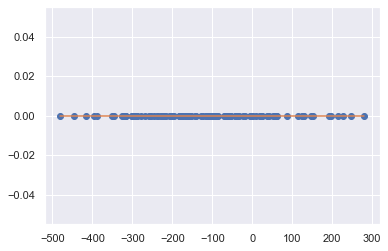

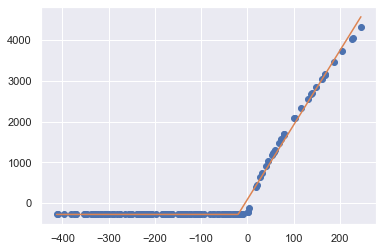

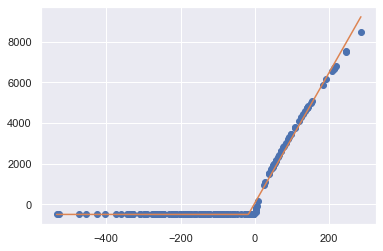

  0% (2 of 300) |                        | Elapsed Time: 0:01:41 ETA:   4:11:31

Parameters([('x0', <Parameter 'x0', value=0.0, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=0.0, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=0.0, bounds=[-inf:inf]>)])


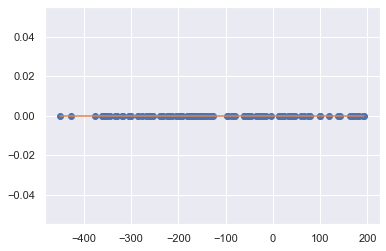

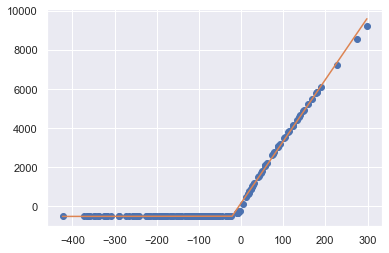

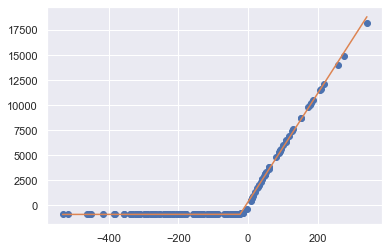

  1% (3 of 300) |                        | Elapsed Time: 0:03:59 ETA:  11:23:27

Parameters([('x0', <Parameter 'x0', value=0.0, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=0.0, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=0.0, bounds=[-inf:inf]>)])


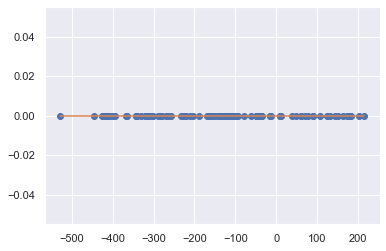

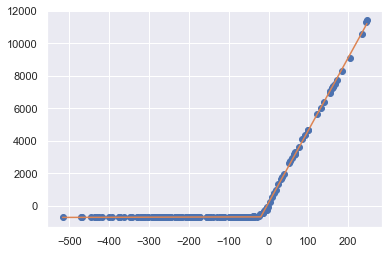

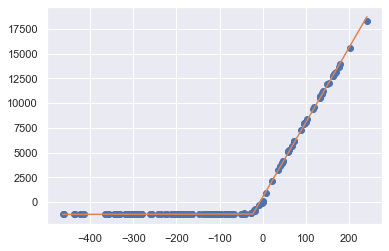

  1% (4 of 300) |                        | Elapsed Time: 0:06:30 ETA:  12:25:02

Parameters([('x0', <Parameter 'x0', value=0.0, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=0.0, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=0.0, bounds=[-inf:inf]>)])


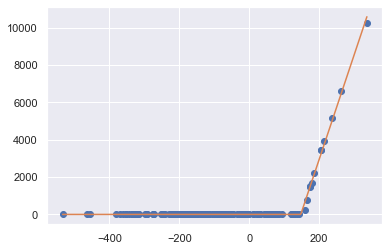

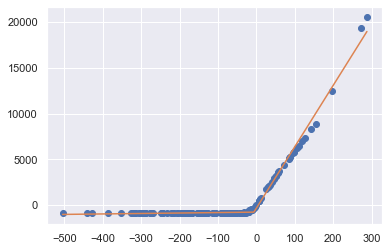

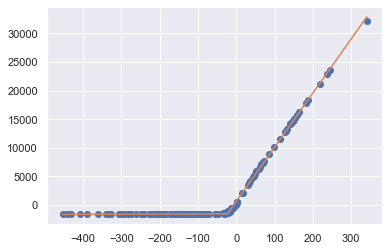

  1% (5 of 300) |                        | Elapsed Time: 0:08:59 ETA:  12:13:38

Parameters([('x0', <Parameter 'x0', value=147.6813920424232 +/- 0.489, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=7.951625289187987e-16 +/- 10.9, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.035, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=55.920997003087656 +/- 0.351, bounds=[-inf:inf]>)])


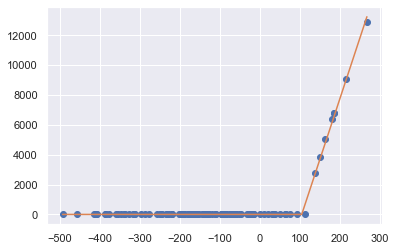

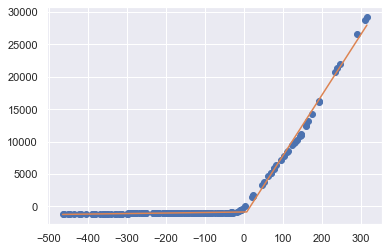

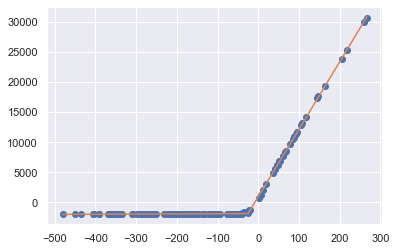

  2% (6 of 300) |                        | Elapsed Time: 0:11:30 ETA:  12:19:19

Parameters([('x0', <Parameter 'x0', value=104.34889904083904 +/- 0.655, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1.368843861757798e-15 +/- 18.1, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0619, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=81.31208718339545 +/- 0.628, bounds=[-inf:inf]>)])


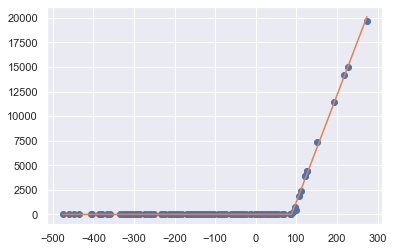

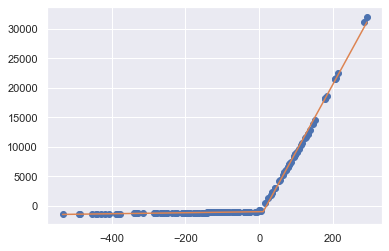

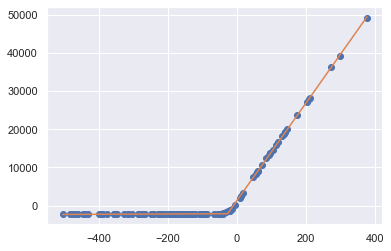

  2% (7 of 300) |                        | Elapsed Time: 0:13:53 ETA:  11:40:09

Parameters([('x0', <Parameter 'x0', value=88.06313751385707 +/- 0.413, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3.8009534778787284 +/- 19.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0694, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=108.33559107879168 +/- 0.498, bounds=[-inf:inf]>)])


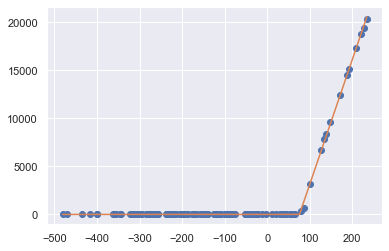

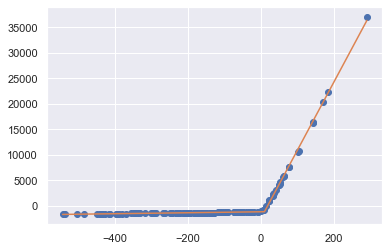

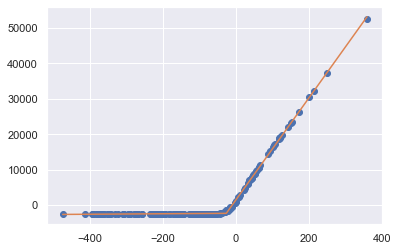

  2% (8 of 300) |                        | Elapsed Time: 0:16:08 ETA:  10:57:42

Parameters([('x0', <Parameter 'x0', value=75.96046705401206 +/- 0.449, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5.077787622983672 +/- 21.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0789, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=129.786986730682 +/- 0.546, bounds=[-inf:inf]>)])


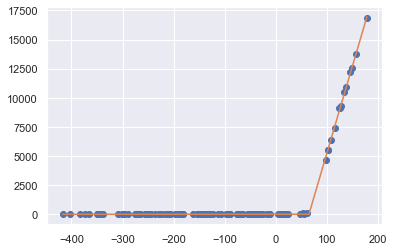

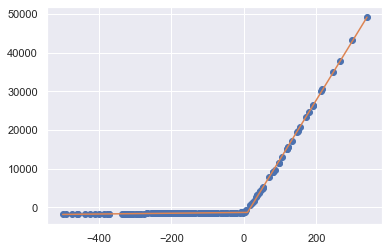

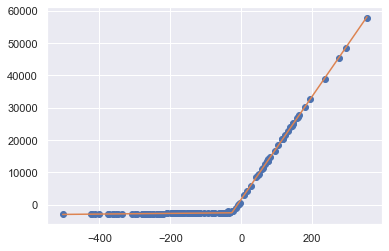

  3% (9 of 300) |                        | Elapsed Time: 0:18:37 ETA:  12:00:28

Parameters([('x0', <Parameter 'x0', value=64.43789572932752 +/- 0.214, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=14.907886625530843 +/- 7.68, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0318, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=149.43318194708135 +/- 0.457, bounds=[-inf:inf]>)])


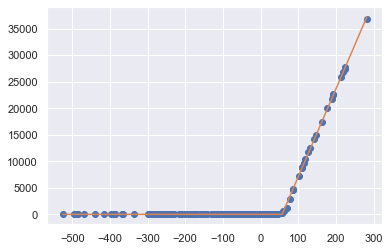

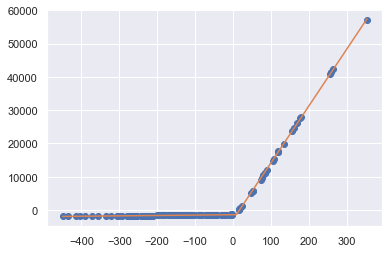

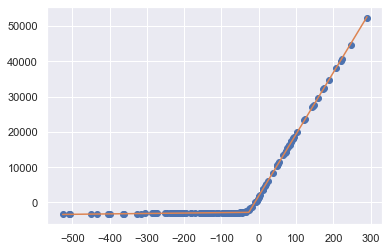

  3% (10 of 300) |                       | Elapsed Time: 0:20:43 ETA:  10:09:50

Parameters([('x0', <Parameter 'x0', value=57.30089860546931 +/- 0.282, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=30.06339922405351 +/- 20.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.083, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=165.23512958232166 +/- 0.404, bounds=[-inf:inf]>)])


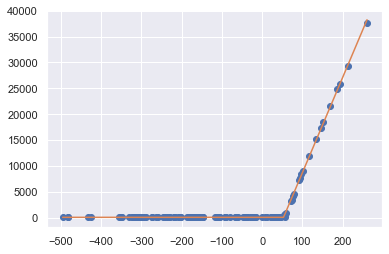

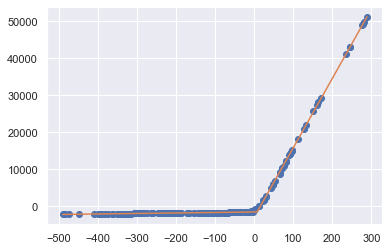

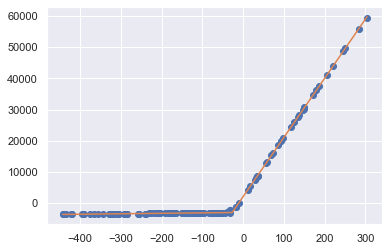

  3% (11 of 300) |                       | Elapsed Time: 0:22:58 ETA:  10:47:39

Parameters([('x0', <Parameter 'x0', value=53.05965105714227 +/- 0.267, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=47.43521996532708 +/- 25.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0995, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=184.3469068649676 +/- 0.486, bounds=[-inf:inf]>)])


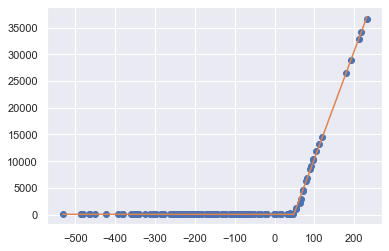

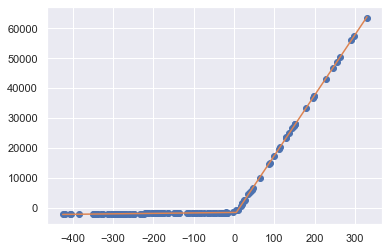

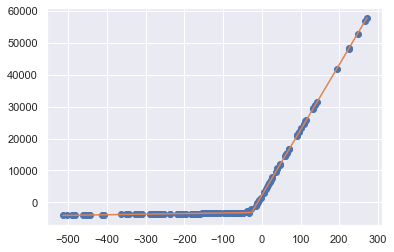

  4% (12 of 300) |                       | Elapsed Time: 0:25:03 ETA:  10:02:50

Parameters([('x0', <Parameter 'x0', value=48.36105129060333 +/- 0.258, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=66.07957664277893 +/- 25, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.0913, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=201.6093077520383 +/- 0.525, bounds=[-inf:inf]>)])


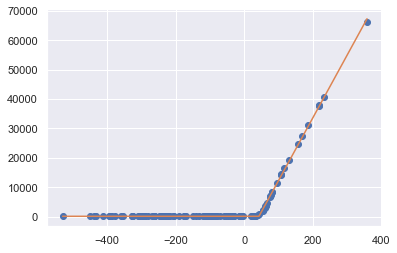

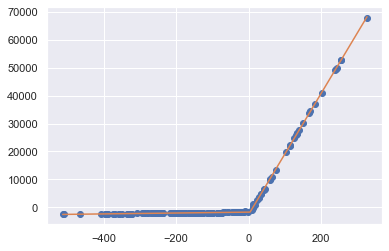

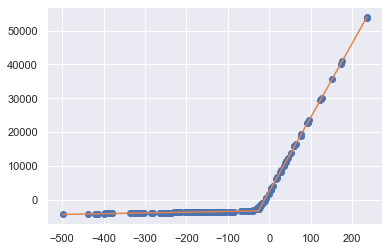

  4% (13 of 300) |                       | Elapsed Time: 0:27:16 ETA:  10:34:19

Parameters([('x0', <Parameter 'x0', value=42.88860780299818 +/- 0.395, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=109.85672565151926 +/- 50.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.192, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=213.09100822202504 +/- 0.638, bounds=[-inf:inf]>)])


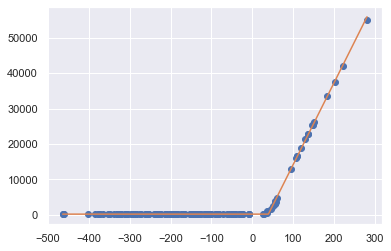

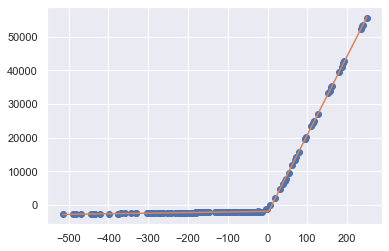

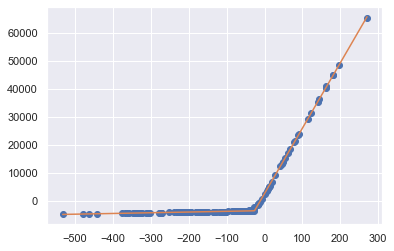

  4% (14 of 300) |#                      | Elapsed Time: 0:29:23 ETA:  10:05:07

Parameters([('x0', <Parameter 'x0', value=39.39715106071789 +/- 0.34, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=189.074192559816 +/- 39.8, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.154, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=230.68918980100113 +/- 0.665, bounds=[-inf:inf]>)])


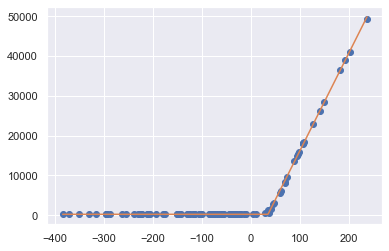

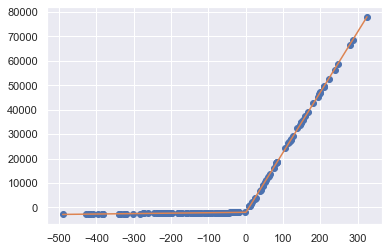

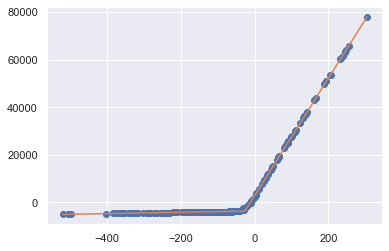

  5% (15 of 300) |#                      | Elapsed Time: 0:31:33 ETA:  10:18:29

Parameters([('x0', <Parameter 'x0', value=35.01635690634281 +/- 0.289, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=217.23116657125635 +/- 42.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.211, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=245.40663477741043 +/- 0.653, bounds=[-inf:inf]>)])


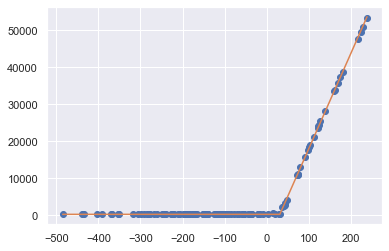

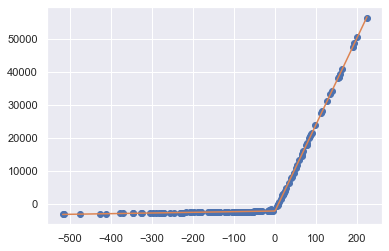

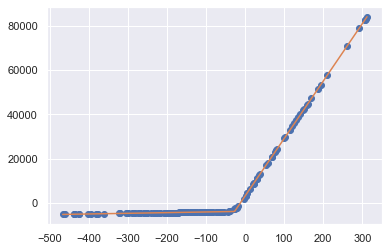

  5% (16 of 300) |#                      | Elapsed Time: 0:33:41 ETA:  10:06:08

Parameters([('x0', <Parameter 'x0', value=31.490322790776425 +/- 0.214, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=239.29554826460043 +/- 30.8, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.131, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=257.2731468419184 +/- 0.428, bounds=[-inf:inf]>)])


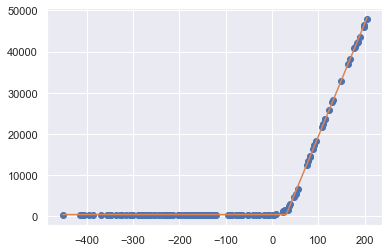

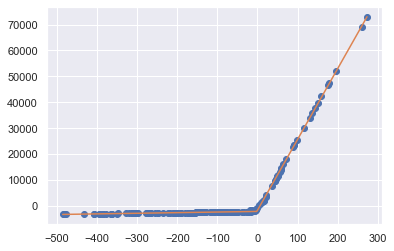

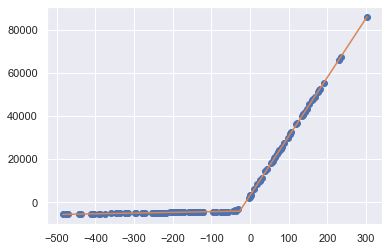

  5% (17 of 300) |#                      | Elapsed Time: 0:35:50 ETA:  10:09:13

Parameters([('x0', <Parameter 'x0', value=30.364962067937302 +/- 0.33, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=441.5026698262425 +/- 46.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.191, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=274.1287728370436 +/- 0.754, bounds=[-inf:inf]>)])


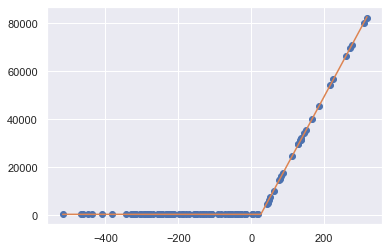

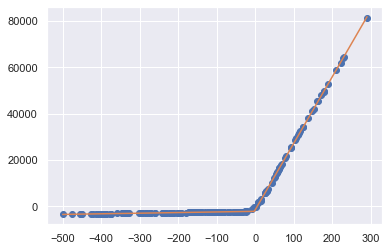

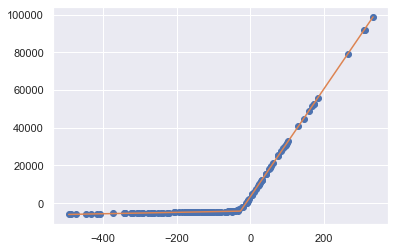

  6% (18 of 300) |#                      | Elapsed Time: 0:38:09 ETA:  10:51:13

Parameters([('x0', <Parameter 'x0', value=26.73109689659668 +/- 0.303, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=475.60090732495064 +/- 47.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.185, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=281.86717835348645 +/- 0.483, bounds=[-inf:inf]>)])


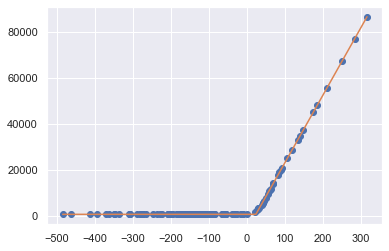

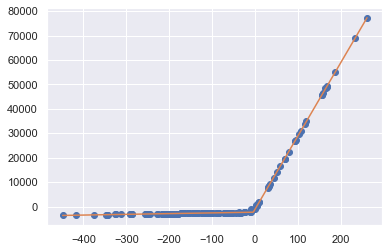

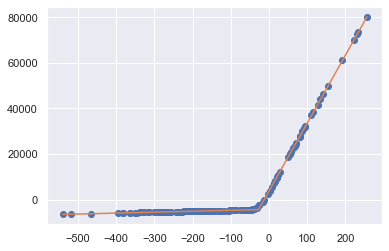

  6% (19 of 300) |#                      | Elapsed Time: 0:40:16 ETA:   9:53:28

Parameters([('x0', <Parameter 'x0', value=24.06860658147342 +/- 0.269, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=517.3624118344966 +/- 49.8, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.227, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=294.43224052239844 +/- 0.552, bounds=[-inf:inf]>)])


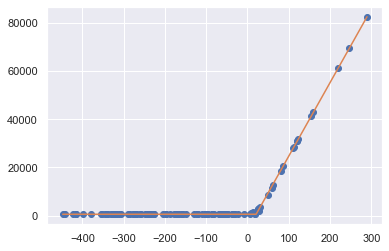

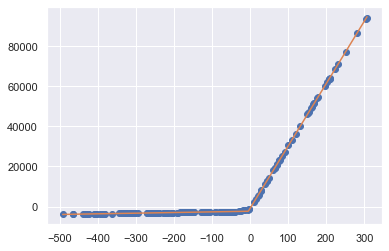

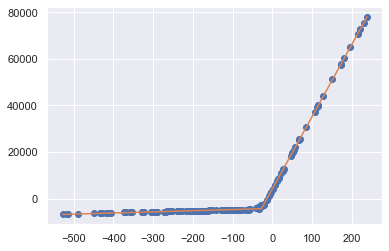

  6% (20 of 300) |#                      | Elapsed Time: 0:42:28 ETA:  10:15:50

Parameters([('x0', <Parameter 'x0', value=20.9137211765199 +/- 0.275, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=587.3862028771987 +/- 45.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.185, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=305.19596993575306 +/- 0.637, bounds=[-inf:inf]>)])


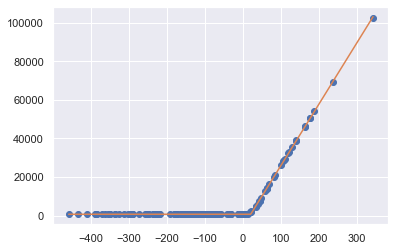

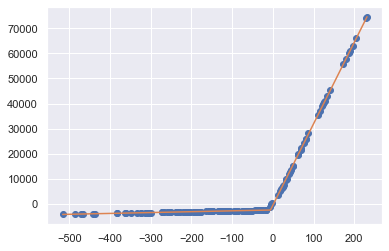

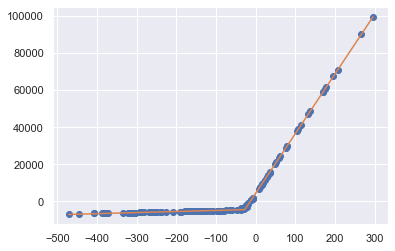

  7% (21 of 300) |#                      | Elapsed Time: 0:44:36 ETA:   9:58:12

Parameters([('x0', <Parameter 'x0', value=20.308440509399563 +/- 0.257, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=677.3800918972215 +/- 45.9, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.207, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=318.2640281529558 +/- 0.621, bounds=[-inf:inf]>)])


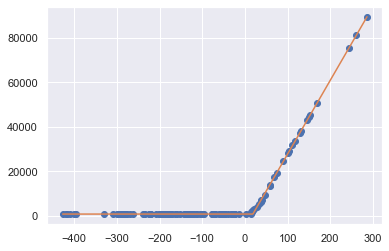

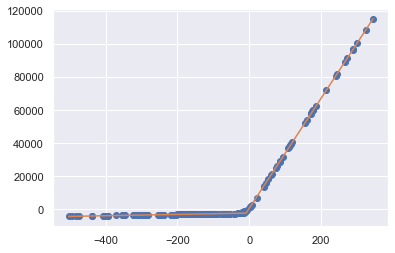

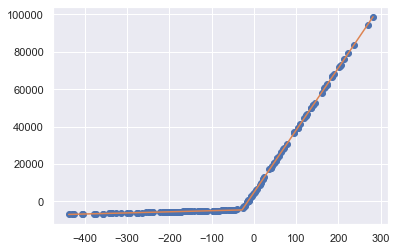

  7% (22 of 300) |#                      | Elapsed Time: 0:46:44 ETA:   9:51:37

Parameters([('x0', <Parameter 'x0', value=18.55623868654256 +/- 0.374, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=833.2022541488033 +/- 67.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.32, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=331.14530037227865 +/- 0.922, bounds=[-inf:inf]>)])


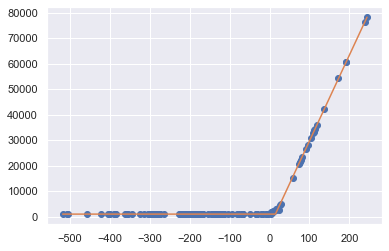

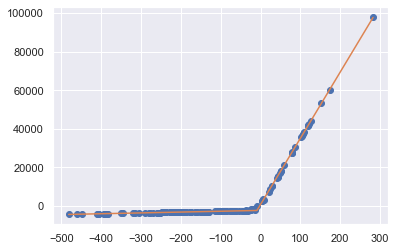

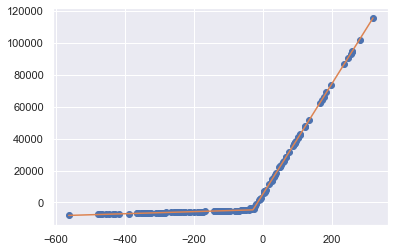

  7% (23 of 300) |#                      | Elapsed Time: 0:48:51 ETA:   9:47:30

Parameters([('x0', <Parameter 'x0', value=14.783193387479324 +/- 0.337, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=952.1505288033317 +/- 58.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.237, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=337.07957357433406 +/- 0.9, bounds=[-inf:inf]>)])


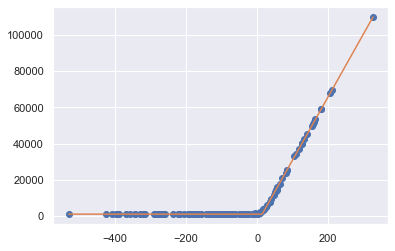

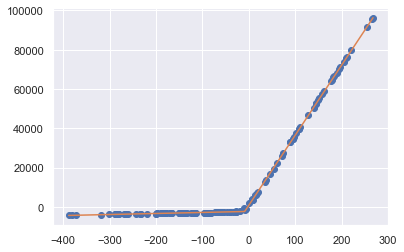

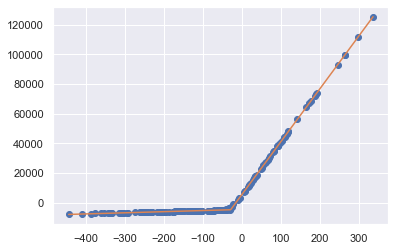

  8% (24 of 300) |#                      | Elapsed Time: 0:50:57 ETA:   9:38:01

Parameters([('x0', <Parameter 'x0', value=13.941460473259722 +/- 0.327, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1100.7723283164805 +/- 69.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.321, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=348.73092926665777 +/- 0.871, bounds=[-inf:inf]>)])


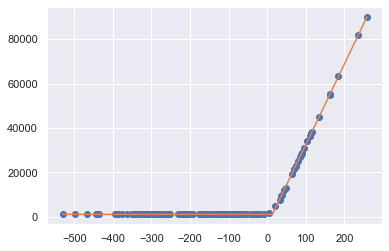

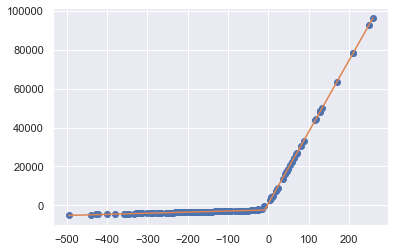

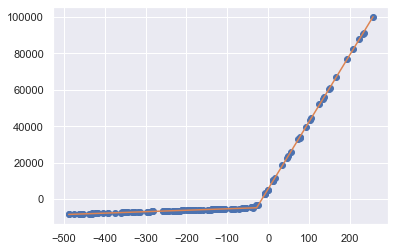

  8% (25 of 300) |#                      | Elapsed Time: 0:53:02 ETA:   9:32:36

Parameters([('x0', <Parameter 'x0', value=13.503616754678138 +/- 0.195, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1123.3987175431475 +/- 34.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.14, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=362.86361588747184 +/- 0.597, bounds=[-inf:inf]>)])


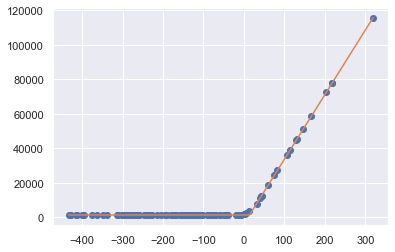

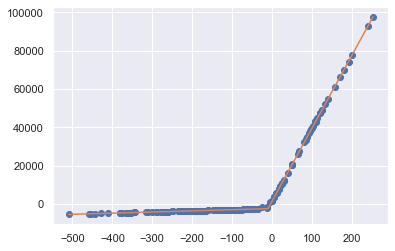

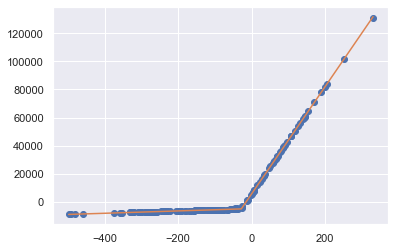

  8% (26 of 300) |#                      | Elapsed Time: 0:55:14 ETA:  10:03:02

Parameters([('x0', <Parameter 'x0', value=13.739415327446562 +/- 0.378, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1374.9171526133862 +/- 62.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.275, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=374.64578693489983 +/- 0.935, bounds=[-inf:inf]>)])


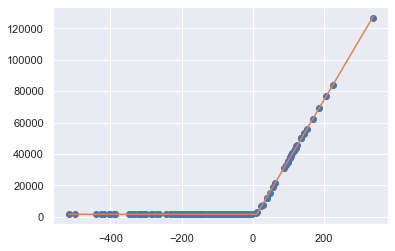

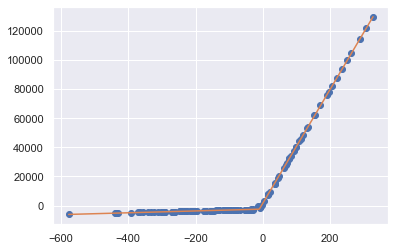

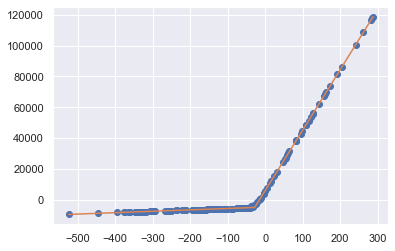

  9% (27 of 300) |##                     | Elapsed Time: 0:57:18 ETA:   9:26:53

Parameters([('x0', <Parameter 'x0', value=11.493507429383346 +/- 0.215, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1426.536795589359 +/- 41.9, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.18, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=384.6688492168282 +/- 0.585, bounds=[-inf:inf]>)])


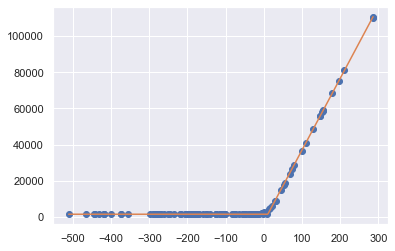

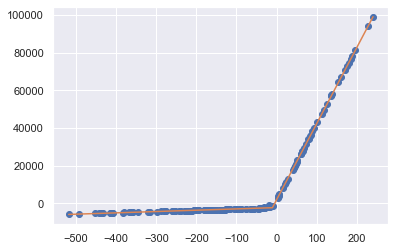

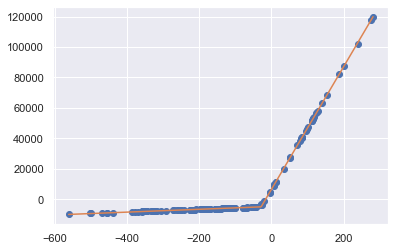

  9% (28 of 300) |##                     | Elapsed Time: 0:59:31 ETA:   9:59:16

Parameters([('x0', <Parameter 'x0', value=10.453799639586876 +/- 0.227, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1529.8267450514913 +/- 41.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.187, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=396.0351576143137 +/- 0.614, bounds=[-inf:inf]>)])


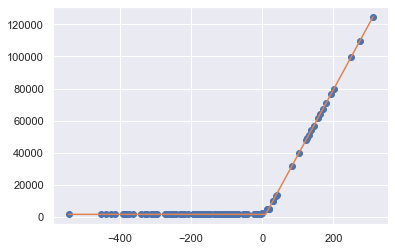

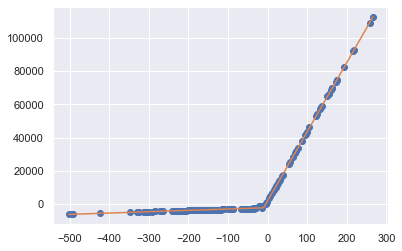

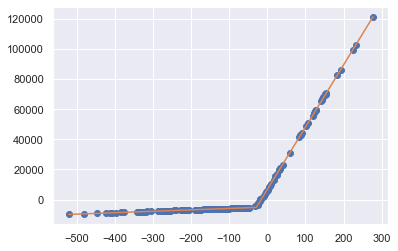

  9% (29 of 300) |##                     | Elapsed Time: 1:01:40 ETA:   9:43:05

Parameters([('x0', <Parameter 'x0', value=9.296608598025143 +/- 0.254, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1568.276750460636 +/- 49.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.22, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=407.9958976468041 +/- 0.63, bounds=[-inf:inf]>)])


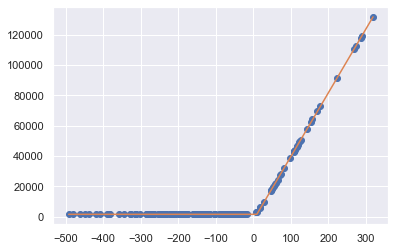

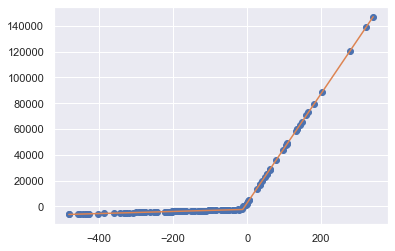

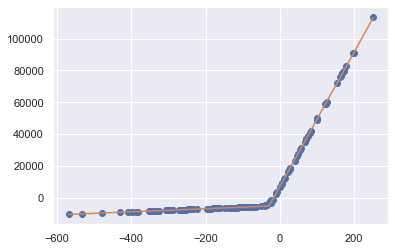

 10% (30 of 300) |##                     | Elapsed Time: 1:03:44 ETA:   9:21:47

Parameters([('x0', <Parameter 'x0', value=9.215662523144115 +/- 0.188, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1634.335682859463 +/- 42.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.19, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=420.5751477090511 +/- 0.484, bounds=[-inf:inf]>)])


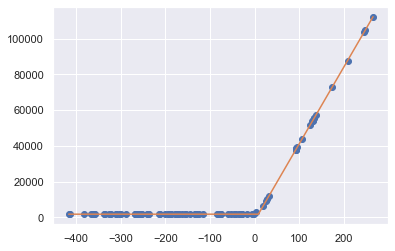

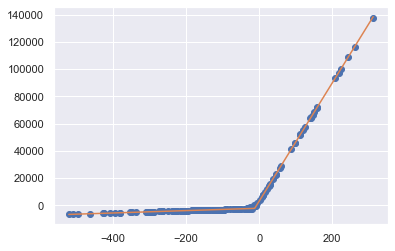

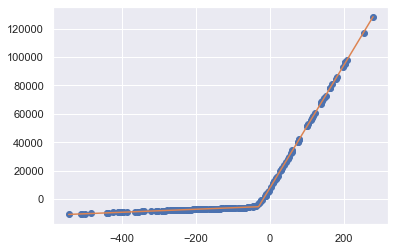

 10% (31 of 300) |##                     | Elapsed Time: 1:05:56 ETA:   9:50:29

Parameters([('x0', <Parameter 'x0', value=8.291040567404494 +/- 0.217, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1762.36436270578 +/- 47.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.205, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=429.8743152768822 +/- 0.596, bounds=[-inf:inf]>)])


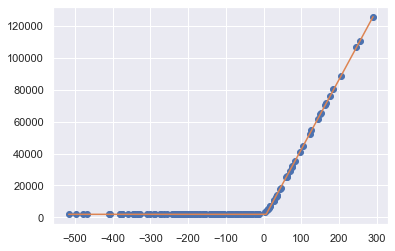

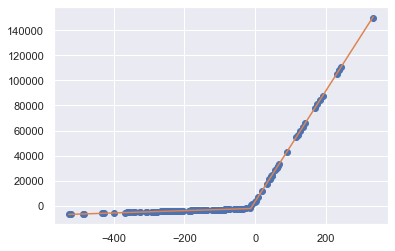

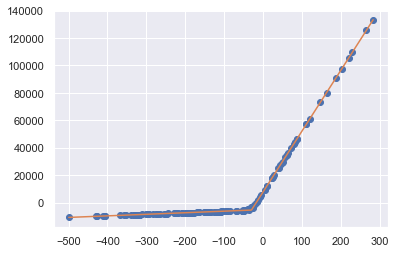

 10% (32 of 300) |##                     | Elapsed Time: 1:08:05 ETA:   9:35:19

Parameters([('x0', <Parameter 'x0', value=6.641490994482336 +/- 0.24, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1822.0847331943628 +/- 58, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.257, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=437.9224828172871 +/- 0.731, bounds=[-inf:inf]>)])


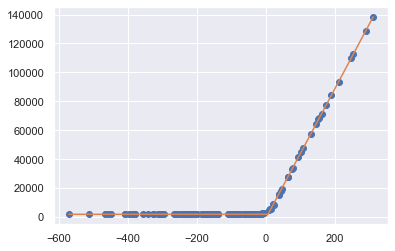

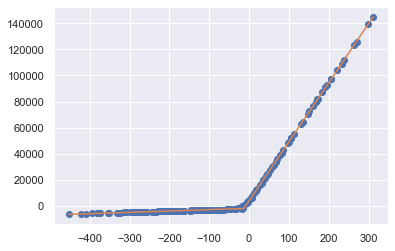

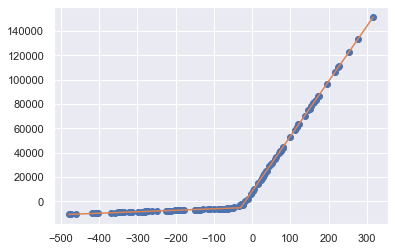

 11% (33 of 300) |##                     | Elapsed Time: 1:10:19 ETA:   9:56:14

Parameters([('x0', <Parameter 'x0', value=5.7575563894896 +/- 0.244, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=1904.5881785494191 +/- 58.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.252, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=447.66261000209363 +/- 0.668, bounds=[-inf:inf]>)])


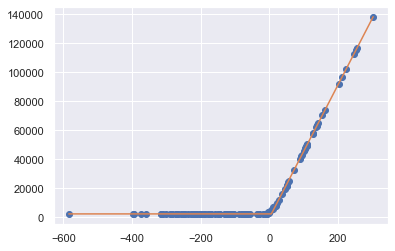

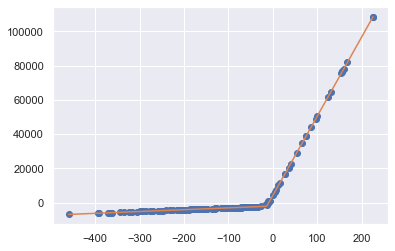

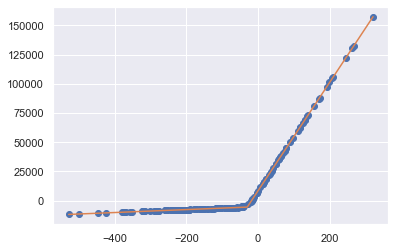

 11% (34 of 300) |##                     | Elapsed Time: 1:12:24 ETA:   9:13:11

Parameters([('x0', <Parameter 'x0', value=5.656597703271277 +/- 0.338, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2256.347399017163 +/- 94.1, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.445, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=458.68167856275386 +/- 0.946, bounds=[-inf:inf]>)])


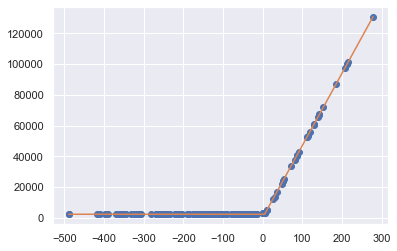

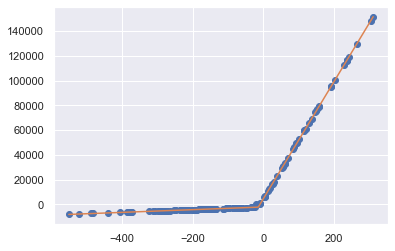

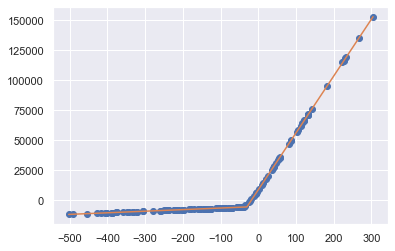

 11% (35 of 300) |##                     | Elapsed Time: 1:14:32 ETA:   9:27:05

Parameters([('x0', <Parameter 'x0', value=4.818327522771037 +/- 0.169, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2366.5134622758387 +/- 39.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.184, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=469.3601381422731 +/- 0.563, bounds=[-inf:inf]>)])


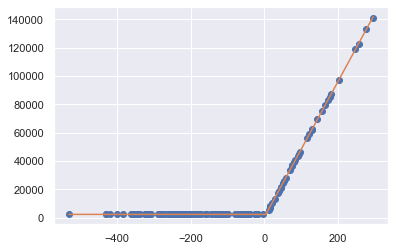

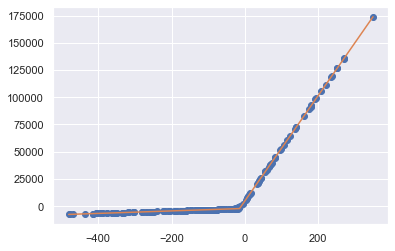

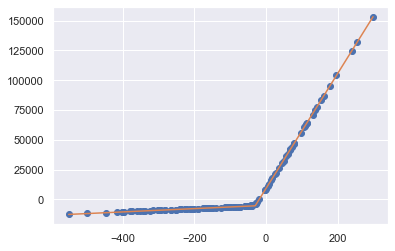

 12% (36 of 300) |##                     | Elapsed Time: 1:16:45 ETA:   9:42:50

Parameters([('x0', <Parameter 'x0', value=3.973218518153113 +/- 0.155, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2384.8592313282393 +/- 46, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.194, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=478.67309211993677 +/- 0.456, bounds=[-inf:inf]>)])


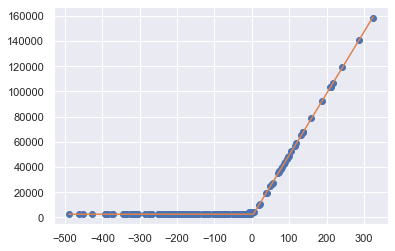

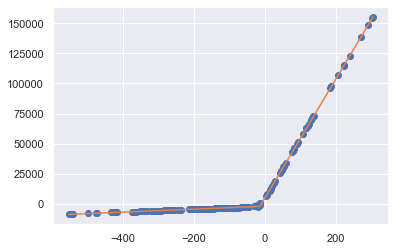

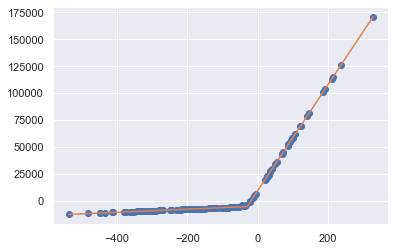

 12% (37 of 300) |##                     | Elapsed Time: 1:18:54 ETA:   9:27:47

Parameters([('x0', <Parameter 'x0', value=4.124425158517547 +/- 0.204, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2555.094420353465 +/- 53.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.236, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=488.78449057189 +/- 0.626, bounds=[-inf:inf]>)])


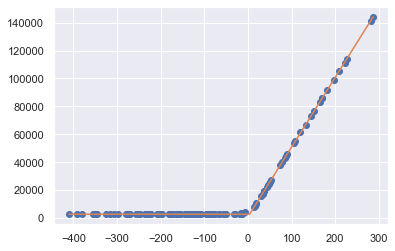

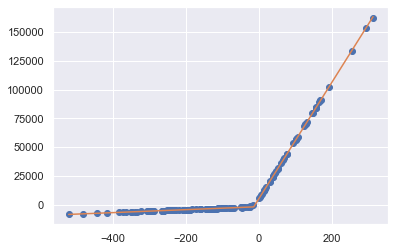

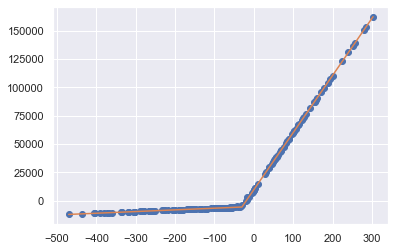

 12% (38 of 300) |##                     | Elapsed Time: 1:21:00 ETA:   9:11:07

Parameters([('x0', <Parameter 'x0', value=3.906287657098368 +/- 0.183, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2702.606503229326 +/- 55.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.275, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=499.6356866740927 +/- 0.557, bounds=[-inf:inf]>)])


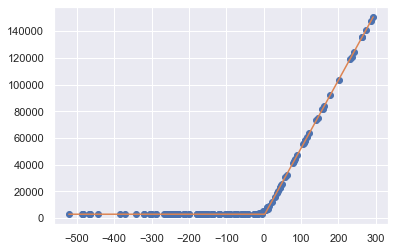

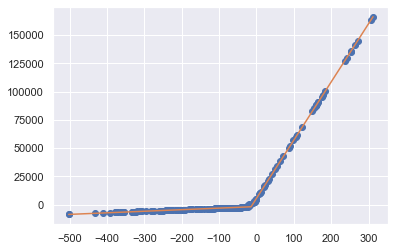

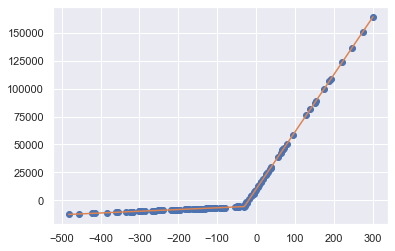

 13% (39 of 300) |##                     | Elapsed Time: 1:23:14 ETA:   9:42:51

Parameters([('x0', <Parameter 'x0', value=2.9394207937073533 +/- 0.238, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=2849.5306161364165 +/- 71.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.309, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=509.6067580238493 +/- 0.675, bounds=[-inf:inf]>)])


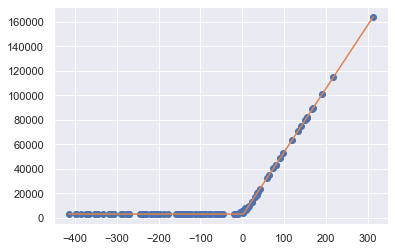

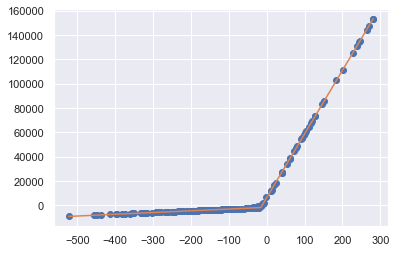

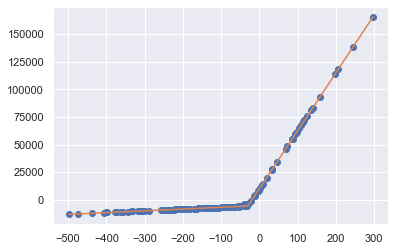

 13% (40 of 300) |###                    | Elapsed Time: 1:25:26 ETA:   9:28:57

Parameters([('x0', <Parameter 'x0', value=2.564939965282137 +/- 0.29, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3136.446611634026 +/- 93.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.421, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=517.8598188463898 +/- 1.05, bounds=[-inf:inf]>)])


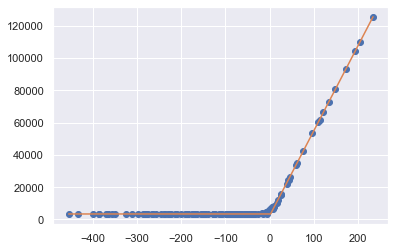

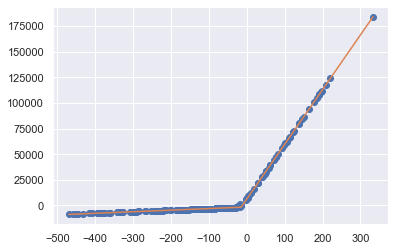

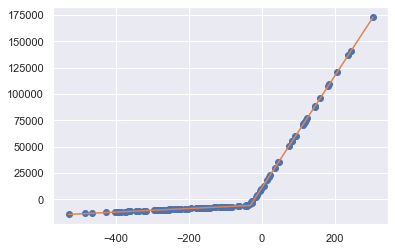

 13% (41 of 300) |###                    | Elapsed Time: 1:27:42 ETA:   9:48:10

Parameters([('x0', <Parameter 'x0', value=2.095718691699716 +/- 0.334, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3406.982158789017 +/- 91.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.453, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=527.4120809078895 +/- 1.46, bounds=[-inf:inf]>)])


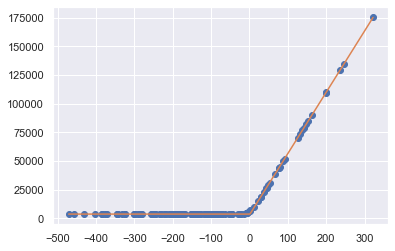

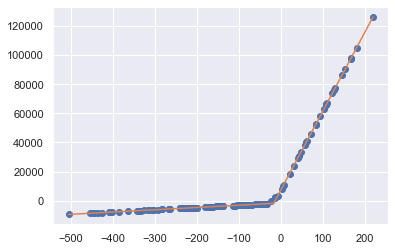

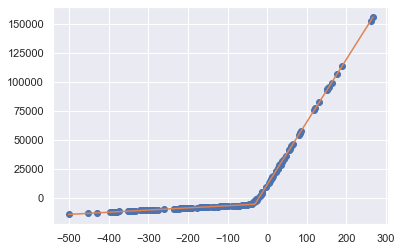

 14% (42 of 300) |###                    | Elapsed Time: 1:29:48 ETA:   9:03:42

Parameters([('x0', <Parameter 'x0', value=1.3481527692034905 +/- 0.333, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3691.1413442765474 +/- 97.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.444, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=534.7349705234973 +/- 1.15, bounds=[-inf:inf]>)])


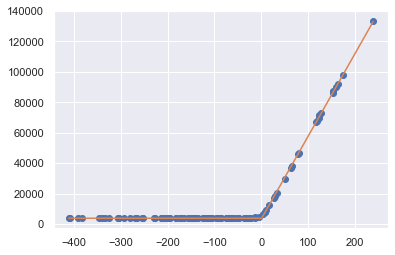

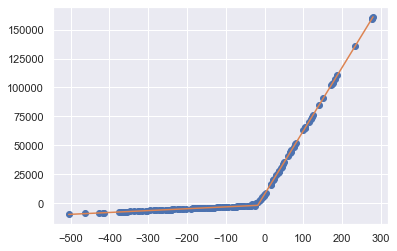

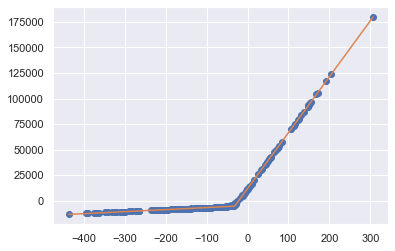

 14% (43 of 300) |###                    | Elapsed Time: 1:32:01 ETA:   9:30:07

Parameters([('x0', <Parameter 'x0', value=0.5046726639553147 +/- 0.25, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3805.248702330495 +/- 70.8, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.367, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=543.5953419381188 +/- 1.06, bounds=[-inf:inf]>)])


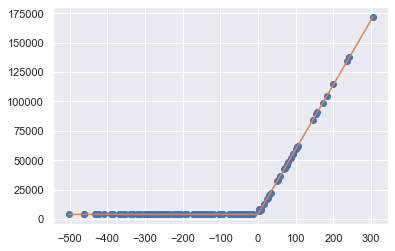

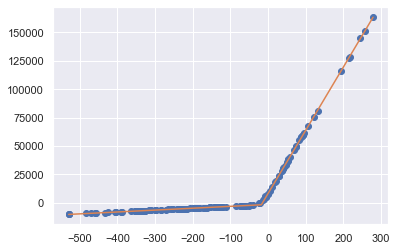

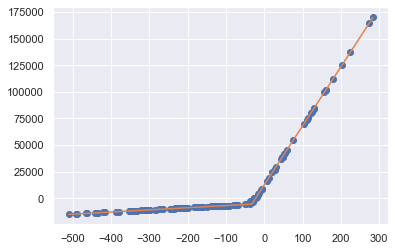

 14% (44 of 300) |###                    | Elapsed Time: 1:34:09 ETA:   9:03:29

Parameters([('x0', <Parameter 'x0', value=-0.7875471184203978 +/- 0.226, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3806.865342123506 +/- 70.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.303, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=550.3876473217721 +/- 0.859, bounds=[-inf:inf]>)])


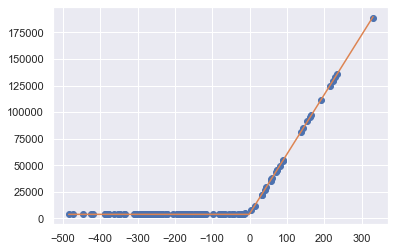

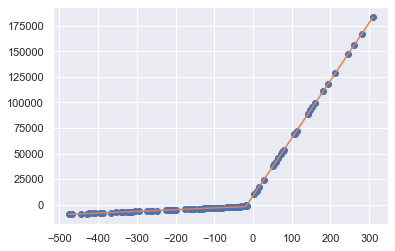

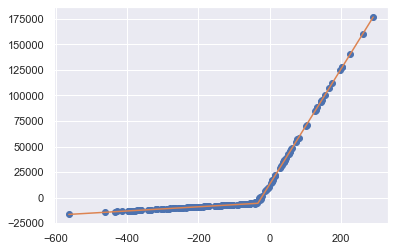

 15% (45 of 300) |###                    | Elapsed Time: 1:36:10 ETA:   8:35:21

Parameters([('x0', <Parameter 'x0', value=-0.8802842719305113 +/- 0.16, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=3868.688828790882 +/- 46.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.198, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=560.107588142057 +/- 0.54, bounds=[-inf:inf]>)])


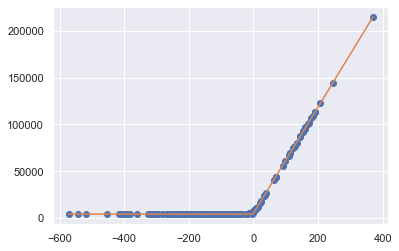

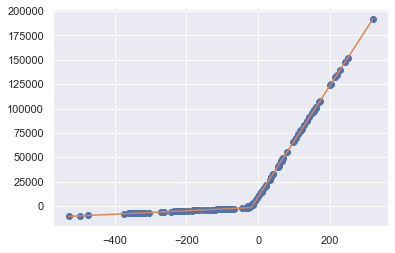

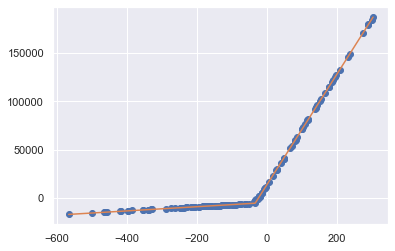

 15% (46 of 300) |###                    | Elapsed Time: 1:38:16 ETA:   8:52:17

Parameters([('x0', <Parameter 'x0', value=-1.5304517074173112 +/- 0.277, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=4209.11580861864 +/- 87.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.393, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=567.2124800693722 +/- 0.978, bounds=[-inf:inf]>)])


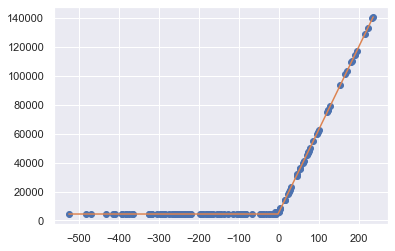

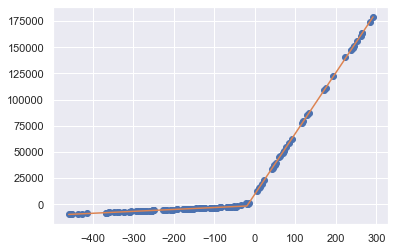

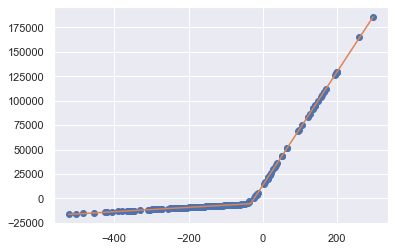

 15% (47 of 300) |###                    | Elapsed Time: 1:40:24 ETA:   8:59:42

Parameters([('x0', <Parameter 'x0', value=-2.360641057612351 +/- 0.212, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=4481.38185175143 +/- 72.9, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.307, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=573.752294458614 +/- 0.816, bounds=[-inf:inf]>)])


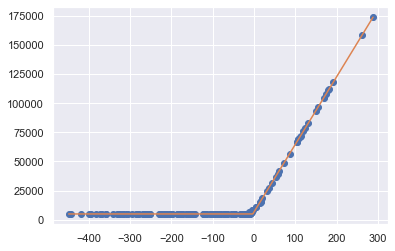

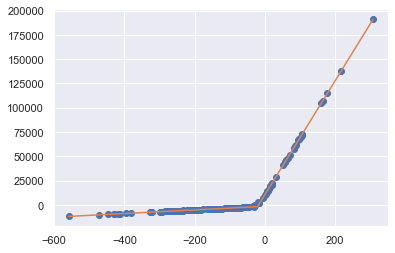

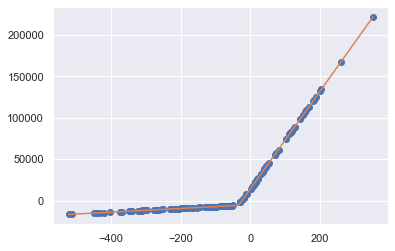

 16% (48 of 300) |###                    | Elapsed Time: 1:42:34 ETA:   9:08:07

Parameters([('x0', <Parameter 'x0', value=-3.0427952442043407 +/- 0.349, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=4869.375119037199 +/- 110, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.508, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=580.8545011063926 +/- 1.37, bounds=[-inf:inf]>)])


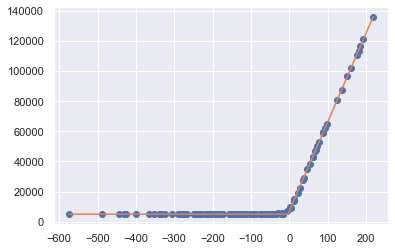

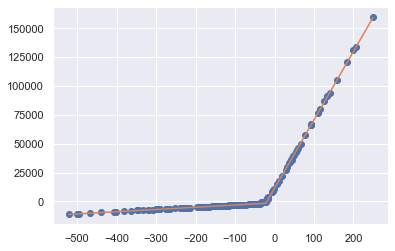

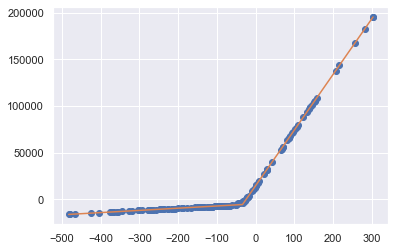

 16% (49 of 300) |###                    | Elapsed Time: 1:44:42 ETA:   8:53:14

Parameters([('x0', <Parameter 'x0', value=-3.3454170841518427 +/- 0.186, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5007.126635156426 +/- 54.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.255, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=589.314590106027 +/- 0.872, bounds=[-inf:inf]>)])


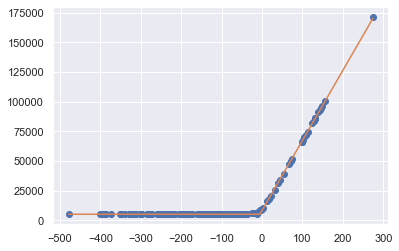

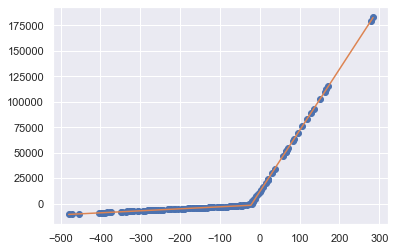

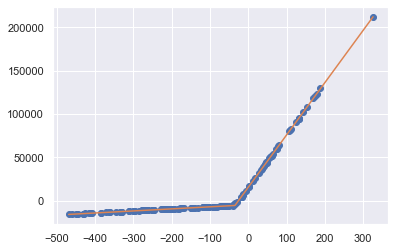

 16% (50 of 300) |###                    | Elapsed Time: 1:46:51 ETA:   8:58:57

Parameters([('x0', <Parameter 'x0', value=-5.555924193908936 +/- 0.296, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5145.9050348580095 +/- 92.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.432, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=590.1647184749944 +/- 1.33, bounds=[-inf:inf]>)])


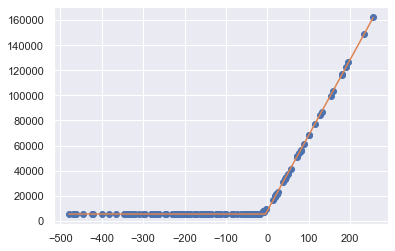

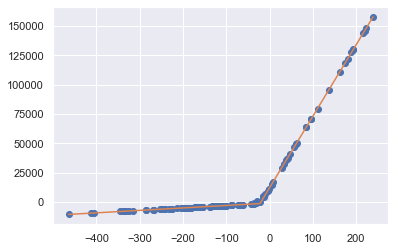

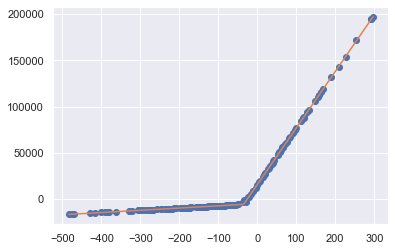

 17% (51 of 300) |###                    | Elapsed Time: 1:48:54 ETA:   8:29:50

Parameters([('x0', <Parameter 'x0', value=-4.778167163616524 +/- 0.284, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5440.053928342948 +/- 92.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.409, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=602.8225768285915 +/- 1.25, bounds=[-inf:inf]>)])


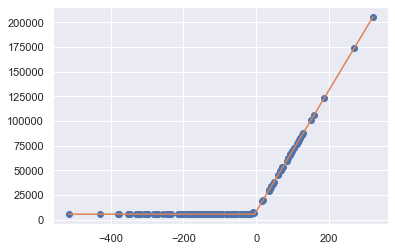

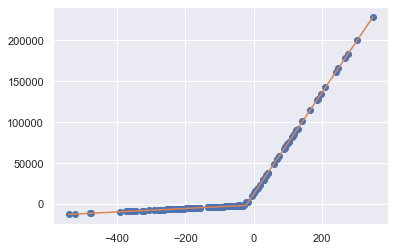

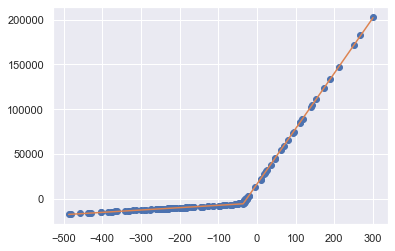

 17% (52 of 300) |###                    | Elapsed Time: 1:51:04 ETA:   8:58:12

Parameters([('x0', <Parameter 'x0', value=-4.377195239035382 +/- 0.206, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5699.653307484136 +/- 64.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.328, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=614.2849896762108 +/- 0.915, bounds=[-inf:inf]>)])


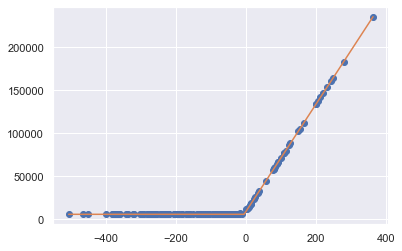

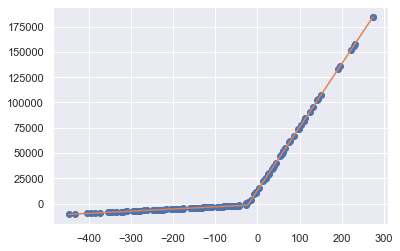

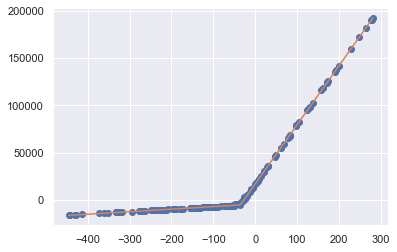

 17% (53 of 300) |####                   | Elapsed Time: 1:53:12 ETA:   8:47:19

Parameters([('x0', <Parameter 'x0', value=-4.994894780802266 +/- 0.199, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=5820.4186126792765 +/- 73.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.334, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=622.0591840233948 +/- 0.677, bounds=[-inf:inf]>)])


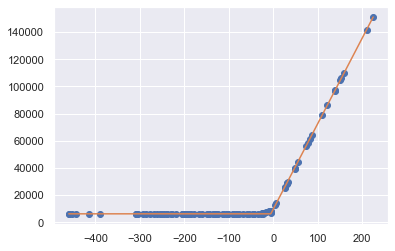

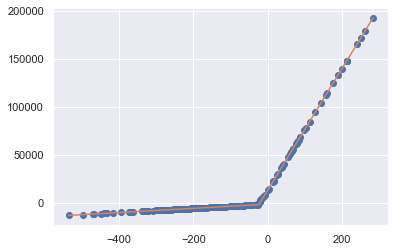

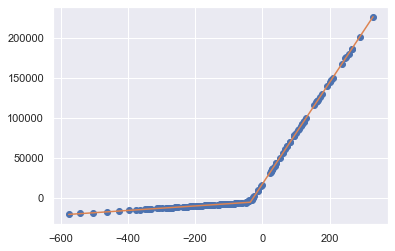

 18% (54 of 300) |####                   | Elapsed Time: 1:55:27 ETA:   9:14:10

Parameters([('x0', <Parameter 'x0', value=-5.204206225827617 +/- 0.288, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=6248.222229389129 +/- 103, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.496, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=628.1470897588283 +/- 1.42, bounds=[-inf:inf]>)])


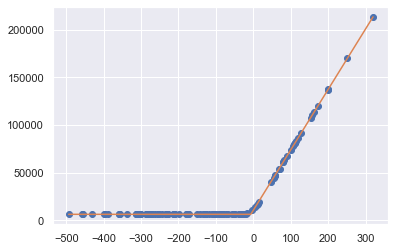

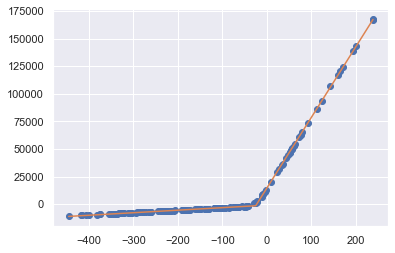

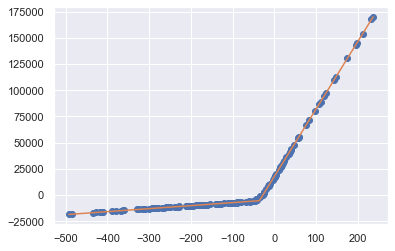

 18% (55 of 300) |####                   | Elapsed Time: 1:57:38 ETA:   8:53:12

Parameters([('x0', <Parameter 'x0', value=-6.655046296704921 +/- 0.251, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=6343.54813307091 +/- 86, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.379, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=633.713345521996 +/- 1, bounds=[-inf:inf]>)])


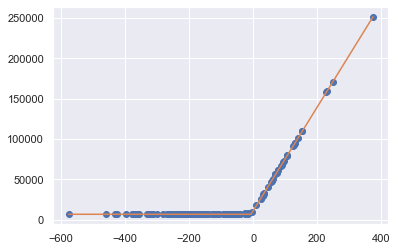

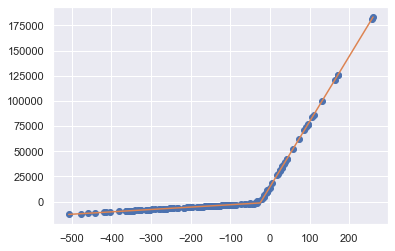

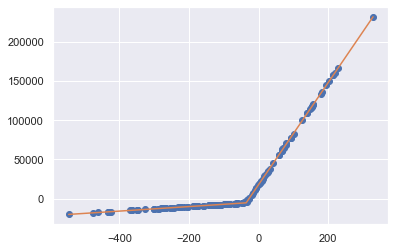

 18% (56 of 300) |####                   | Elapsed Time: 1:59:49 ETA:   8:52:57

Parameters([('x0', <Parameter 'x0', value=-6.931171415307904 +/- 0.171, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=6508.486974346127 +/- 61.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.275, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=642.6174722797766 +/- 0.69, bounds=[-inf:inf]>)])


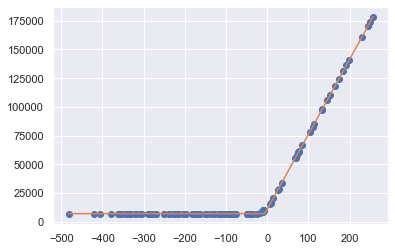

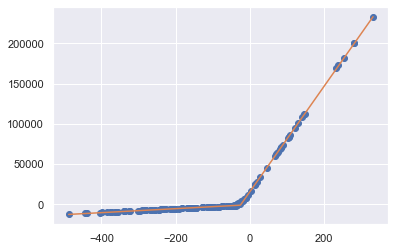

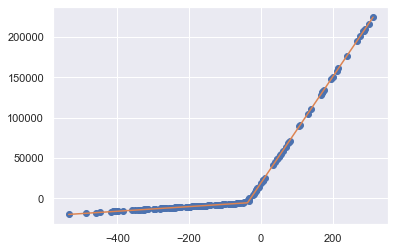

 19% (57 of 300) |####                   | Elapsed Time: 2:01:57 ETA:   8:37:36

Parameters([('x0', <Parameter 'x0', value=-6.0119370918418245 +/- 0.387, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=7157.388685038381 +/- 123, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.583, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=651.8126606447138 +/- 1.54, bounds=[-inf:inf]>)])


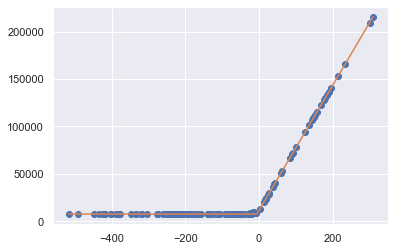

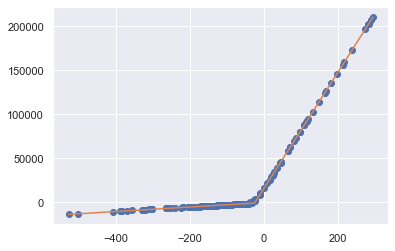

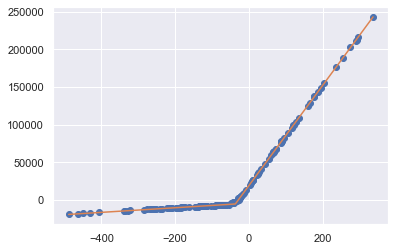

 19% (58 of 300) |####                   | Elapsed Time: 2:04:05 ETA:   8:38:36

Parameters([('x0', <Parameter 'x0', value=-5.914774036475879 +/- 0.208, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=7541.276873394517 +/- 68.7, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.307, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=659.741530964488 +/- 0.808, bounds=[-inf:inf]>)])


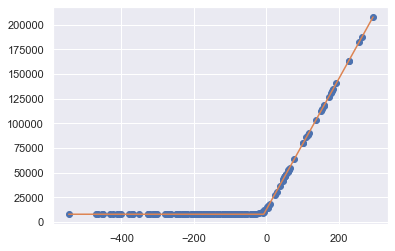

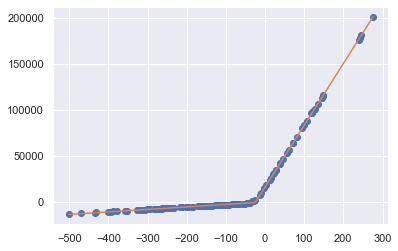

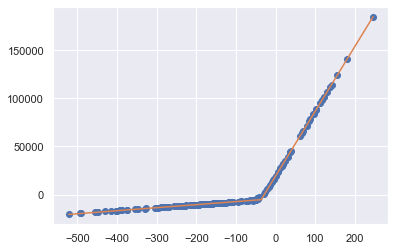

 19% (59 of 300) |####                   | Elapsed Time: 2:06:11 ETA:   8:24:51

Parameters([('x0', <Parameter 'x0', value=-7.387674809251687 +/- 0.242, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=7714.952375752414 +/- 94.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.416, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=664.2318814198572 +/- 0.971, bounds=[-inf:inf]>)])


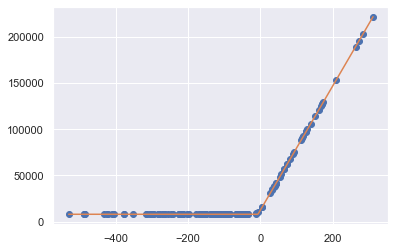

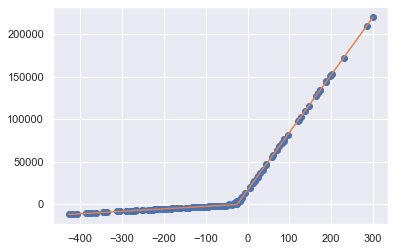

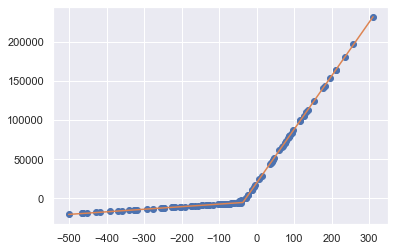

 20% (60 of 300) |####                   | Elapsed Time: 2:08:27 ETA:   9:02:14

Parameters([('x0', <Parameter 'x0', value=-6.990289297936396 +/- 0.156, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=7864.364096870021 +/- 53.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.251, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=674.1135414653586 +/- 0.637, bounds=[-inf:inf]>)])


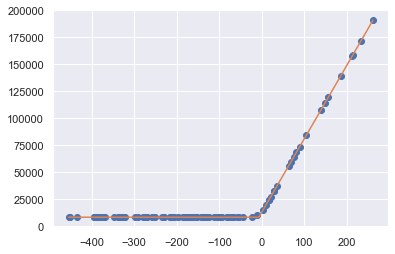

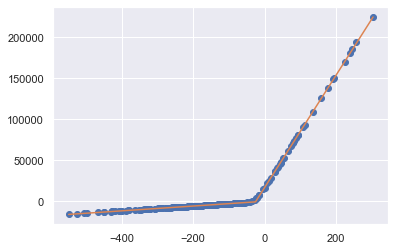

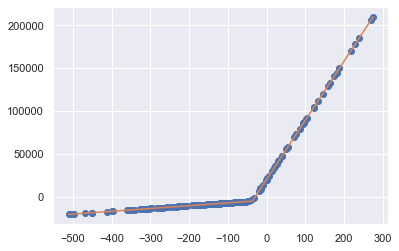

 20% (61 of 300) |####                   | Elapsed Time: 2:10:40 ETA:   8:52:06

Parameters([('x0', <Parameter 'x0', value=-7.148744731879224 +/- 0.185, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=8032.912884282623 +/- 70.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.304, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=681.8758111526298 +/- 0.785, bounds=[-inf:inf]>)])


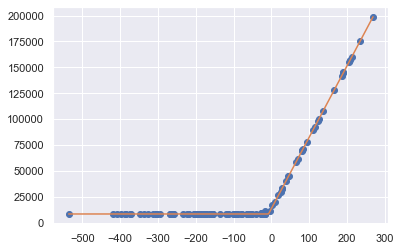

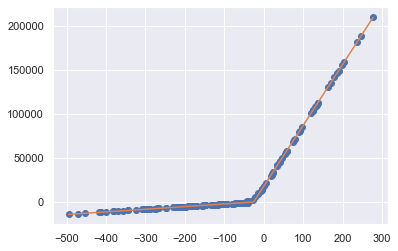

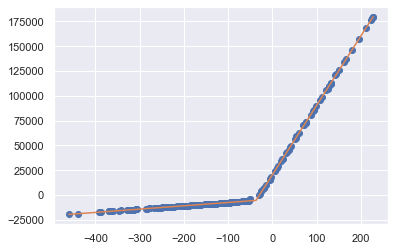

 20% (62 of 300) |####                   | Elapsed Time: 2:12:50 ETA:   8:33:46

Parameters([('x0', <Parameter 'x0', value=-7.428673865253071 +/- 0.257, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=8442.271545570005 +/- 86.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.427, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=688.8892786152568 +/- 1.12, bounds=[-inf:inf]>)])


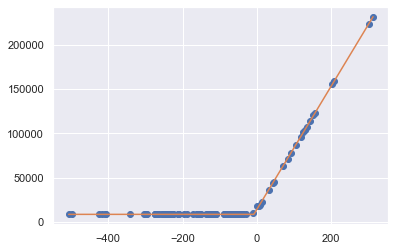

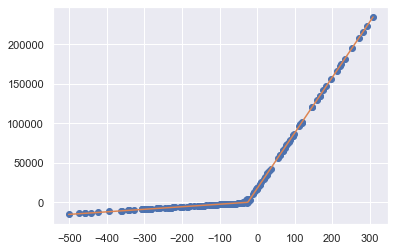

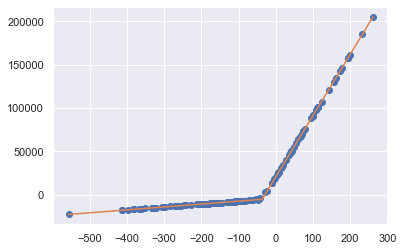

 21% (63 of 300) |####                   | Elapsed Time: 2:15:06 ETA:   8:56:38

Parameters([('x0', <Parameter 'x0', value=-8.328603052193577 +/- 0.197, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=8501.899995541045 +/- 66.8, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.327, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=695.1735585863901 +/- 0.805, bounds=[-inf:inf]>)])


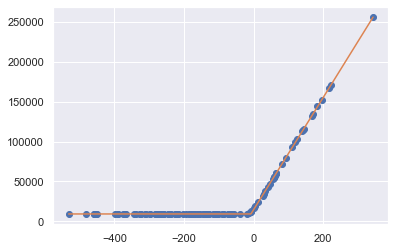

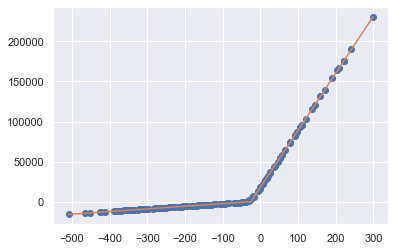

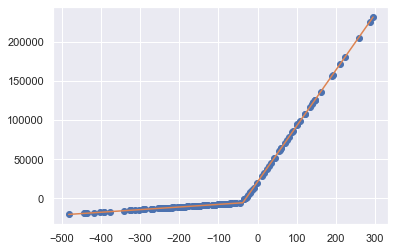

 21% (64 of 300) |####                   | Elapsed Time: 2:17:16 ETA:   8:34:26

Parameters([('x0', <Parameter 'x0', value=-7.55645672244385 +/- 0.348, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=9065.623343620868 +/- 144, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.582, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=703.9375517412846 +/- 1.49, bounds=[-inf:inf]>)])


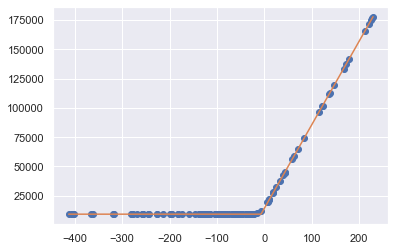

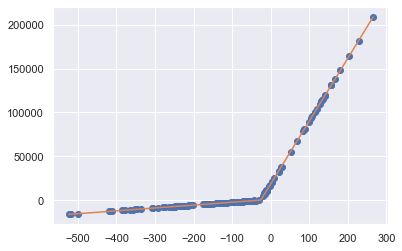

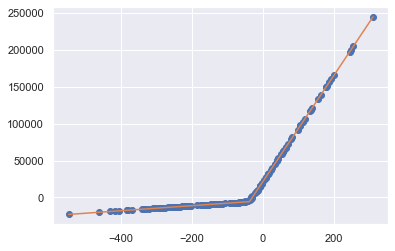

 21% (65 of 300) |####                   | Elapsed Time: 2:19:25 ETA:   8:24:49

Parameters([('x0', <Parameter 'x0', value=-7.2565945101048515 +/- 0.197, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=9262.473606186702 +/- 68, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.383, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=713.6566770833381 +/- 0.928, bounds=[-inf:inf]>)])


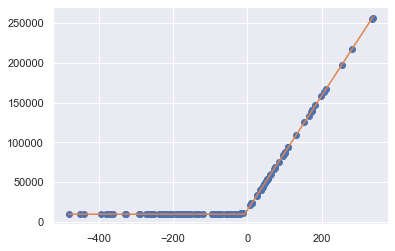

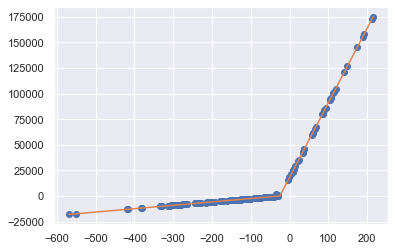

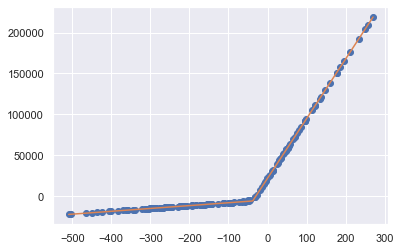

 22% (66 of 300) |#####                  | Elapsed Time: 2:21:29 ETA:   8:03:28

Parameters([('x0', <Parameter 'x0', value=-7.391780548800141 +/- 0.16, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=9545.242512303359 +/- 70.1, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.358, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=718.996175299498 +/- 0.653, bounds=[-inf:inf]>)])


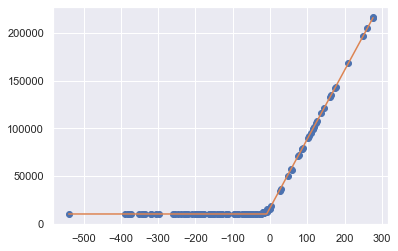

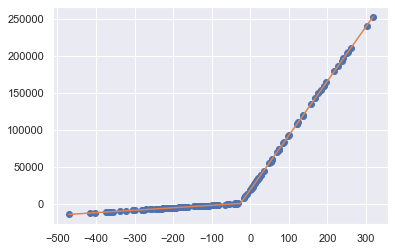

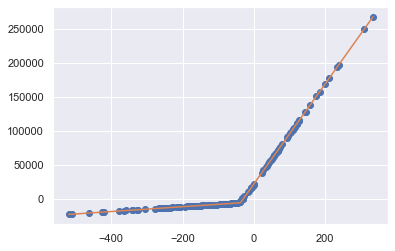

 22% (67 of 300) |#####                  | Elapsed Time: 2:23:40 ETA:   8:27:11

Parameters([('x0', <Parameter 'x0', value=-8.913349053629318 +/- 0.356, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=9985.93930078375 +/- 146, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.734, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=721.7963280956951 +/- 1.51, bounds=[-inf:inf]>)])


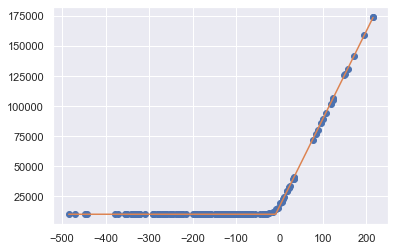

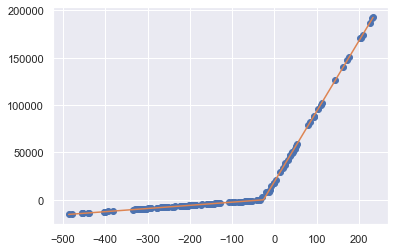

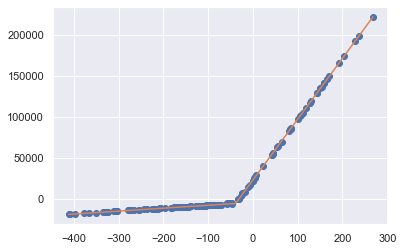

 22% (68 of 300) |#####                  | Elapsed Time: 2:25:50 ETA:   8:20:58

Parameters([('x0', <Parameter 'x0', value=-8.858777964925636 +/- 0.205, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=10113.011583212989 +/- 81.3, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.384, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=730.6115423861163 +/- 1.14, bounds=[-inf:inf]>)])


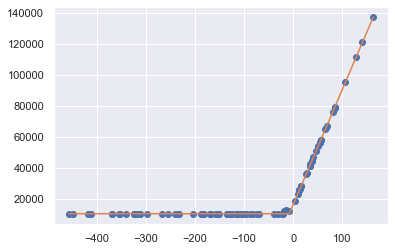

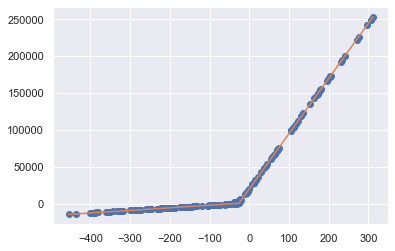

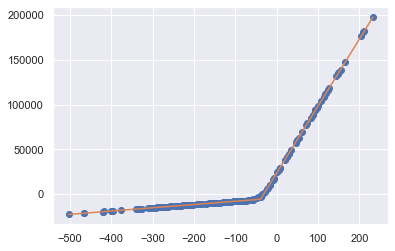

 23% (69 of 300) |#####                  | Elapsed Time: 2:28:04 ETA:   8:36:35

Parameters([('x0', <Parameter 'x0', value=-7.666352982302942 +/- 0.255, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=10547.336289918101 +/- 110, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.497, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=742.1473755104558 +/- 2.1, bounds=[-inf:inf]>)])


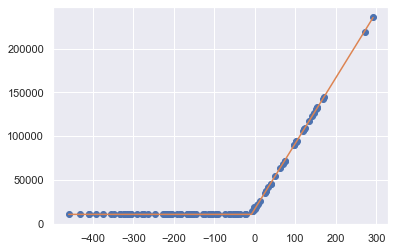

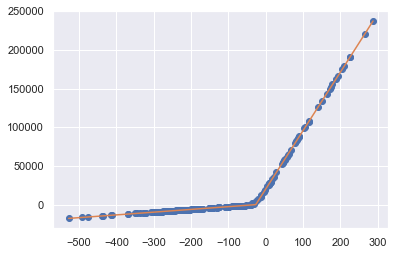

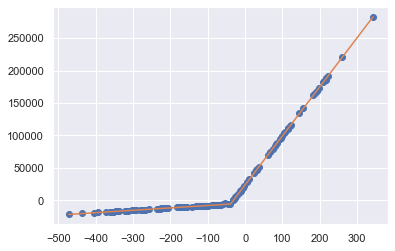

 23% (70 of 300) |#####                  | Elapsed Time: 2:30:21 ETA:   8:44:26

Parameters([('x0', <Parameter 'x0', value=-8.528392929137434 +/- 0.218, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=10597.252276075344 +/- 106, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.484, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=748.3210629920817 +/- 1.04, bounds=[-inf:inf]>)])


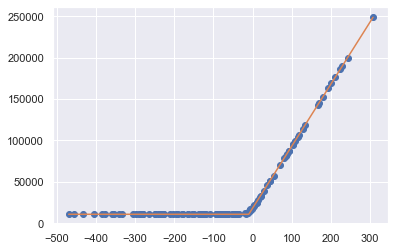

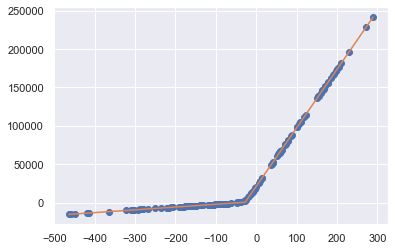

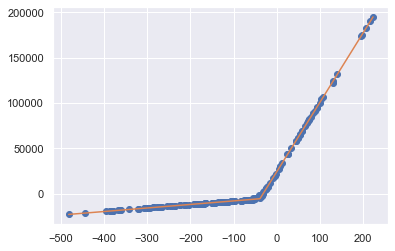

 23% (71 of 300) |#####                  | Elapsed Time: 2:32:31 ETA:   8:17:37

Parameters([('x0', <Parameter 'x0', value=-9.900174546576944 +/- 0.324, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=10762.719894990974 +/- 159, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.765, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=750.3716721872643 +/- 1.43, bounds=[-inf:inf]>)])


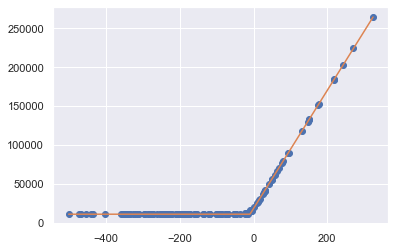

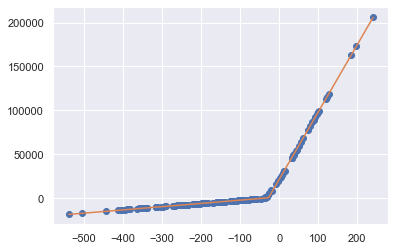

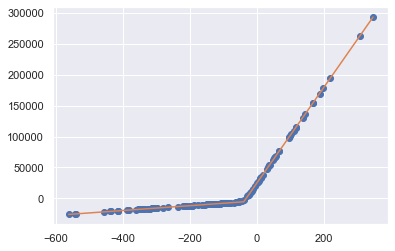

 24% (72 of 300) |#####                  | Elapsed Time: 2:34:41 ETA:   8:15:59

Parameters([('x0', <Parameter 'x0', value=-9.945924304748232 +/- 0.281, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11020.66555215062 +/- 133, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.563, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=758.8702045149254 +/- 1.25, bounds=[-inf:inf]>)])


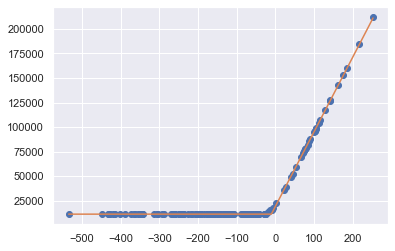

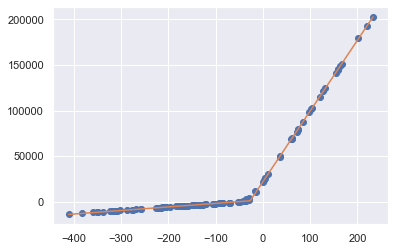

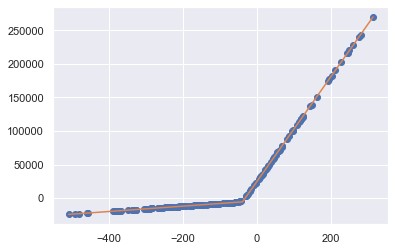

 24% (73 of 300) |#####                  | Elapsed Time: 2:36:42 ETA:   7:37:14

Parameters([('x0', <Parameter 'x0', value=-10.573560404842949 +/- 0.357, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11283.523070754714 +/- 125, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.566, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=760.9604547420043 +/- 2, bounds=[-inf:inf]>)])


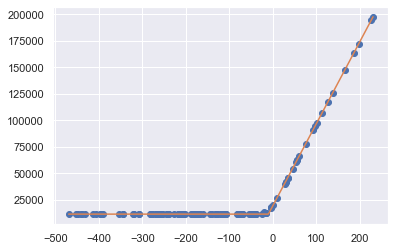

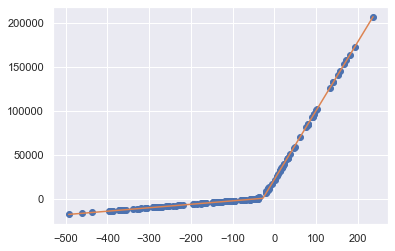

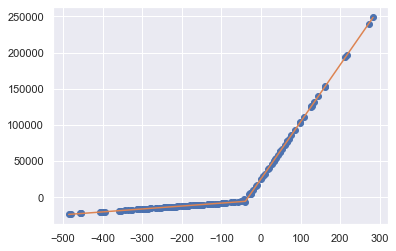

 24% (74 of 300) |#####                  | Elapsed Time: 2:38:54 ETA:   8:15:51

Parameters([('x0', <Parameter 'x0', value=-9.876465745098105 +/- 0.197, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11545.21641038937 +/- 78.4, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.345, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=773.5915210672307 +/- 1.12, bounds=[-inf:inf]>)])


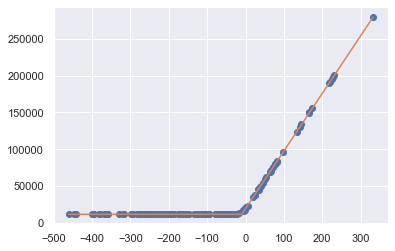

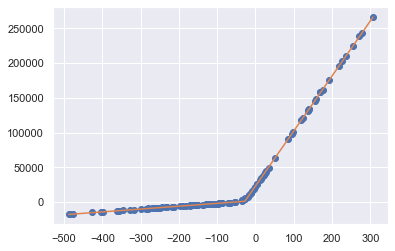

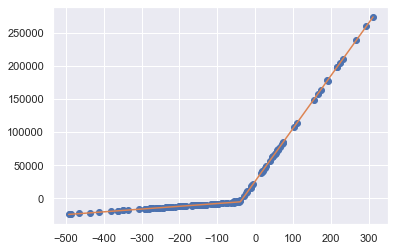

 25% (75 of 300) |#####                  | Elapsed Time: 2:41:02 ETA:   7:59:04

Parameters([('x0', <Parameter 'x0', value=-10.012037359678303 +/- 0.191, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11658.49044171058 +/- 87.6, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.421, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=782.0201505078769 +/- 0.923, bounds=[-inf:inf]>)])


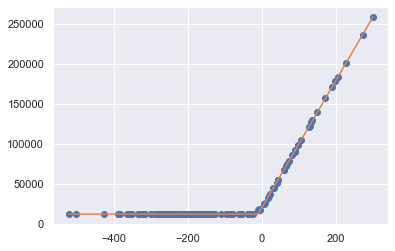

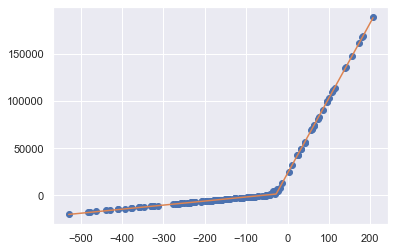

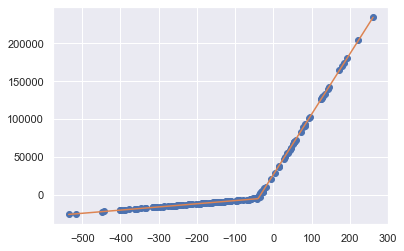

 25% (76 of 300) |#####                  | Elapsed Time: 2:43:11 ETA:   8:03:50

Parameters([('x0', <Parameter 'x0', value=-10.08015880833663 +/- 0.307, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11975.01307809612 +/- 152, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.686, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=791.4362752136886 +/- 1.44, bounds=[-inf:inf]>)])


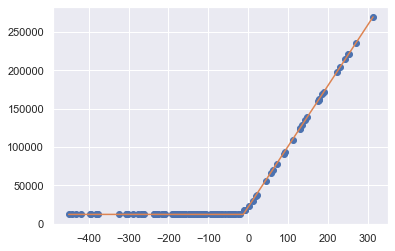

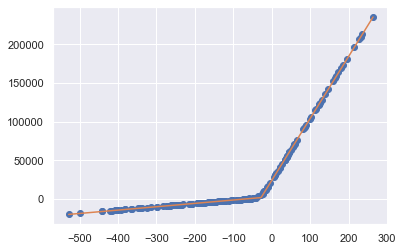

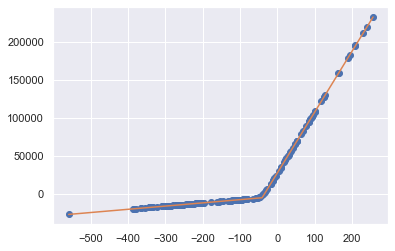

 25% (77 of 300) |#####                  | Elapsed Time: 2:45:25 ETA:   8:15:45

Parameters([('x0', <Parameter 'x0', value=-12.00037326569406 +/- 0.341, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=11992.168928336148 +/- 149, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.721, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=791.716702412193 +/- 1.35, bounds=[-inf:inf]>)])


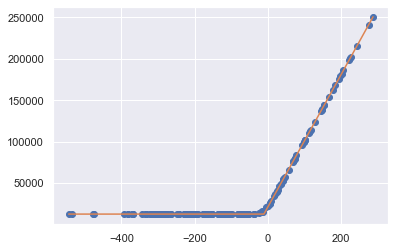

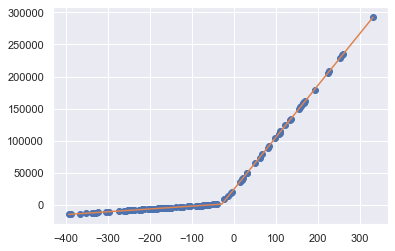

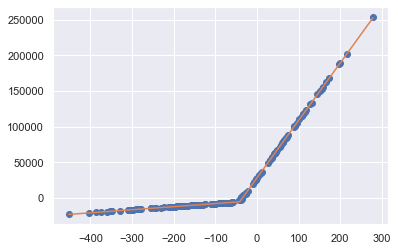

 26% (78 of 300) |#####                  | Elapsed Time: 2:47:27 ETA:   7:30:52

Parameters([('x0', <Parameter 'x0', value=-11.239672417007426 +/- 0.217, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=12377.53319265328 +/- 108, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.48, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=800.7969730260729 +/- 0.988, bounds=[-inf:inf]>)])


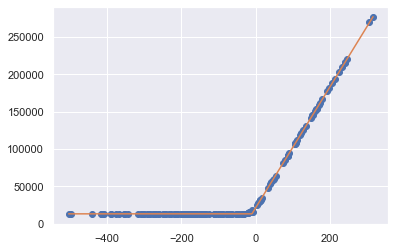

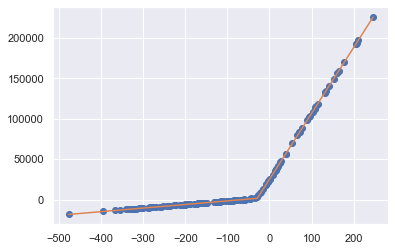

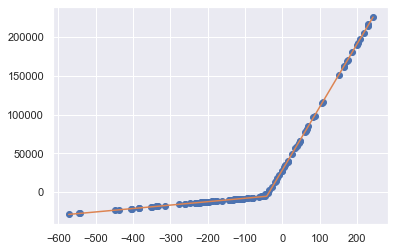

 26% (79 of 300) |######                 | Elapsed Time: 2:49:36 ETA:   7:56:51

Parameters([('x0', <Parameter 'x0', value=-10.260096802632194 +/- 0.292, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=13133.589992326322 +/- 138, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.63, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=809.483802261267 +/- 1.26, bounds=[-inf:inf]>)])


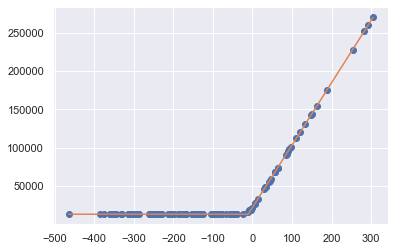

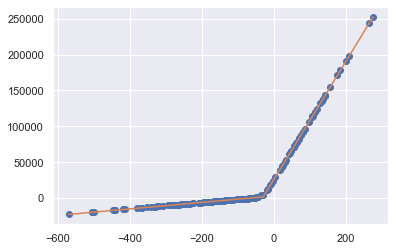

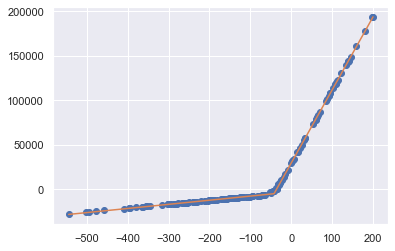

 26% (80 of 300) |######                 | Elapsed Time: 2:51:47 ETA:   8:01:35

Parameters([('x0', <Parameter 'x0', value=-10.93301047363298 +/- 0.255, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=13367.891072310551 +/- 137, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.64, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=812.1088659586527 +/- 1.15, bounds=[-inf:inf]>)])


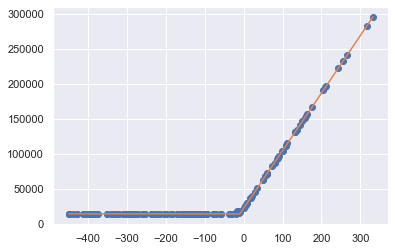

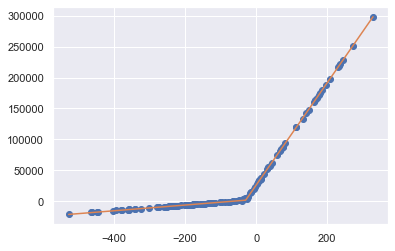

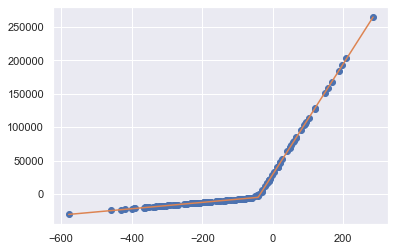

 27% (81 of 300) |######                 | Elapsed Time: 2:53:52 ETA:   7:34:01

Parameters([('x0', <Parameter 'x0', value=-9.722322954903271 +/- 0.273, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=14130.563215758177 +/- 128, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.531, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=823.6897760663848 +/- 1.23, bounds=[-inf:inf]>)])


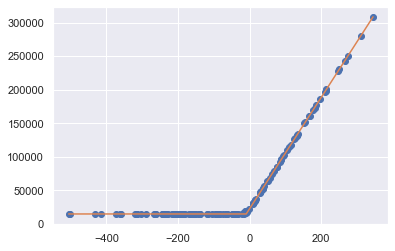

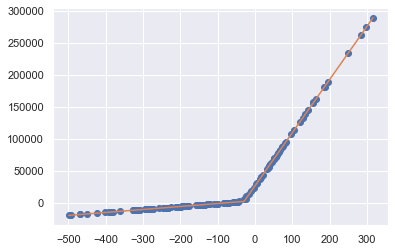

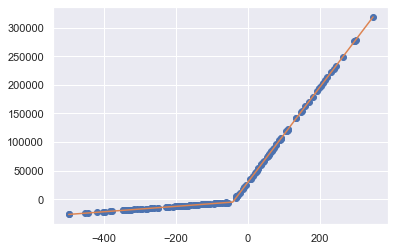

 27% (82 of 300) |######                 | Elapsed Time: 2:56:01 ETA:   7:48:59

Parameters([('x0', <Parameter 'x0', value=-9.402995846947185 +/- 0.281, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=14786.772093182466 +/- 156, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.753, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=829.5273531486183 +/- 1.16, bounds=[-inf:inf]>)])


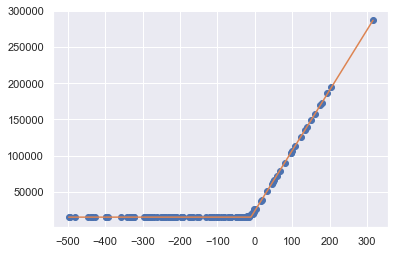

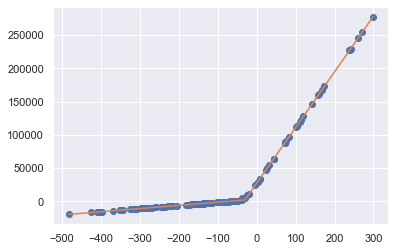

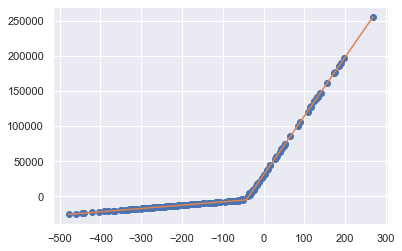

 27% (83 of 300) |######                 | Elapsed Time: 2:58:03 ETA:   7:22:52

Parameters([('x0', <Parameter 'x0', value=-10.293875267799823 +/- 0.261, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=15154.31269394899 +/- 111, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.476, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=831.9620227103651 +/- 1.44, bounds=[-inf:inf]>)])


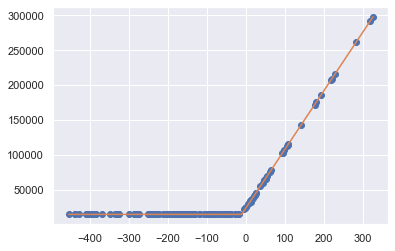

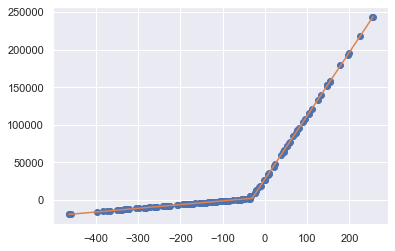

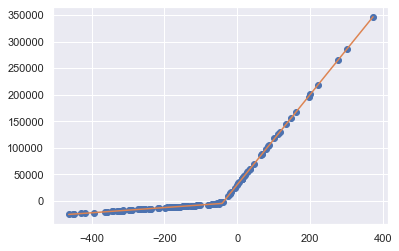

 28% (84 of 300) |######                 | Elapsed Time: 3:00:12 ETA:   7:44:19

Parameters([('x0', <Parameter 'x0', value=-10.605373830455763 +/- 0.144, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=15206.561454027233 +/- 79, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.37, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=839.6772286956201 +/- 0.687, bounds=[-inf:inf]>)])


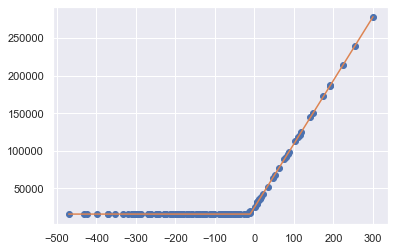

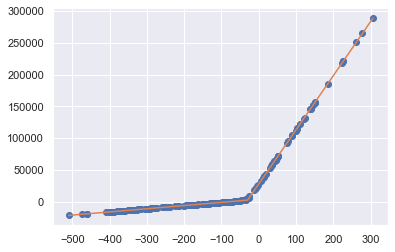

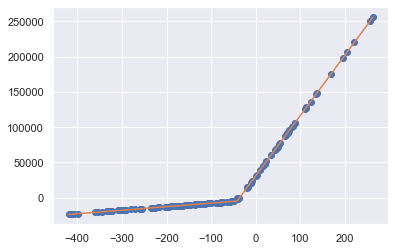

 28% (85 of 300) |######                 | Elapsed Time: 3:02:27 ETA:   8:01:57

Parameters([('x0', <Parameter 'x0', value=-10.695782590550158 +/- 0.231, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=15626.653233437673 +/- 108, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.531, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=845.2770328998475 +/- 1.25, bounds=[-inf:inf]>)])


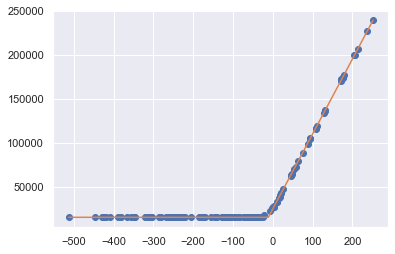

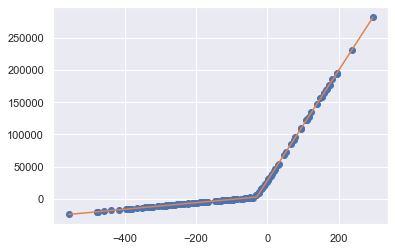

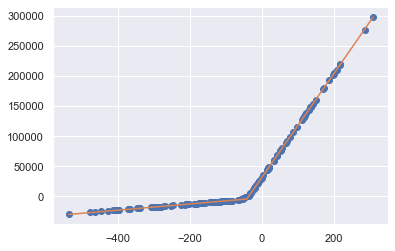

 28% (86 of 300) |######                 | Elapsed Time: 3:04:36 ETA:   7:40:09

Parameters([('x0', <Parameter 'x0', value=-11.338275660241617 +/- 0.222, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=15731.953151758958 +/- 115, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.527, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=850.896896017622 +/- 1.22, bounds=[-inf:inf]>)])


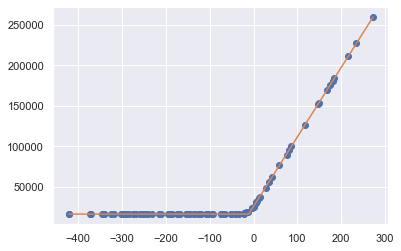

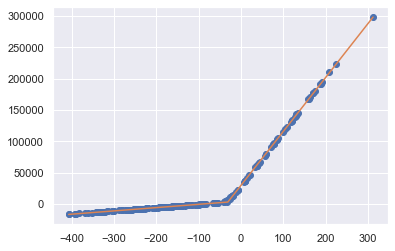

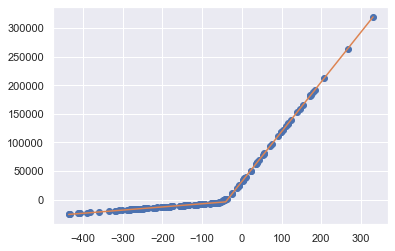

 29% (87 of 300) |######                 | Elapsed Time: 3:06:53 ETA:   8:06:21

Parameters([('x0', <Parameter 'x0', value=-11.332004910944699 +/- 0.237, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=16101.281611651533 +/- 122, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.578, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=858.1347357147954 +/- 1.22, bounds=[-inf:inf]>)])


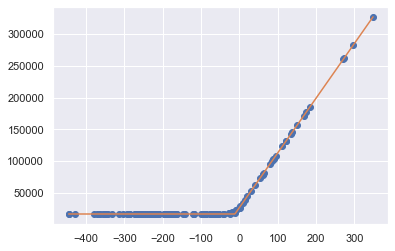

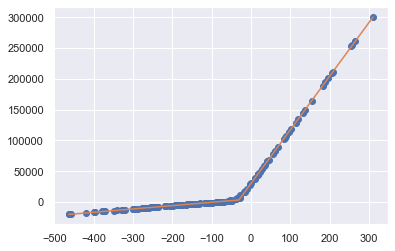

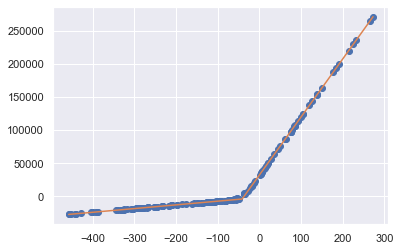

 29% (88 of 300) |######                 | Elapsed Time: 3:09:02 ETA:   7:35:07

Parameters([('x0', <Parameter 'x0', value=-11.713027175329945 +/- 0.315, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=16742.03922989711 +/- 161, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.745, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=860.6848223187897 +/- 1.48, bounds=[-inf:inf]>)])


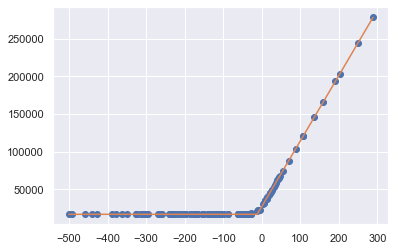

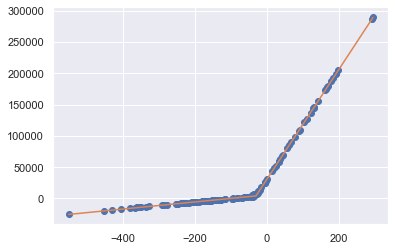

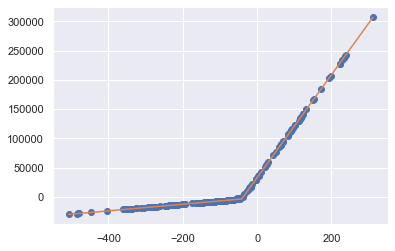

 29% (89 of 300) |######                 | Elapsed Time: 3:11:07 ETA:   7:22:48

Parameters([('x0', <Parameter 'x0', value=-12.049750931998847 +/- 0.247, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=16871.206056696665 +/- 138, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.644, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=868.8928837756608 +/- 1.58, bounds=[-inf:inf]>)])


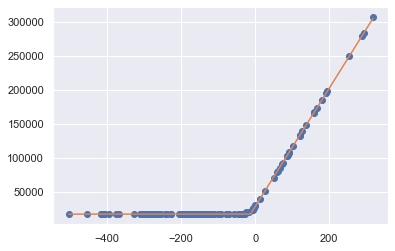

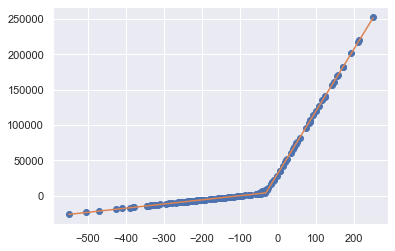

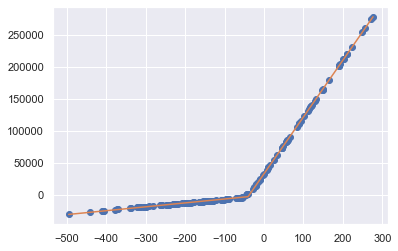

 30% (90 of 300) |######                 | Elapsed Time: 3:13:16 ETA:   7:31:12

Parameters([('x0', <Parameter 'x0', value=-12.876192502848646 +/- 0.296, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=17257.307049278177 +/- 149, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.71, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=871.1129110827932 +/- 1.4, bounds=[-inf:inf]>)])


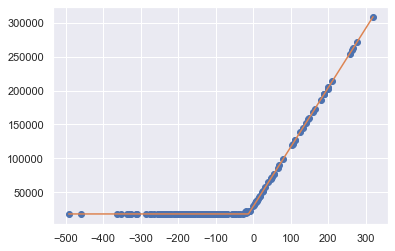

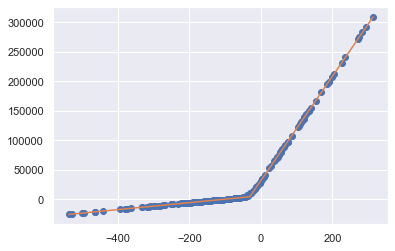

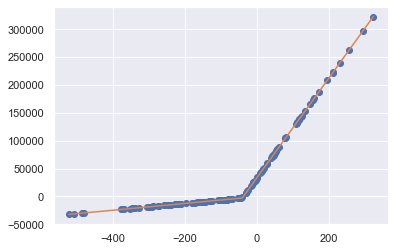

 30% (91 of 300) |######                 | Elapsed Time: 3:15:25 ETA:   7:29:15

Parameters([('x0', <Parameter 'x0', value=-12.455084293968183 +/- 0.271, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=17920.890488732057 +/- 153, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.834, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=875.253928506231 +/- 1.24, bounds=[-inf:inf]>)])


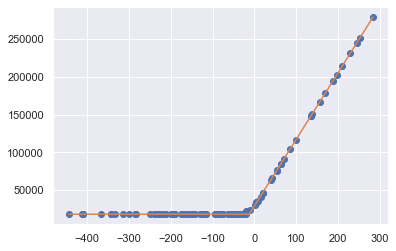

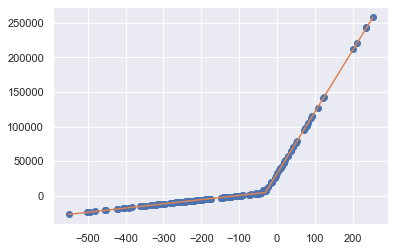

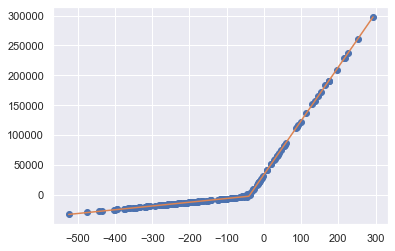

 30% (92 of 300) |#######                | Elapsed Time: 3:17:37 ETA:   7:35:54

Parameters([('x0', <Parameter 'x0', value=-12.626280094526825 +/- 0.237, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=18122.717882925903 +/- 120, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.648, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=881.6199150632617 +/- 1.21, bounds=[-inf:inf]>)])


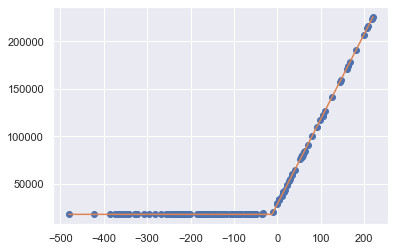

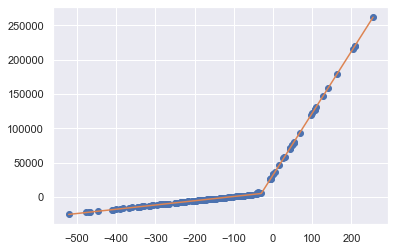

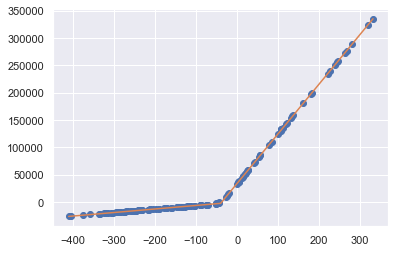

 31% (93 of 300) |#######                | Elapsed Time: 3:19:46 ETA:   7:24:39

Parameters([('x0', <Parameter 'x0', value=-12.281303352414081 +/- 0.102, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=18164.2311319846 +/- 59.1, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.295, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=891.6138158024248 +/- 0.607, bounds=[-inf:inf]>)])


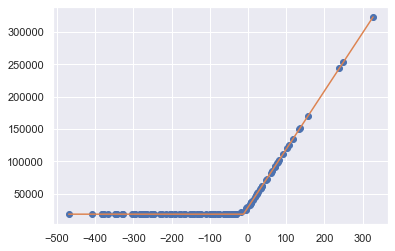

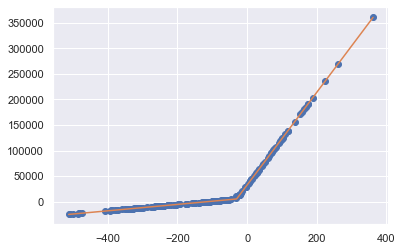

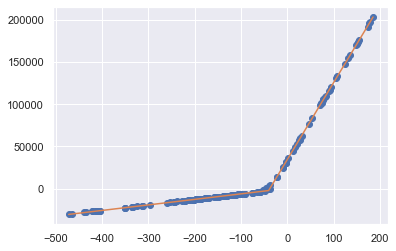

 31% (94 of 300) |#######                | Elapsed Time: 3:22:01 ETA:   7:44:34

Parameters([('x0', <Parameter 'x0', value=-11.813189762542766 +/- 0.232, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=18511.07603717524 +/- 145, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.675, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=898.9044244787441 +/- 1.4, bounds=[-inf:inf]>)])


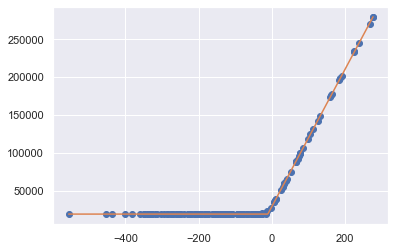

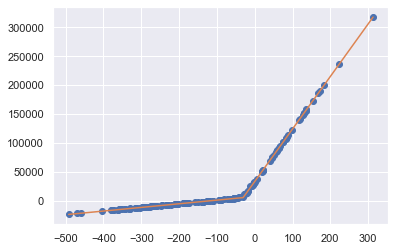

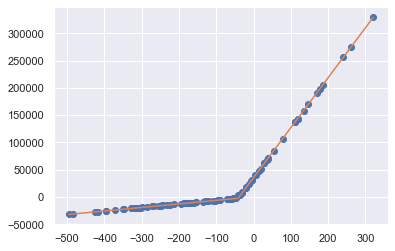

 31% (95 of 300) |#######                | Elapsed Time: 3:24:15 ETA:   7:38:03

Parameters([('x0', <Parameter 'x0', value=-11.461778153232004 +/- 0.201, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=18917.760226754344 +/- 100, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.481, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=908.3831461488878 +/- 1.07, bounds=[-inf:inf]>)])


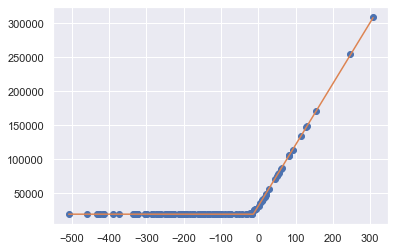

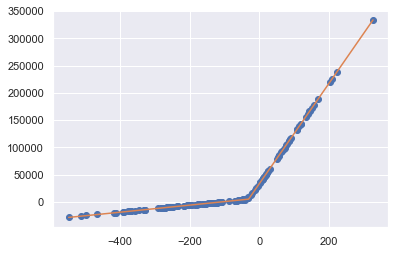

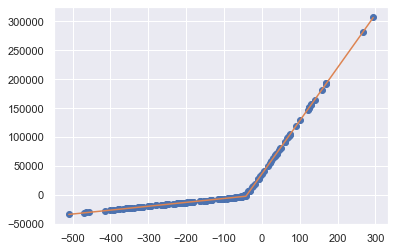

 32% (96 of 300) |#######                | Elapsed Time: 3:26:25 ETA:   7:22:24

Parameters([('x0', <Parameter 'x0', value=-13.211442817082325 +/- 0.359, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=19237.81807894535 +/- 198, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.881, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=901.0152096279886 +/- 2.38, bounds=[-inf:inf]>)])


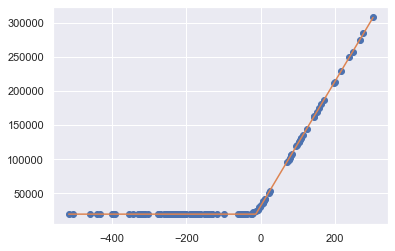

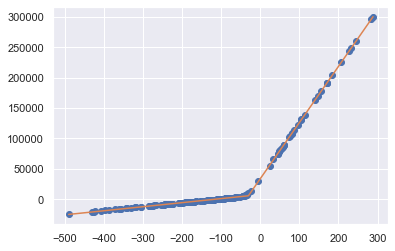

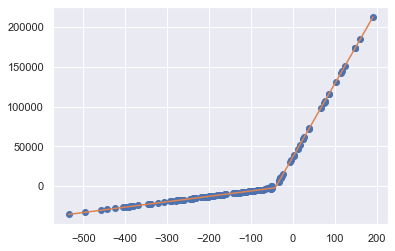

 32% (97 of 300) |#######                | Elapsed Time: 3:28:34 ETA:   7:17:02

Parameters([('x0', <Parameter 'x0', value=-13.112411495166679 +/- 0.259, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=19614.218056931644 +/- 152, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.655, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=911.3408161608374 +/- 1.24, bounds=[-inf:inf]>)])


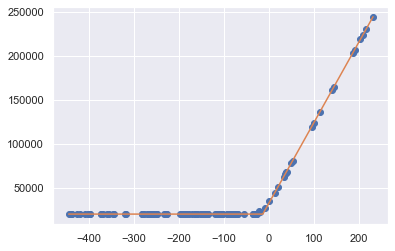

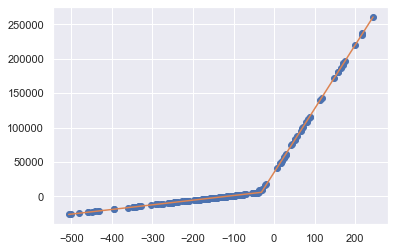

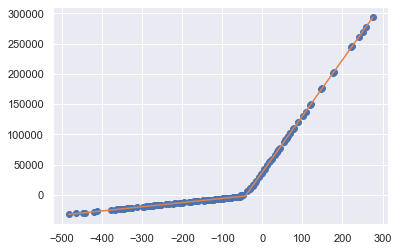

 32% (98 of 300) |#######                | Elapsed Time: 3:30:46 ETA:   7:24:34

Parameters([('x0', <Parameter 'x0', value=-13.15231268063784 +/- 0.266, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=19953.853133107932 +/- 115, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.517, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=916.9783450200952 +/- 1.59, bounds=[-inf:inf]>)])


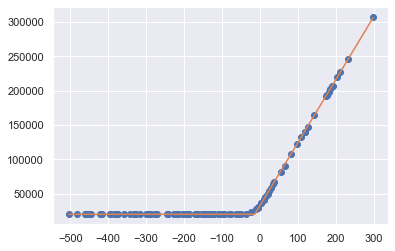

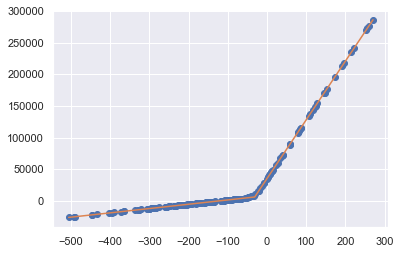

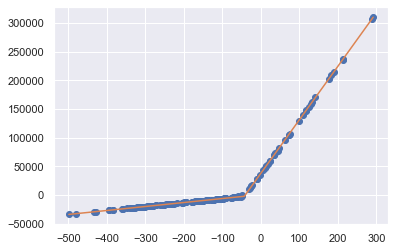

 33% (99 of 300) |#######                | Elapsed Time: 3:33:01 ETA:   7:29:11

Parameters([('x0', <Parameter 'x0', value=-14.03418688332383 +/- 0.296, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=20114.714445859252 +/- 179, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.705, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=916.7720756648848 +/- 1.46, bounds=[-inf:inf]>)])


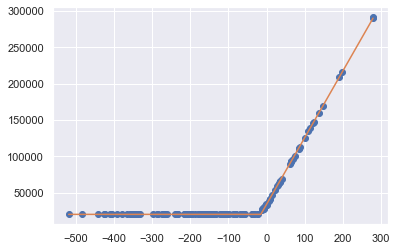

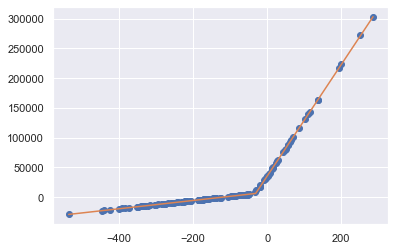

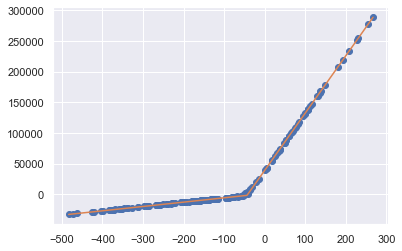

 33% (100 of 300) |#######               | Elapsed Time: 3:35:07 ETA:   6:59:49

Parameters([('x0', <Parameter 'x0', value=-15.055505495722914 +/- 0.302, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=20162.36494701422 +/- 180, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.821, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=918.0535383269882 +/- 1.92, bounds=[-inf:inf]>)])


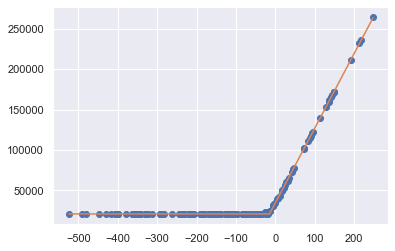

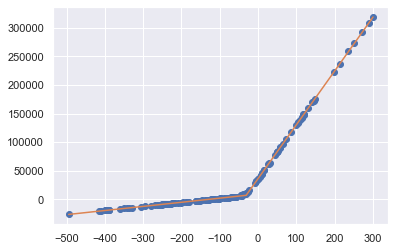

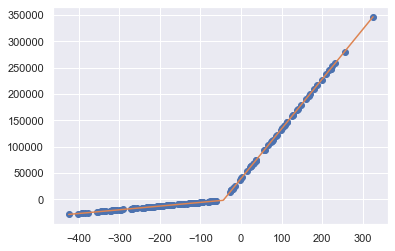

 33% (101 of 300) |#######               | Elapsed Time: 3:37:14 ETA:   7:01:58

Parameters([('x0', <Parameter 'x0', value=-15.005685892181315 +/- 0.298, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=20726.502352934996 +/- 171, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.731, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=924.8599738322326 +/- 1.93, bounds=[-inf:inf]>)])


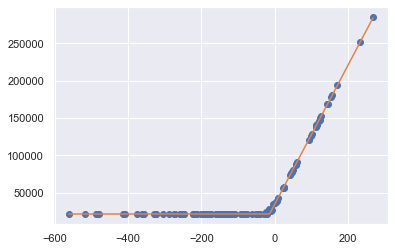

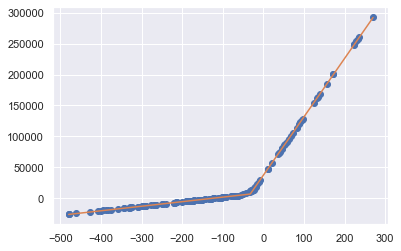

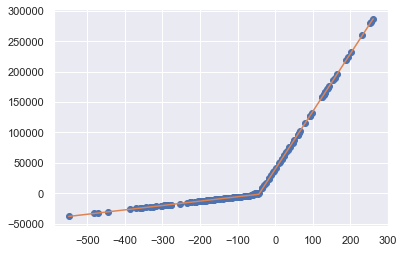

 34% (102 of 300) |#######               | Elapsed Time: 3:39:21 ETA:   7:01:34

Parameters([('x0', <Parameter 'x0', value=-14.46716611287063 +/- 0.318, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=21236.737596429524 +/- 157, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.743, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=931.6224662858463 +/- 2.08, bounds=[-inf:inf]>)])


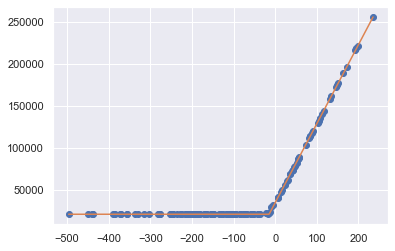

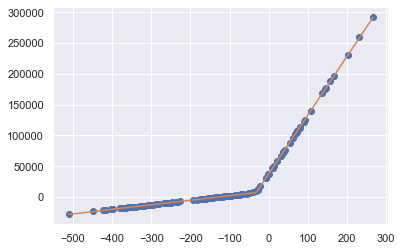

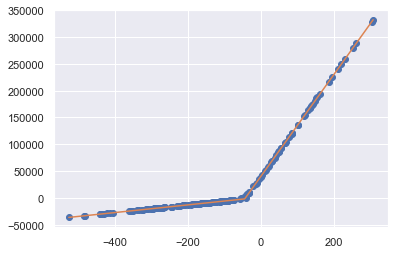

 34% (103 of 300) |#######               | Elapsed Time: 3:41:26 ETA:   6:50:19

Parameters([('x0', <Parameter 'x0', value=-14.674312775427117 +/- 0.211, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=21417.217512361825 +/- 118, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.563, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=937.4463922062782 +/- 1.39, bounds=[-inf:inf]>)])


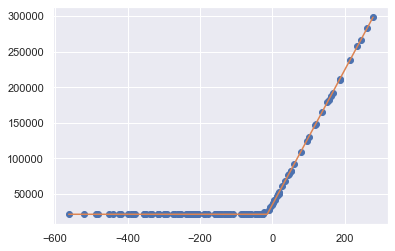

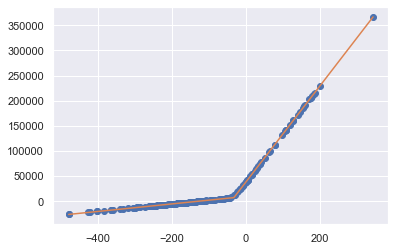

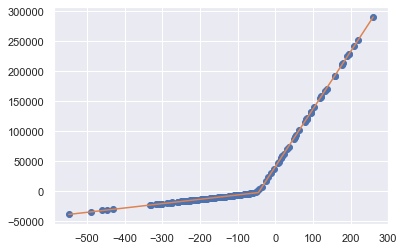

 34% (104 of 300) |#######               | Elapsed Time: 3:43:39 ETA:   7:12:44

Parameters([('x0', <Parameter 'x0', value=-14.566176572922625 +/- 0.22, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=21595.757241705825 +/- 124, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.515, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=947.6834619784546 +/- 1.2, bounds=[-inf:inf]>)])


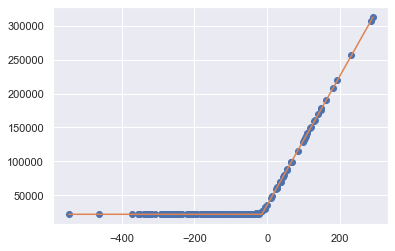

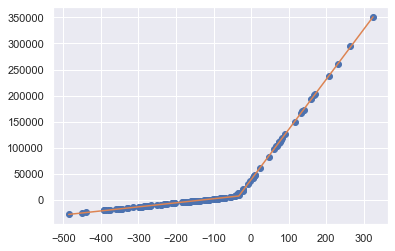

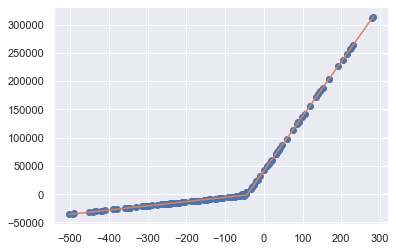

 35% (105 of 300) |#######               | Elapsed Time: 3:45:45 ETA:   6:48:25

Parameters([('x0', <Parameter 'x0', value=-14.725460965514474 +/- 0.176, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=21763.346026089264 +/- 93.5, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.471, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=953.7118247795834 +/- 1.08, bounds=[-inf:inf]>)])


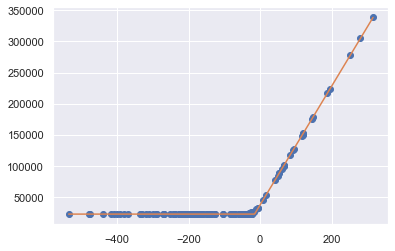

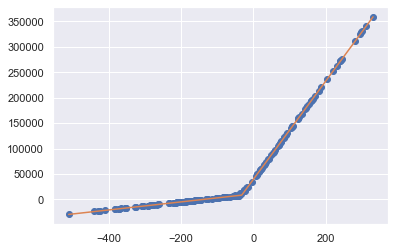

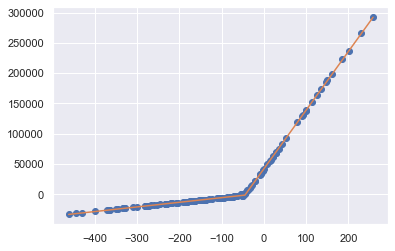

 35% (106 of 300) |#######               | Elapsed Time: 3:48:00 ETA:   7:16:27

Parameters([('x0', <Parameter 'x0', value=-15.366835886055965 +/- 0.331, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=22240.581715809345 +/- 153, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.725, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=954.6023003787654 +/- 1.92, bounds=[-inf:inf]>)])


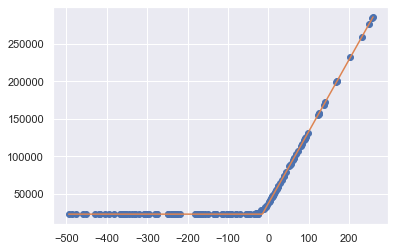

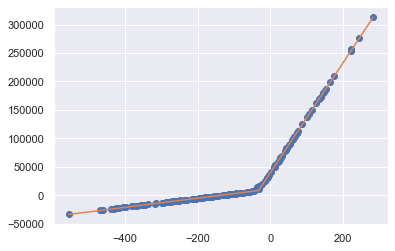

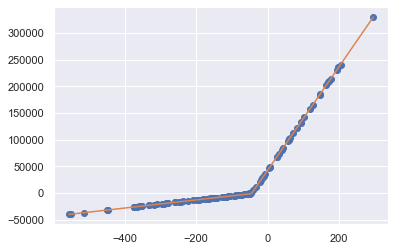

 35% (107 of 300) |#######               | Elapsed Time: 3:50:10 ETA:   6:59:47

Parameters([('x0', <Parameter 'x0', value=-15.140803499323711 +/- 0.22, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=22581.05221856177 +/- 144, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.599, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=961.9896565561984 +/- 1.37, bounds=[-inf:inf]>)])


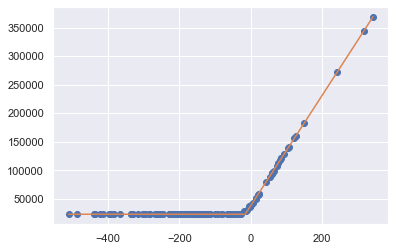

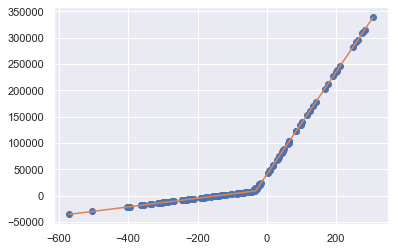

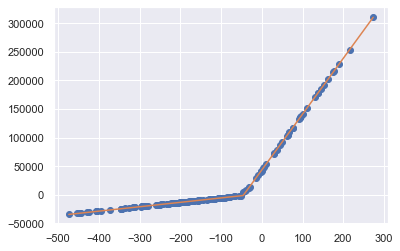

 36% (108 of 300) |#######               | Elapsed Time: 3:52:20 ETA:   6:56:42

Parameters([('x0', <Parameter 'x0', value=-15.42636217800968 +/- 0.245, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=22873.88497054254 +/- 147, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.678, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=964.0794197389498 +/- 1.48, bounds=[-inf:inf]>)])


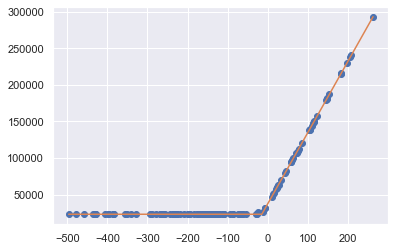

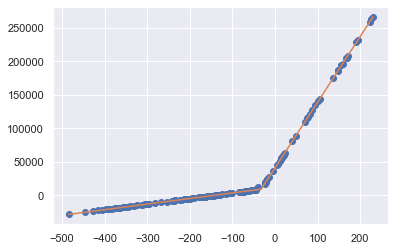

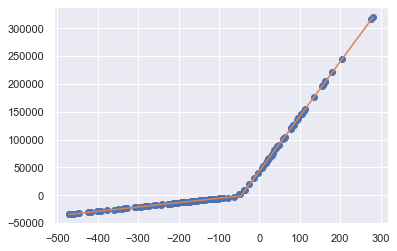

 36% (109 of 300) |#######               | Elapsed Time: 3:54:30 ETA:   6:51:58

Parameters([('x0', <Parameter 'x0', value=-15.14548599815045 +/- 0.175, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=23069.61470972636 +/- 102, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.445, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=974.8922160929428 +/- 1.11, bounds=[-inf:inf]>)])


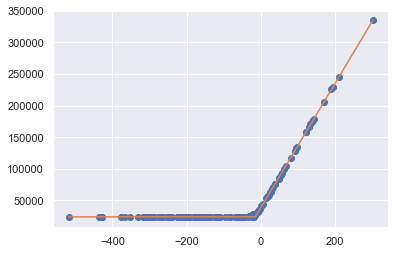

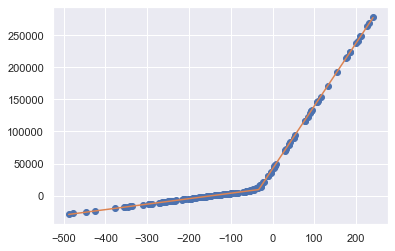

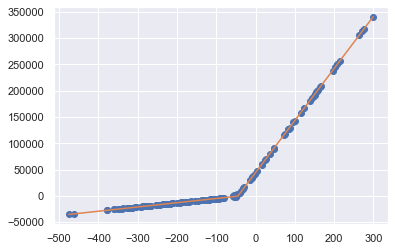

 36% (110 of 300) |########              | Elapsed Time: 3:56:42 ETA:   6:58:41

Parameters([('x0', <Parameter 'x0', value=-14.544954376012829 +/- 0.265, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=23932.90850378679 +/- 160, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.808, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=980.8278156738545 +/- 1.83, bounds=[-inf:inf]>)])


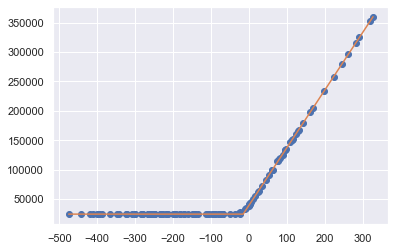

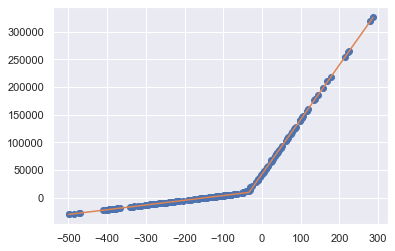

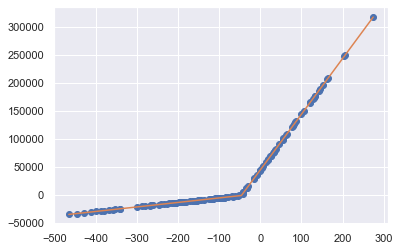

 37% (111 of 300) |########              | Elapsed Time: 3:58:57 ETA:   7:05:03

Parameters([('x0', <Parameter 'x0', value=-15.127731396977262 +/- 0.222, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=24398.18031640623 +/- 148, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.671, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=980.48810731636 +/- 1.07, bounds=[-inf:inf]>)])


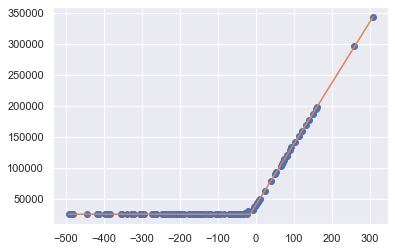

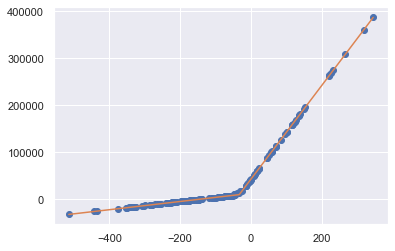

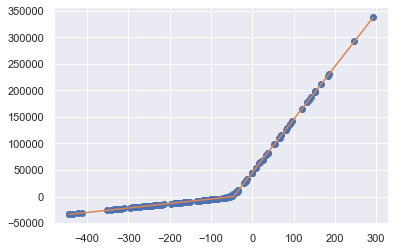

 37% (112 of 300) |########              | Elapsed Time: 4:01:05 ETA:   6:42:41

Parameters([('x0', <Parameter 'x0', value=-15.548554212841067 +/- 0.227, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=24687.557307929135 +/- 119, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.558, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=984.9475052162104 +/- 1.55, bounds=[-inf:inf]>)])


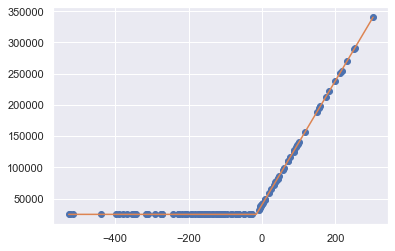

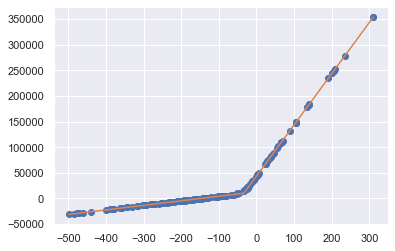

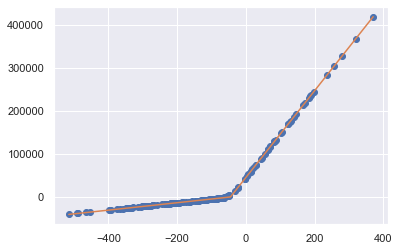

 37% (113 of 300) |########              | Elapsed Time: 4:03:17 ETA:   6:48:37

Parameters([('x0', <Parameter 'x0', value=-15.64902120577854 +/- 0.177, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=24737.9742693754 +/- 118, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.516, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=992.9472616117035 +/- 0.956, bounds=[-inf:inf]>)])


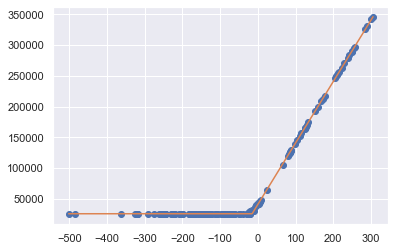

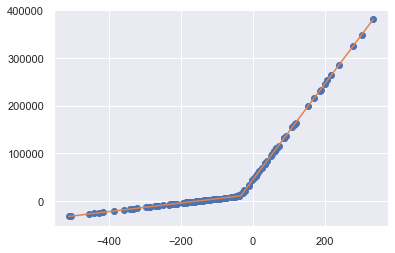

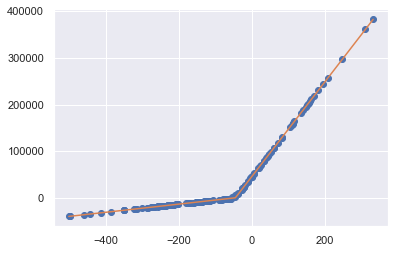

 38% (114 of 300) |########              | Elapsed Time: 4:05:22 ETA:   6:27:52

Parameters([('x0', <Parameter 'x0', value=-15.159771196476642 +/- 0.337, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=25798.339836097948 +/- 197, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.09, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=997.8444681175246 +/- 1.53, bounds=[-inf:inf]>)])


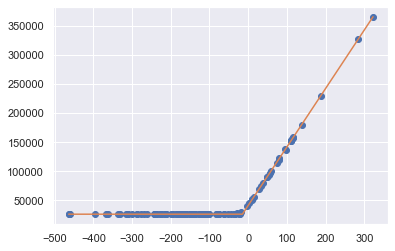

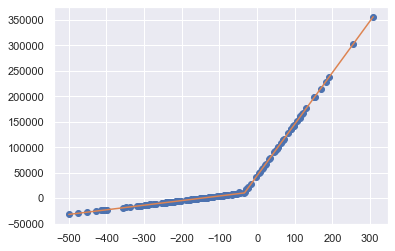

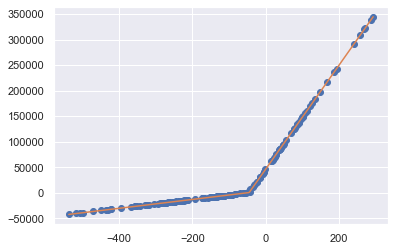

 38% (115 of 300) |########              | Elapsed Time: 4:07:33 ETA:   6:45:20

Parameters([('x0', <Parameter 'x0', value=-14.939630345799483 +/- 0.21, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=26149.137676198825 +/- 117, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.584, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1006.0509820698176 +/- 1.39, bounds=[-inf:inf]>)])


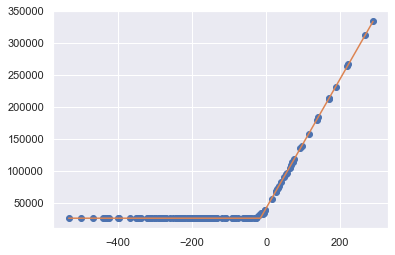

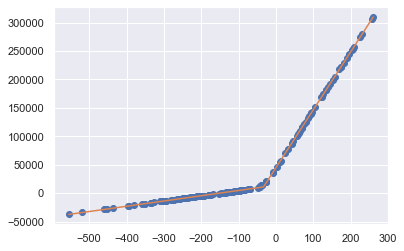

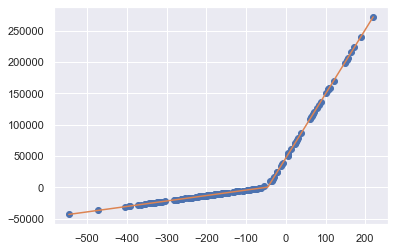

 38% (116 of 300) |########              | Elapsed Time: 4:09:42 ETA:   6:35:32

Parameters([('x0', <Parameter 'x0', value=-15.467514849569392 +/- 0.282, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=26452.916033314217 +/- 169, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.733, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1007.4422908244508 +/- 1.77, bounds=[-inf:inf]>)])


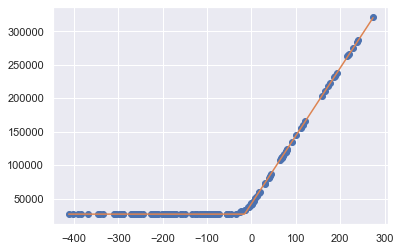

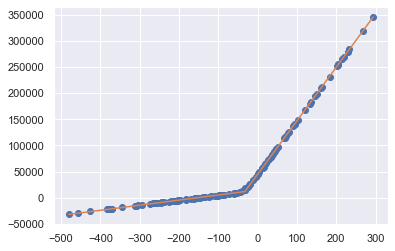

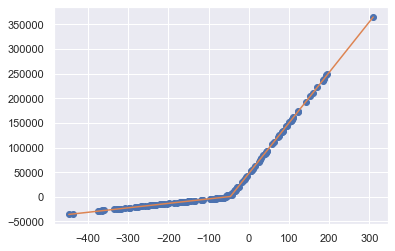

 39% (117 of 300) |########              | Elapsed Time: 4:11:51 ETA:   6:32:10

Parameters([('x0', <Parameter 'x0', value=-15.649632262660438 +/- 0.305, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=26845.2725155033 +/- 223, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.11, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1012.0786227799911 +/- 1.63, bounds=[-inf:inf]>)])


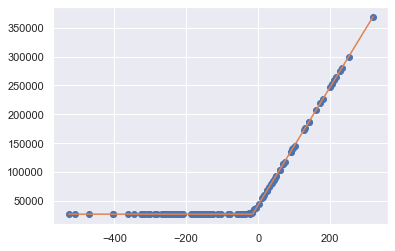

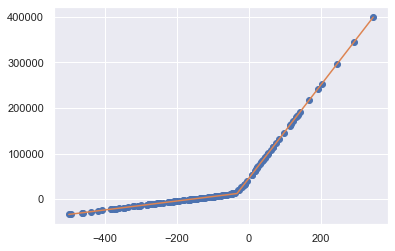

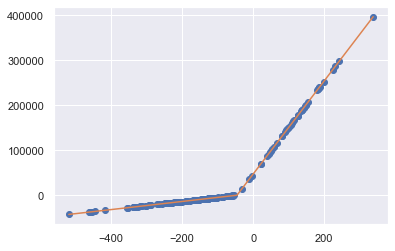

 39% (118 of 300) |########              | Elapsed Time: 4:14:02 ETA:   6:37:04

Parameters([('x0', <Parameter 'x0', value=-15.318953656998588 +/- 0.253, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=27282.45150009658 +/- 162, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.739, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1018.8991768734908 +/- 1.41, bounds=[-inf:inf]>)])


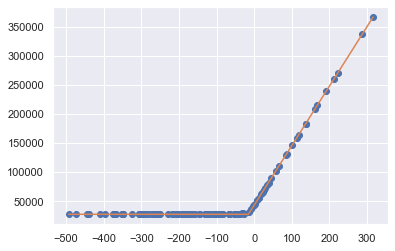

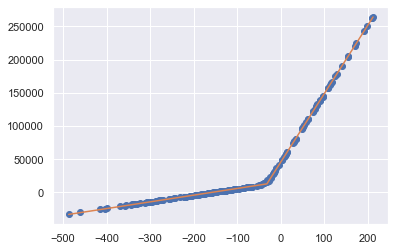

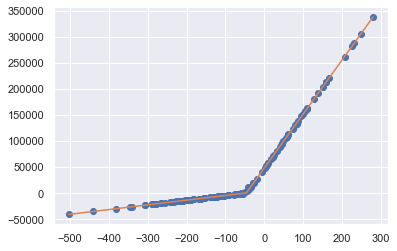

 39% (119 of 300) |########              | Elapsed Time: 4:16:14 ETA:   6:40:20

Parameters([('x0', <Parameter 'x0', value=-15.462348720509361 +/- 0.157, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=27472.17293982 +/- 97.1, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.436, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1023.7279617395926 +/- 0.95, bounds=[-inf:inf]>)])


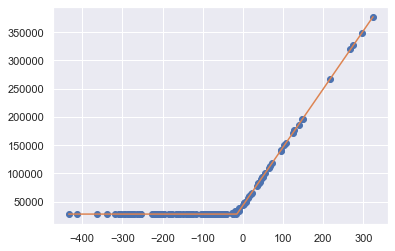

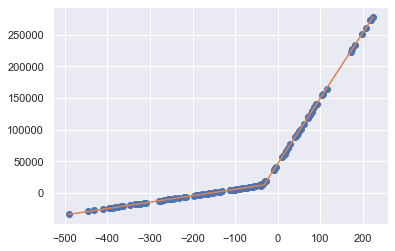

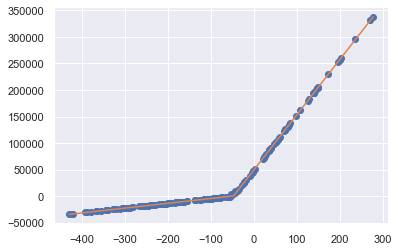

 40% (120 of 300) |########              | Elapsed Time: 4:18:19 ETA:   6:15:00

Parameters([('x0', <Parameter 'x0', value=-15.072330721288289 +/- 0.279, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28023.219964039035 +/- 179, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1030.528134515086 +/- 1.71, bounds=[-inf:inf]>)])


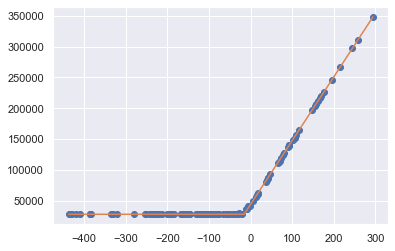

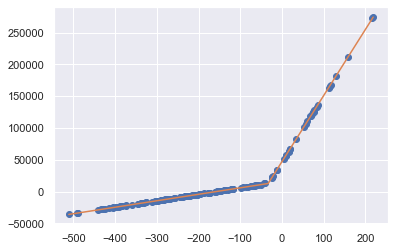

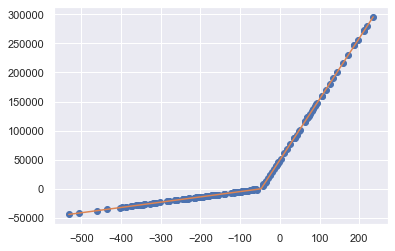

 40% (121 of 300) |########              | Elapsed Time: 4:20:26 ETA:   6:18:21

Parameters([('x0', <Parameter 'x0', value=-15.526277433352222 +/- 0.187, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28208.23465655786 +/- 113, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.596, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1033.4967564665792 +/- 1.17, bounds=[-inf:inf]>)])


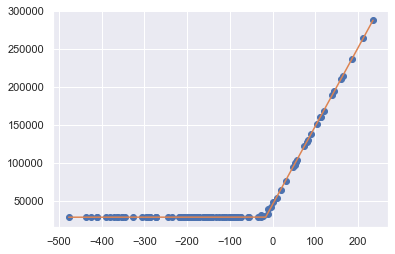

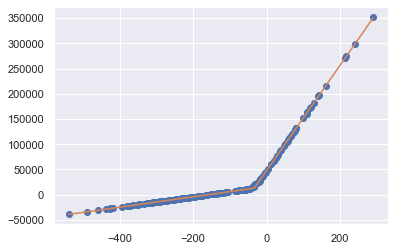

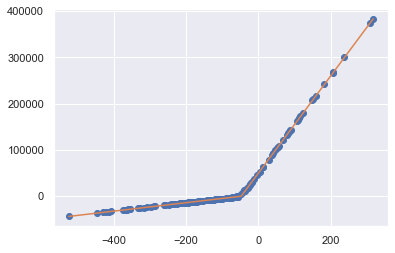

 40% (122 of 300) |########              | Elapsed Time: 4:22:42 ETA:   6:42:51

Parameters([('x0', <Parameter 'x0', value=-16.275523711205317 +/- 0.298, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28450.210665451687 +/- 166, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.762, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1032.4034018402451 +/- 2.12, bounds=[-inf:inf]>)])


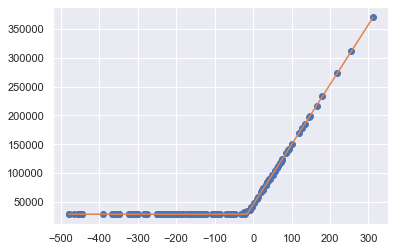

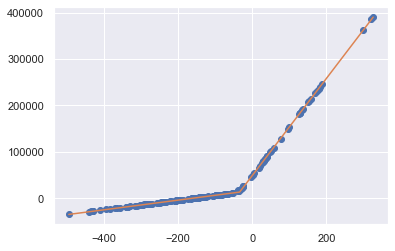

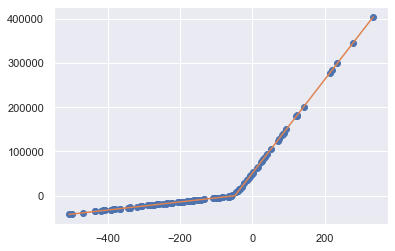

 41% (123 of 300) |#########             | Elapsed Time: 4:24:50 ETA:   6:18:05

Parameters([('x0', <Parameter 'x0', value=-16.07821296575099 +/- 0.218, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28770.747034167965 +/- 137, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.617, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1040.330078418101 +/- 1.56, bounds=[-inf:inf]>)])


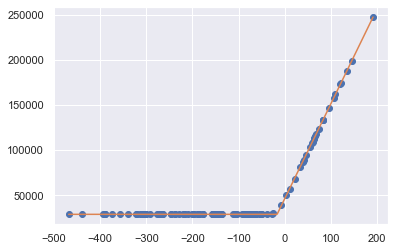

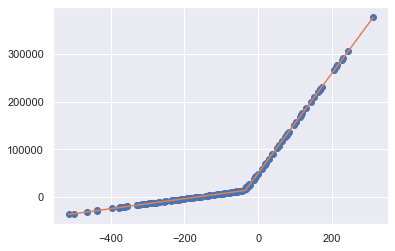

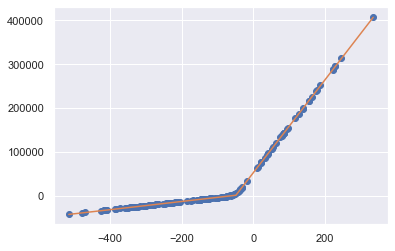

 41% (124 of 300) |#########             | Elapsed Time: 4:27:01 ETA:   6:24:56

Parameters([('x0', <Parameter 'x0', value=-16.391501211211235 +/- 0.15, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28829.61540635654 +/- 70.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.336, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1050.1797762566632 +/- 1.4, bounds=[-inf:inf]>)])


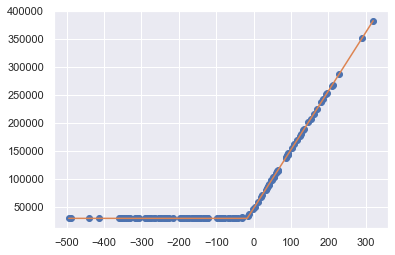

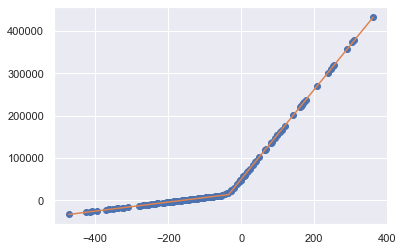

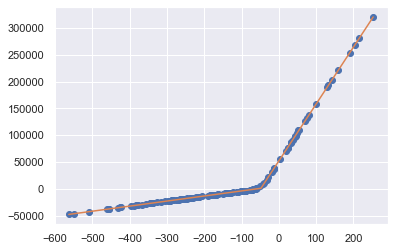

 41% (125 of 300) |#########             | Elapsed Time: 4:29:12 ETA:   6:20:43

Parameters([('x0', <Parameter 'x0', value=-17.20763823858344 +/- 0.15, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=28909.74482693353 +/- 101, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.471, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1050.1284352843456 +/- 0.85, bounds=[-inf:inf]>)])


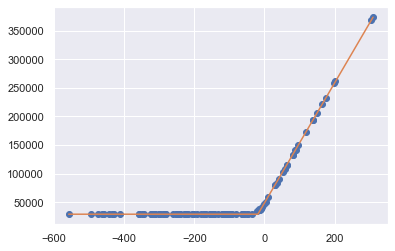

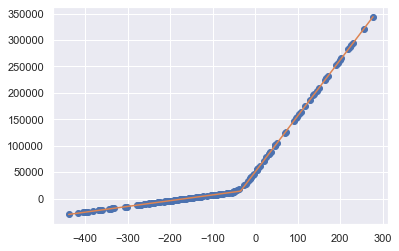

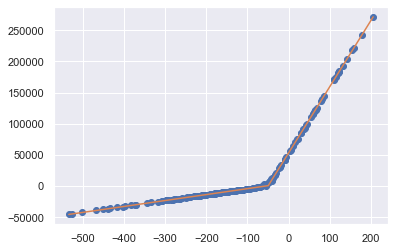

 42% (126 of 300) |#########             | Elapsed Time: 4:31:22 ETA:   6:17:35

Parameters([('x0', <Parameter 'x0', value=-18.534648778132272 +/- 0.375, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=29241.888541412656 +/- 242, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.01, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1047.906682957356 +/- 2.28, bounds=[-inf:inf]>)])


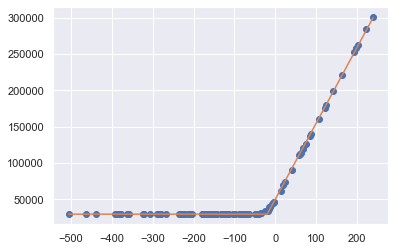

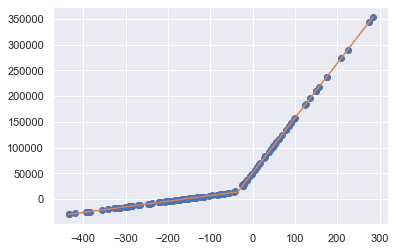

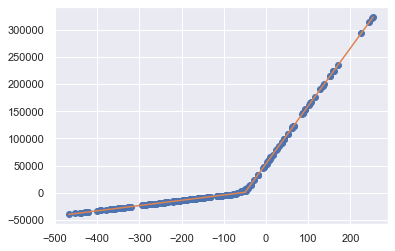

 42% (127 of 300) |#########             | Elapsed Time: 4:33:29 ETA:   6:06:21

Parameters([('x0', <Parameter 'x0', value=-19.880047682704145 +/- 0.355, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=29536.477761525235 +/- 220, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.06, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1044.2191695232395 +/- 2.42, bounds=[-inf:inf]>)])


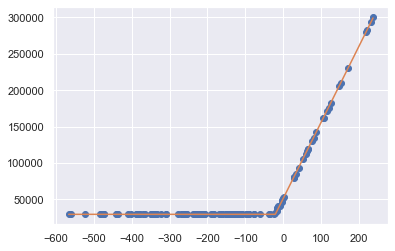

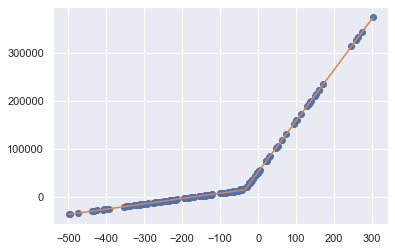

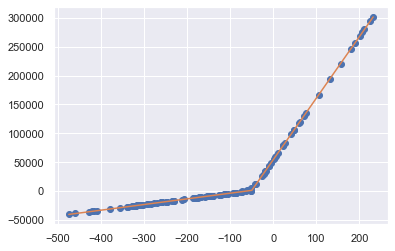

 42% (128 of 300) |#########             | Elapsed Time: 4:35:45 ETA:   6:29:52

Parameters([('x0', <Parameter 'x0', value=-20.70875424632923 +/- 0.271, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=29631.94936461657 +/- 165, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.653, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1043.5405203490193 +/- 1.86, bounds=[-inf:inf]>)])


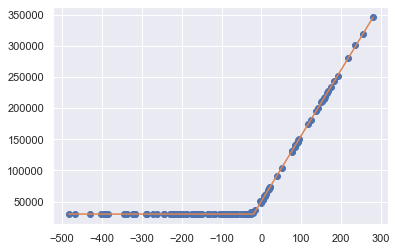

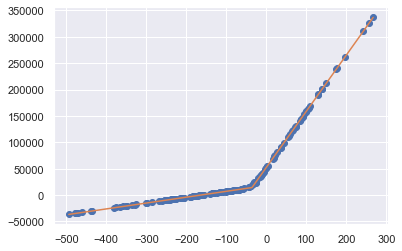

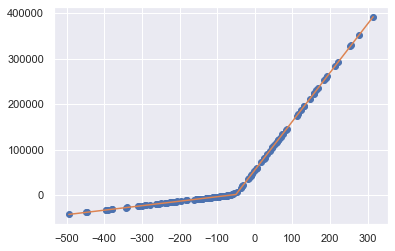

 43% (129 of 300) |#########             | Elapsed Time: 4:37:57 ETA:   6:14:38

Parameters([('x0', <Parameter 'x0', value=-19.787305869426515 +/- 0.221, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=30146.271428716642 +/- 135, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.691, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1053.3974862982438 +/- 1.35, bounds=[-inf:inf]>)])


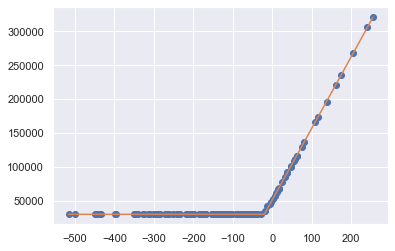

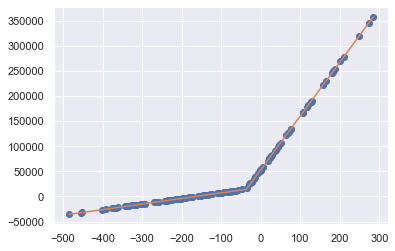

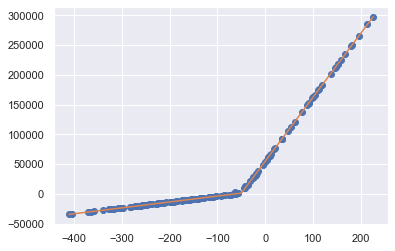

 43% (130 of 300) |#########             | Elapsed Time: 4:40:06 ETA:   6:07:32

Parameters([('x0', <Parameter 'x0', value=-20.17927867607426 +/- 0.196, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=30210.95526239703 +/- 111, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.549, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1054.4655379039912 +/- 1.53, bounds=[-inf:inf]>)])


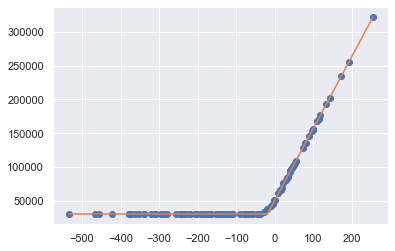

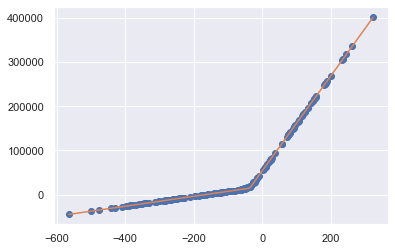

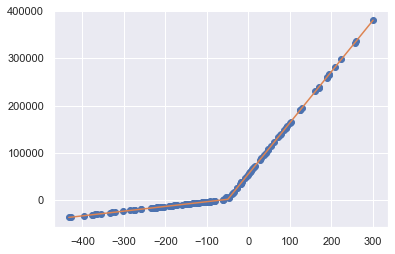

 43% (131 of 300) |#########             | Elapsed Time: 4:42:22 ETA:   6:23:06

Parameters([('x0', <Parameter 'x0', value=-19.276551798506024 +/- 0.303, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=30822.787778748418 +/- 195, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.89, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1063.7362663079282 +/- 2.48, bounds=[-inf:inf]>)])


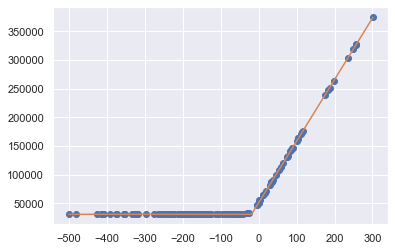

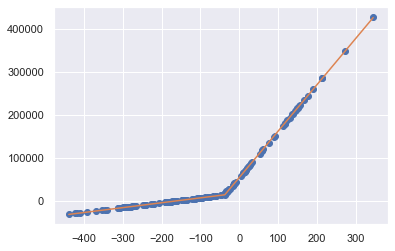

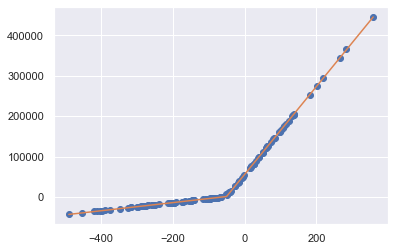

 44% (132 of 300) |#########             | Elapsed Time: 4:44:32 ETA:   6:03:52

Parameters([('x0', <Parameter 'x0', value=-18.976404912390475 +/- 0.139, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=30969.596804229237 +/- 91.2, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.446, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1073.2167217628817 +/- 0.871, bounds=[-inf:inf]>)])


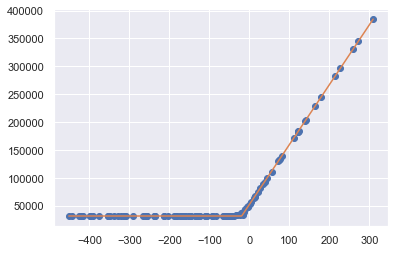

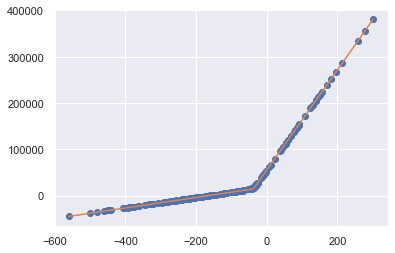

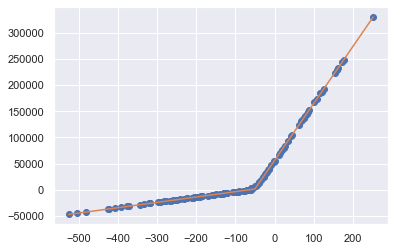

 44% (133 of 300) |#########             | Elapsed Time: 4:46:48 ETA:   6:17:37

Parameters([('x0', <Parameter 'x0', value=-19.25956685343941 +/- 0.327, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=31662.84133682464 +/- 222, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.02, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1074.3873295603423 +/- 2, bounds=[-inf:inf]>)])


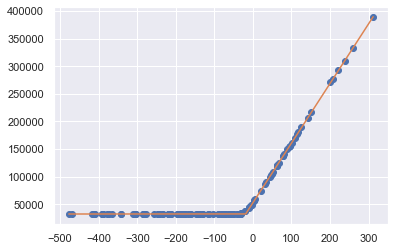

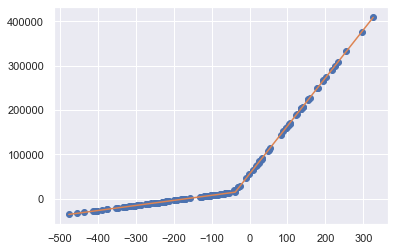

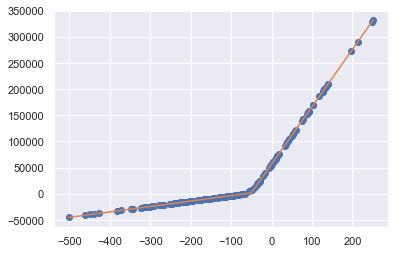

 44% (134 of 300) |#########             | Elapsed Time: 4:48:58 ETA:   5:58:58

Parameters([('x0', <Parameter 'x0', value=-18.868902439192386 +/- 0.288, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=32359.12319191377 +/- 179, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.83, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1079.8754085648081 +/- 1.89, bounds=[-inf:inf]>)])


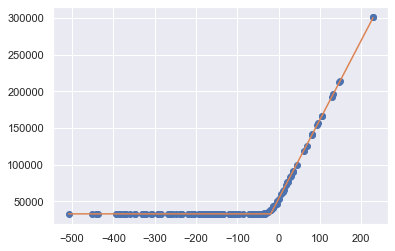

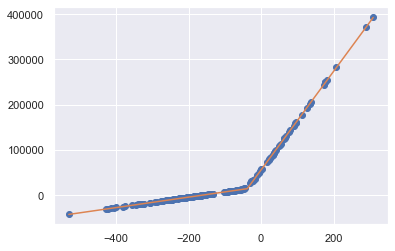

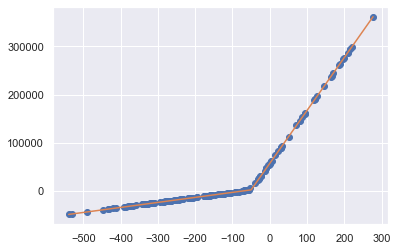

 45% (135 of 300) |#########             | Elapsed Time: 4:51:06 ETA:   5:53:27

Parameters([('x0', <Parameter 'x0', value=-19.26402266518175 +/- 0.305, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=33057.57785538956 +/- 190, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.911, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1078.6872004002305 +/- 2.66, bounds=[-inf:inf]>)])


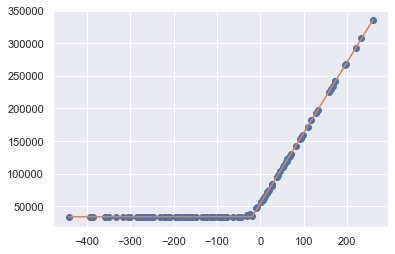

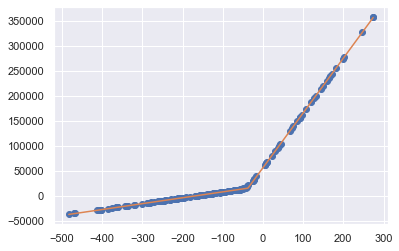

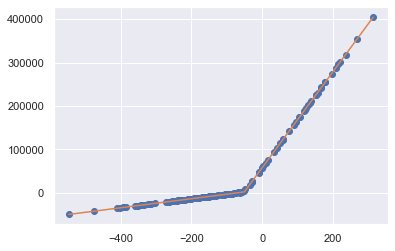

 45% (136 of 300) |#########             | Elapsed Time: 4:53:18 ETA:   5:59:54

Parameters([('x0', <Parameter 'x0', value=-18.60427160814585 +/- 0.295, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=34009.676116007584 +/- 195, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.05, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1083.390457825395 +/- 2.01, bounds=[-inf:inf]>)])


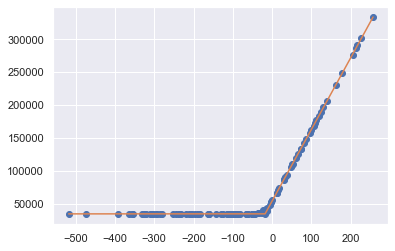

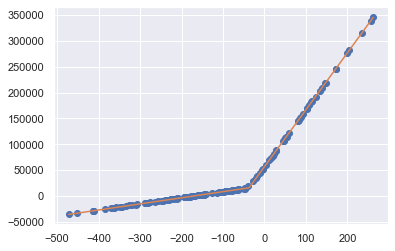

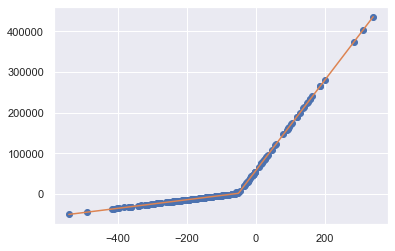

 45% (137 of 300) |##########            | Elapsed Time: 4:55:25 ETA:   5:46:36

Parameters([('x0', <Parameter 'x0', value=-18.051342316428386 +/- 0.297, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=34789.27901854205 +/- 200, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1088.3092555509863 +/- 2.08, bounds=[-inf:inf]>)])


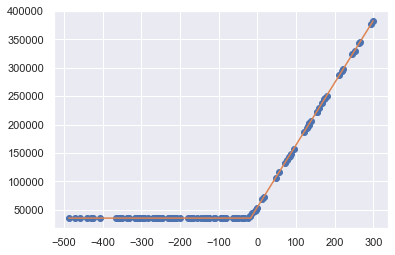

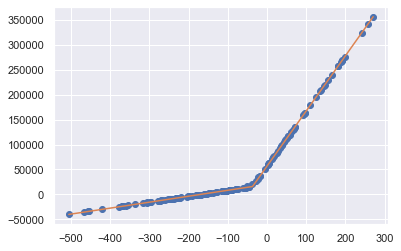

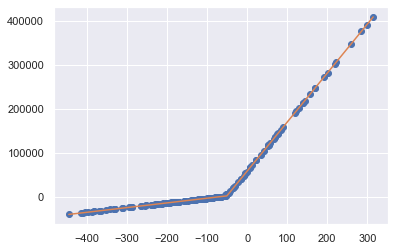

 46% (138 of 300) |##########            | Elapsed Time: 4:57:34 ETA:   5:47:59

Parameters([('x0', <Parameter 'x0', value=-17.94239571298119 +/- 0.321, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=35278.849781103265 +/- 184, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.817, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1095.7591249174518 +/- 1.71, bounds=[-inf:inf]>)])


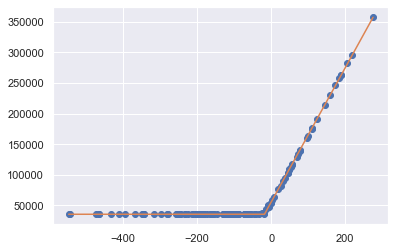

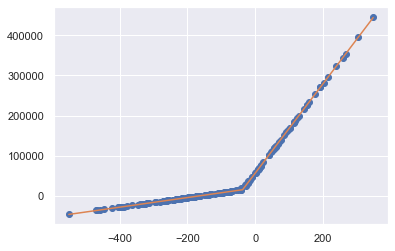

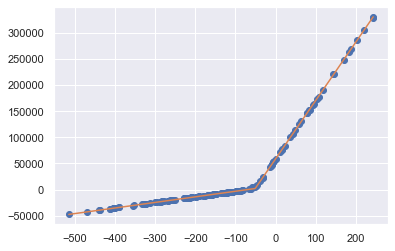

 46% (139 of 300) |##########            | Elapsed Time: 4:59:50 ETA:   6:03:34

Parameters([('x0', <Parameter 'x0', value=-18.306181663187214 +/- 0.273, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=35485.52018413268 +/- 181, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.817, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1098.722558866074 +/- 1.95, bounds=[-inf:inf]>)])


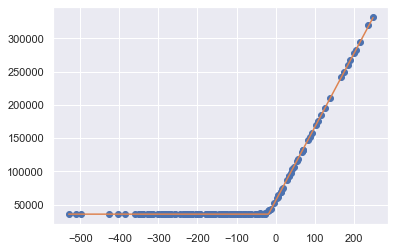

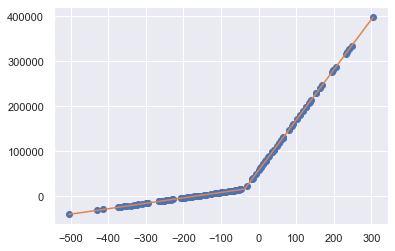

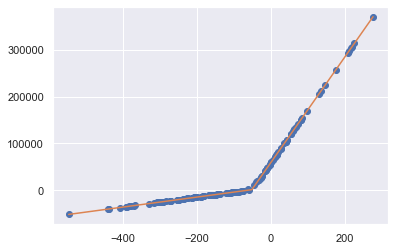

 46% (140 of 300) |##########            | Elapsed Time: 5:01:58 ETA:   5:42:40

Parameters([('x0', <Parameter 'x0', value=-18.262195492720082 +/- 0.221, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=35838.613788394665 +/- 142, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.662, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1102.8122898206934 +/- 1.56, bounds=[-inf:inf]>)])


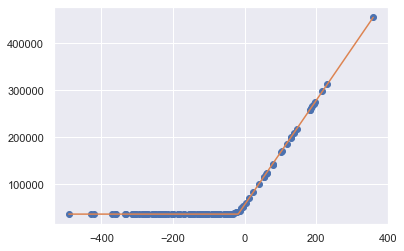

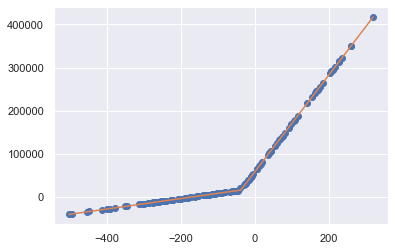

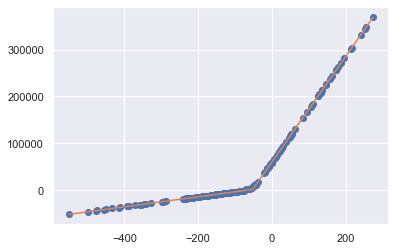

 47% (141 of 300) |##########            | Elapsed Time: 5:04:06 ETA:   5:38:17

Parameters([('x0', <Parameter 'x0', value=-17.79545734599634 +/- 0.295, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=36438.50415163415 +/- 182, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.903, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1109.498683755875 +/- 1.79, bounds=[-inf:inf]>)])


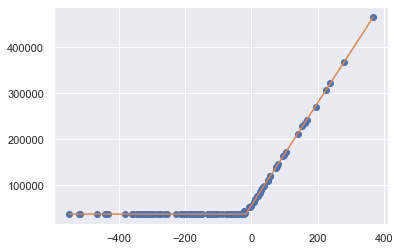

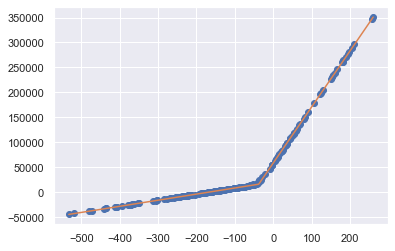

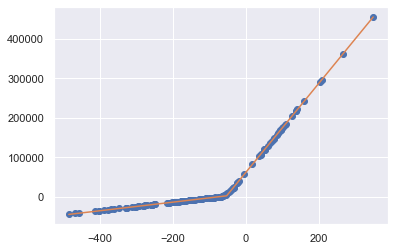

 47% (142 of 300) |##########            | Elapsed Time: 5:06:21 ETA:   5:54:48

Parameters([('x0', <Parameter 'x0', value=-17.060160770950144 +/- 0.286, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=37057.56886645059 +/- 185, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.813, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1116.994579247484 +/- 1.84, bounds=[-inf:inf]>)])


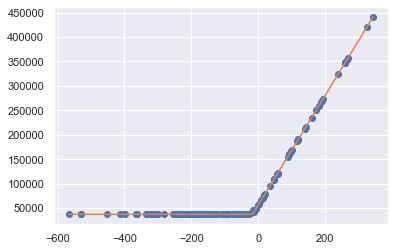

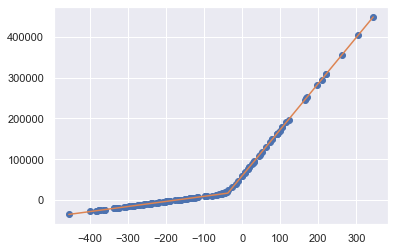

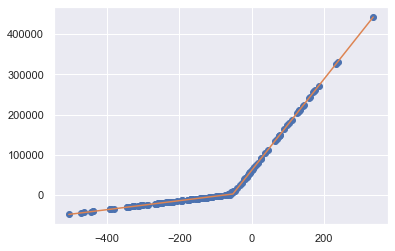

 47% (143 of 300) |##########            | Elapsed Time: 5:08:27 ETA:   5:31:30

Parameters([('x0', <Parameter 'x0', value=-17.404451465863826 +/- 0.215, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=37186.2382521527 +/- 145, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.663, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1119.8343920780678 +/- 1.15, bounds=[-inf:inf]>)])


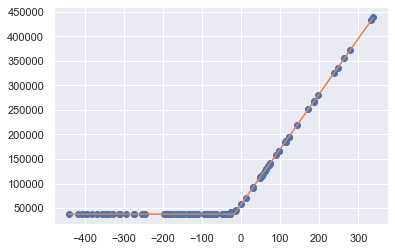

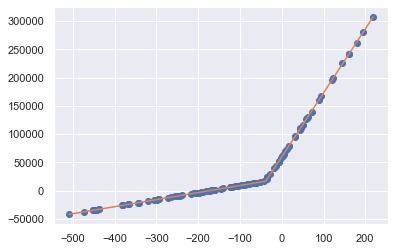

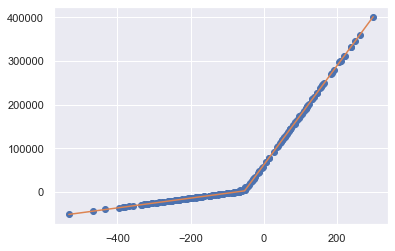

 48% (144 of 300) |##########            | Elapsed Time: 5:10:30 ETA:   5:19:10

Parameters([('x0', <Parameter 'x0', value=-17.79287759722727 +/- 0.305, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=37620.83696592154 +/- 198, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.02, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1124.1302937535145 +/- 1.77, bounds=[-inf:inf]>)])


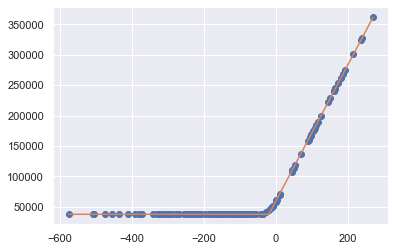

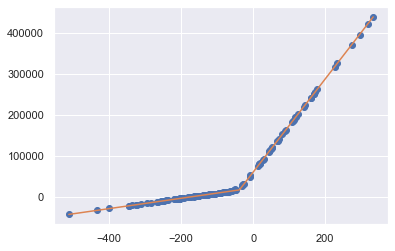

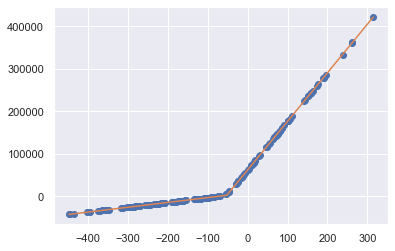

 48% (145 of 300) |##########            | Elapsed Time: 5:12:37 ETA:   5:27:44

Parameters([('x0', <Parameter 'x0', value=-19.15074364971534 +/- 0.285, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=37772.13269470373 +/- 183, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.817, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1118.3194473223373 +/- 1.83, bounds=[-inf:inf]>)])


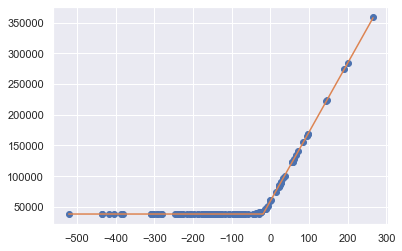

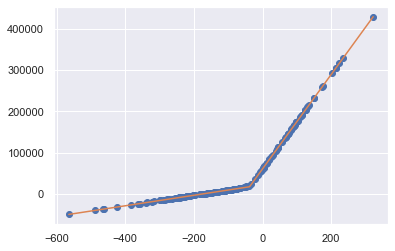

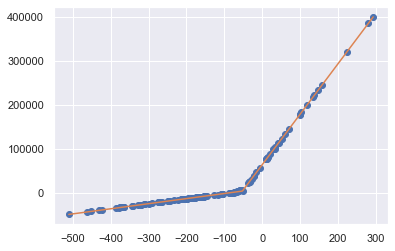

 48% (146 of 300) |##########            | Elapsed Time: 5:14:51 ETA:   5:43:43

Parameters([('x0', <Parameter 'x0', value=-18.627010479156702 +/- 0.25, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=38353.40169246968 +/- 158, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.848, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1123.0680847744848 +/- 2.24, bounds=[-inf:inf]>)])


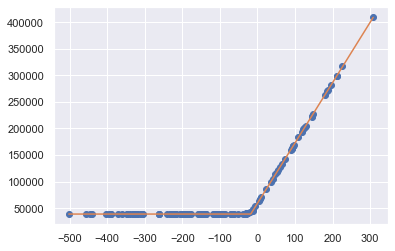

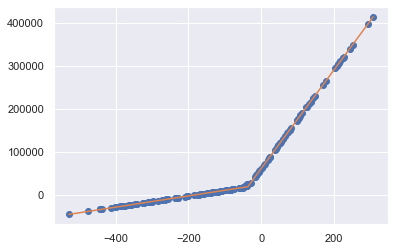

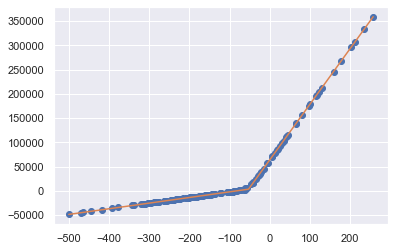

 49% (147 of 300) |##########            | Elapsed Time: 5:17:01 ETA:   5:32:42

Parameters([('x0', <Parameter 'x0', value=-17.742402061247002 +/- 0.239, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=38974.32109557594 +/- 143, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.671, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1135.2426474108402 +/- 1.63, bounds=[-inf:inf]>)])


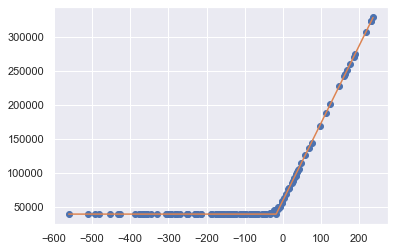

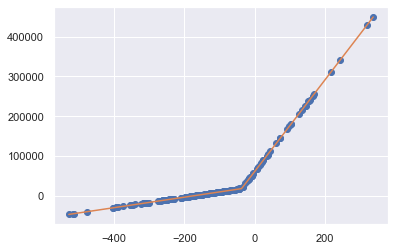

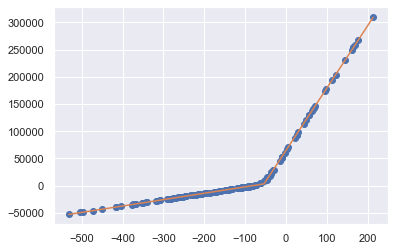

 49% (148 of 300) |##########            | Elapsed Time: 5:19:14 ETA:   5:35:07

Parameters([('x0', <Parameter 'x0', value=-17.60472643053456 +/- 0.24, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=39386.65752328639 +/- 165, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.712, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1140.1461904650805 +/- 1.73, bounds=[-inf:inf]>)])


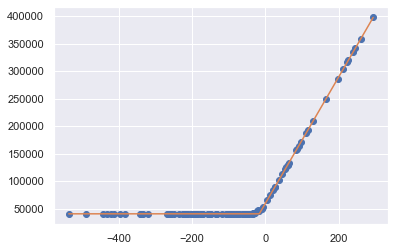

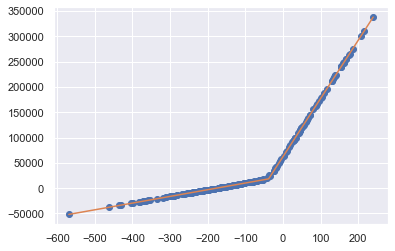

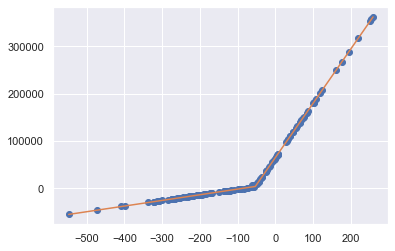

 49% (149 of 300) |##########            | Elapsed Time: 5:21:32 ETA:   5:47:45

Parameters([('x0', <Parameter 'x0', value=-16.47506762328654 +/- 0.406, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=40418.38375051685 +/- 246, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.19, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1148.0494621196879 +/- 2.58, bounds=[-inf:inf]>)])


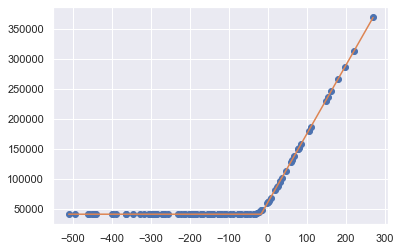

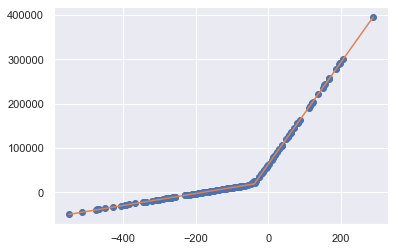

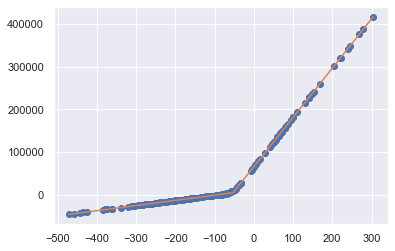

 50% (150 of 300) |###########           | Elapsed Time: 5:23:44 ETA:   5:29:52

Parameters([('x0', <Parameter 'x0', value=-17.427990962684774 +/- 0.289, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=40722.317936978354 +/- 191, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.82, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1142.16656240884 +/- 2.28, bounds=[-inf:inf]>)])


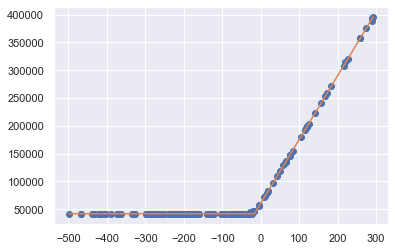

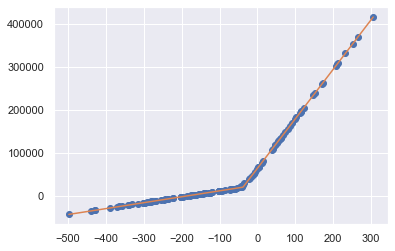

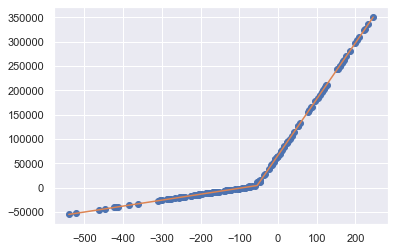

 50% (151 of 300) |###########           | Elapsed Time: 5:25:49 ETA:   5:11:50

Parameters([('x0', <Parameter 'x0', value=-16.420583751826744 +/- 0.33, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=41818.16921342507 +/- 195, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.875, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1147.9284519162918 +/- 1.96, bounds=[-inf:inf]>)])


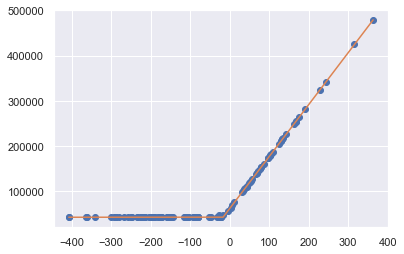

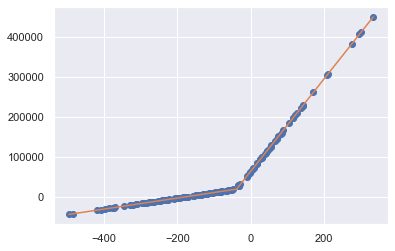

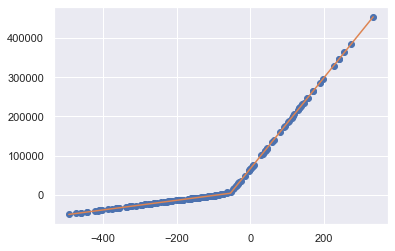

 50% (152 of 300) |###########           | Elapsed Time: 5:27:57 ETA:   5:15:01

Parameters([('x0', <Parameter 'x0', value=-16.719097946001998 +/- 0.238, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=42149.51196647645 +/- 184, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.983, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1150.0519334365215 +/- 1.42, bounds=[-inf:inf]>)])


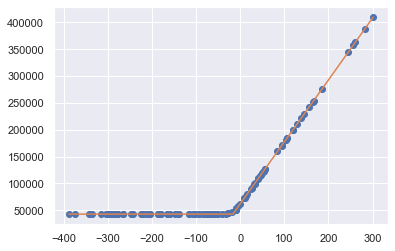

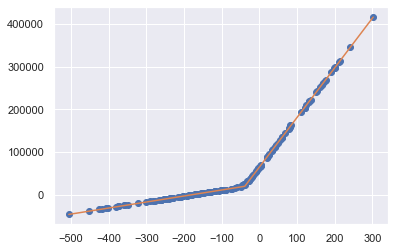

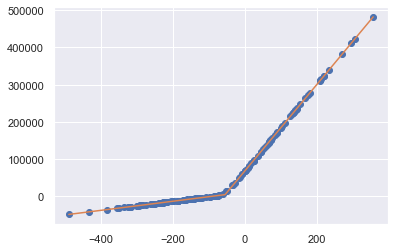

 51% (153 of 300) |###########           | Elapsed Time: 5:30:09 ETA:   5:22:49

Parameters([('x0', <Parameter 'x0', value=-16.720973413220374 +/- 0.198, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=42562.04666356849 +/- 162, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.888, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1155.1038809710158 +/- 1.23, bounds=[-inf:inf]>)])


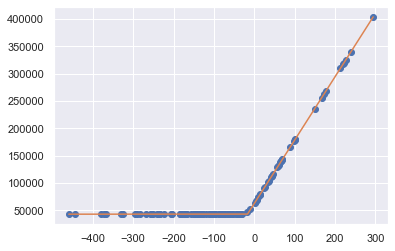

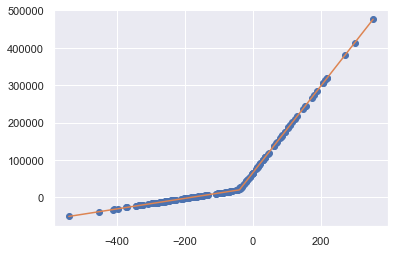

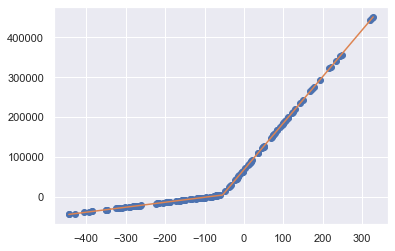

 51% (154 of 300) |###########           | Elapsed Time: 5:32:24 ETA:   5:28:55

Parameters([('x0', <Parameter 'x0', value=-16.903377025383868 +/- 0.209, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=42926.79641472086 +/- 146, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.811, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1158.1951925600024 +/- 1.45, bounds=[-inf:inf]>)])


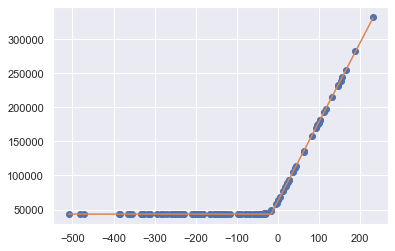

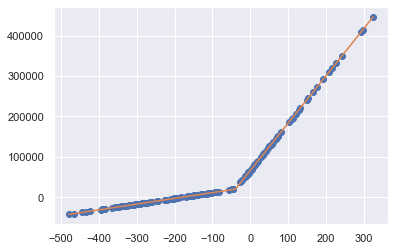

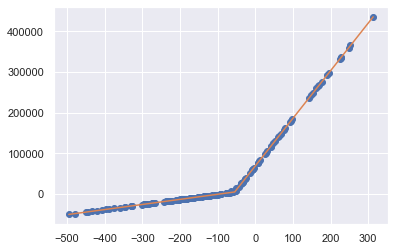

 51% (155 of 300) |###########           | Elapsed Time: 5:34:35 ETA:   5:15:21

Parameters([('x0', <Parameter 'x0', value=-17.220160823204473 +/- 0.23, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=43303.45368071244 +/- 141, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.689, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1160.8446407028955 +/- 2.02, bounds=[-inf:inf]>)])


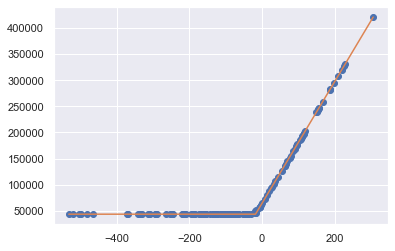

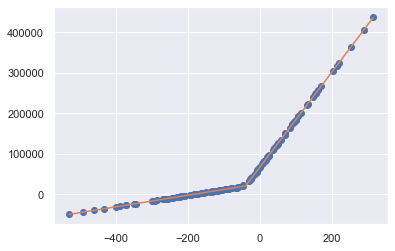

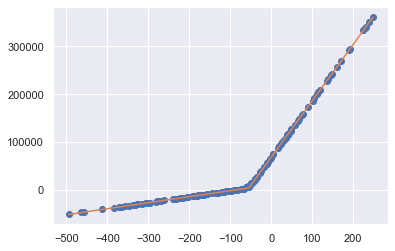

 52% (156 of 300) |###########           | Elapsed Time: 5:36:43 ETA:   5:07:00

Parameters([('x0', <Parameter 'x0', value=-17.961326941667338 +/- 0.269, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=43686.2122569399 +/- 193, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.909, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1162.4949016960081 +/- 1.84, bounds=[-inf:inf]>)])


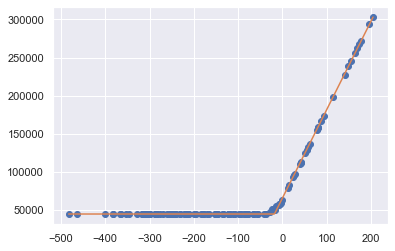

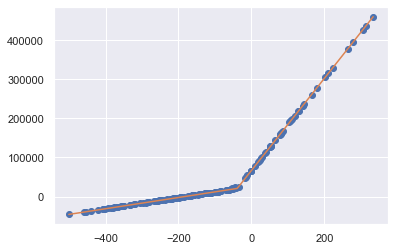

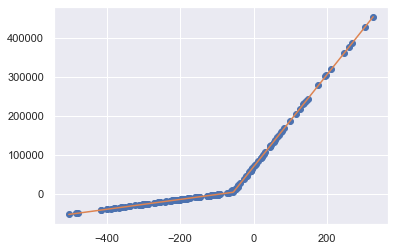

 52% (157 of 300) |###########           | Elapsed Time: 5:38:51 ETA:   5:07:12

Parameters([('x0', <Parameter 'x0', value=-18.169268200433784 +/- 0.333, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=44155.65782127035 +/- 242, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.1, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1163.639389414903 +/- 2.68, bounds=[-inf:inf]>)])


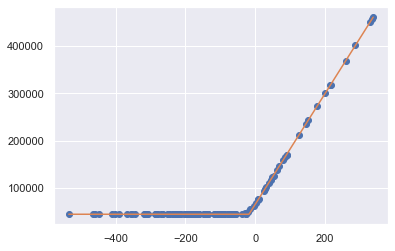

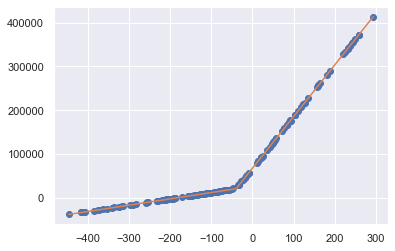

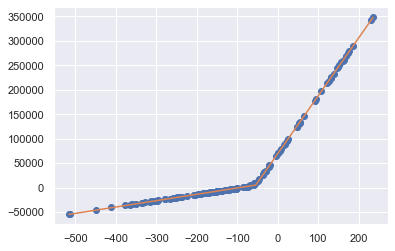

 52% (158 of 300) |###########           | Elapsed Time: 5:41:01 ETA:   5:05:52

Parameters([('x0', <Parameter 'x0', value=-17.98807542314331 +/- 0.256, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=44455.02475770681 +/- 169, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.812, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1171.9765314931342 +/- 1.46, bounds=[-inf:inf]>)])


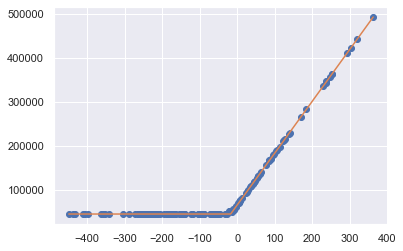

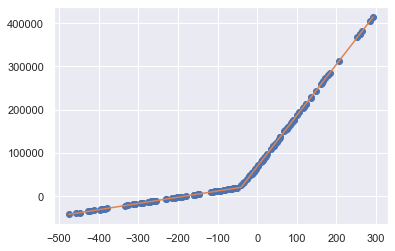

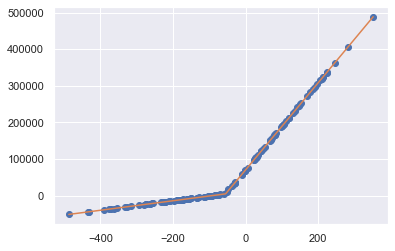

 53% (159 of 300) |###########           | Elapsed Time: 5:43:09 ETA:   5:02:01

Parameters([('x0', <Parameter 'x0', value=-17.281396411407 +/- 0.283, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=45277.83364880639 +/- 225, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.14, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1176.4017304690226 +/- 1.59, bounds=[-inf:inf]>)])


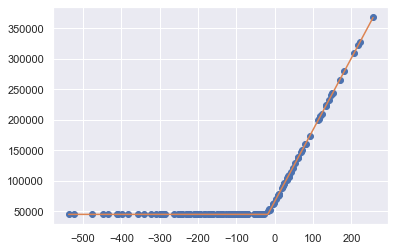

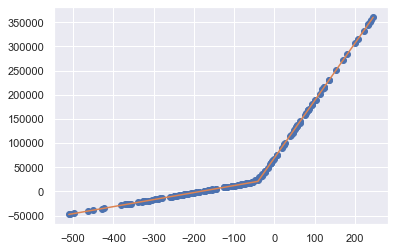

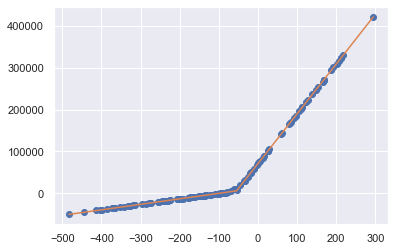

 53% (160 of 300) |###########           | Elapsed Time: 5:45:23 ETA:   5:11:49

Parameters([('x0', <Parameter 'x0', value=-18.1798141322274 +/- 0.216, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=45306.06169703159 +/- 160, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.747, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1175.5988786421894 +/- 1.7, bounds=[-inf:inf]>)])


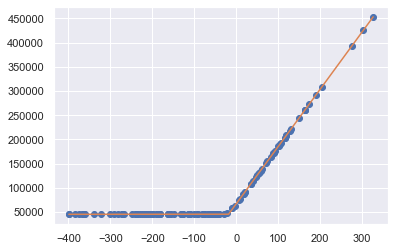

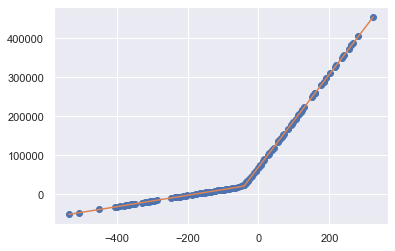

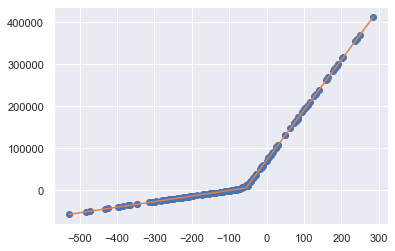

 53% (161 of 300) |###########           | Elapsed Time: 5:47:32 ETA:   4:58:30

Parameters([('x0', <Parameter 'x0', value=-18.21052222020948 +/- 0.16, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=45470.60646790856 +/- 120, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.629, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1181.1717753871462 +/- 1.05, bounds=[-inf:inf]>)])


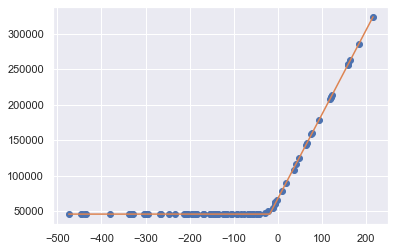

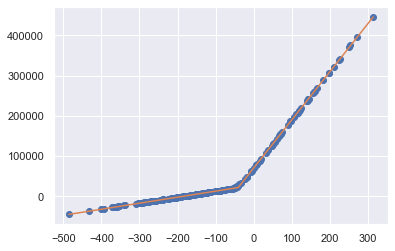

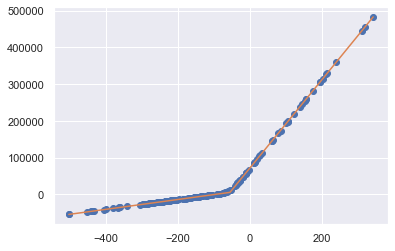

 54% (162 of 300) |###########           | Elapsed Time: 5:49:49 ETA:   5:16:52

Parameters([('x0', <Parameter 'x0', value=-18.353157040499283 +/- 0.264, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=45852.738234904464 +/- 162, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.797, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1185.3168305164988 +/- 2.28, bounds=[-inf:inf]>)])


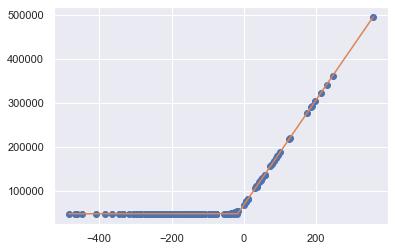

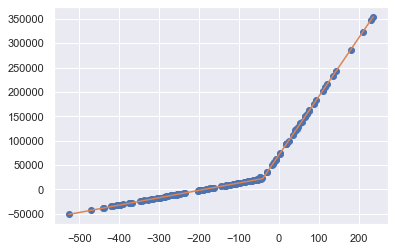

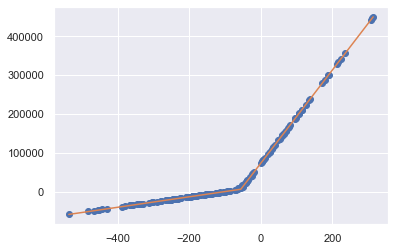

 54% (163 of 300) |###########           | Elapsed Time: 5:51:59 ETA:   4:54:51

Parameters([('x0', <Parameter 'x0', value=-17.105610375501264 +/- 0.362, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=47193.541999900415 +/- 224, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.14, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1194.4353717320657 +/- 2.65, bounds=[-inf:inf]>)])


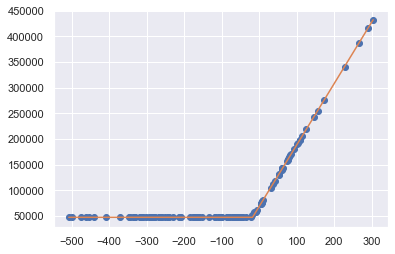

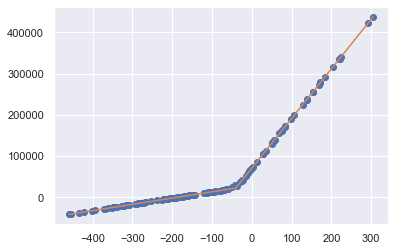

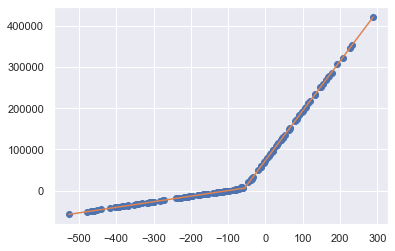

 54% (164 of 300) |############          | Elapsed Time: 5:54:10 ETA:   4:58:17

Parameters([('x0', <Parameter 'x0', value=-17.456359982313636 +/- 0.215, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=47360.27426302259 +/- 164, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.705, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1197.573608941759 +/- 1.55, bounds=[-inf:inf]>)])


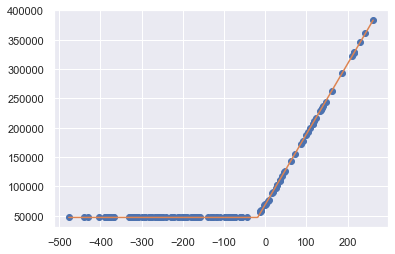

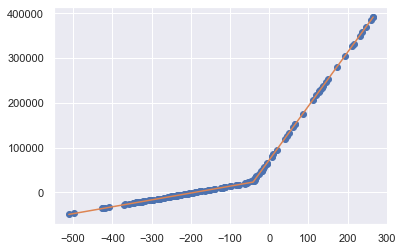

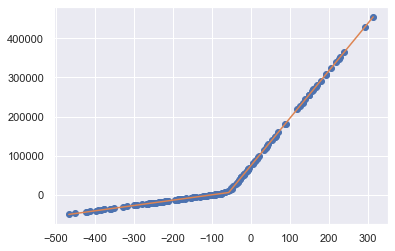

 55% (165 of 300) |############          | Elapsed Time: 5:56:20 ETA:   4:52:53

Parameters([('x0', <Parameter 'x0', value=-18.309527091383167 +/- 0.237, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=47298.213096115236 +/- 198, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.847, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1198.4007043181048 +/- 1.55, bounds=[-inf:inf]>)])


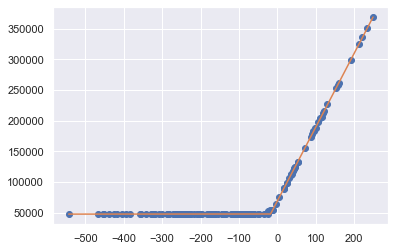

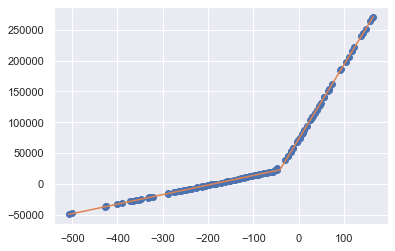

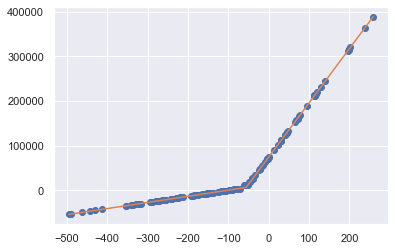

 55% (166 of 300) |############          | Elapsed Time: 5:58:26 ETA:   4:40:29

Parameters([('x0', <Parameter 'x0', value=-18.090703177958744 +/- 0.253, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=47746.532005866895 +/- 171, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.78, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1204.0692124736959 +/- 2.05, bounds=[-inf:inf]>)])


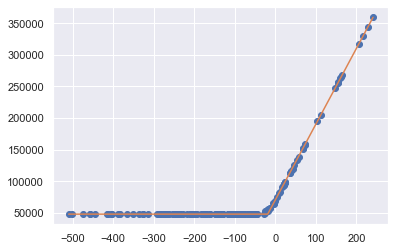

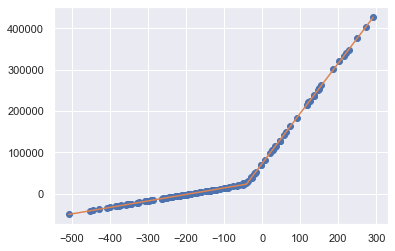

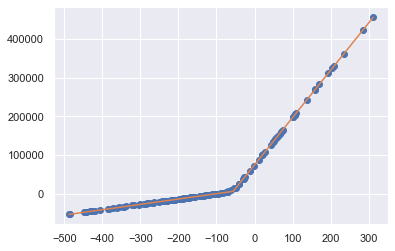

 55% (167 of 300) |############          | Elapsed Time: 6:00:32 ETA:   4:38:54

Parameters([('x0', <Parameter 'x0', value=-18.966290872951948 +/- 0.269, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=48142.856807787895 +/- 196, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.901, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1197.39737805505 +/- 2.32, bounds=[-inf:inf]>)])


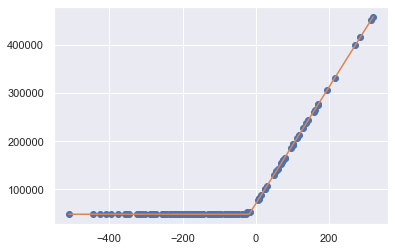

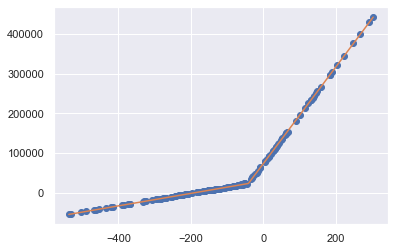

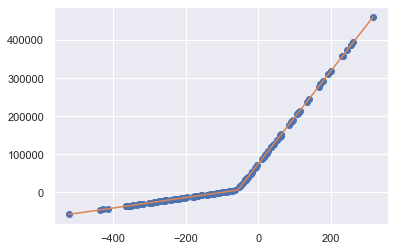

 56% (168 of 300) |############          | Elapsed Time: 6:02:43 ETA:   4:48:27

Parameters([('x0', <Parameter 'x0', value=-18.41224063807605 +/- 0.194, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=48457.82041715286 +/- 134, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.662, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1212.040920130259 +/- 1.26, bounds=[-inf:inf]>)])


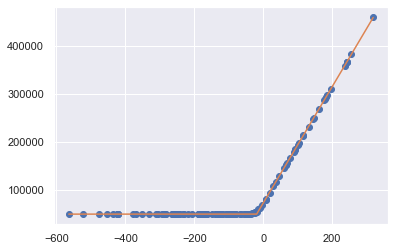

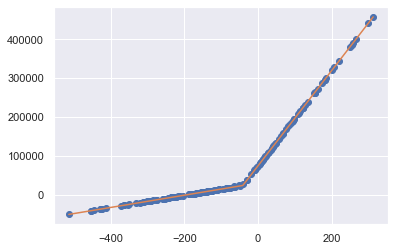

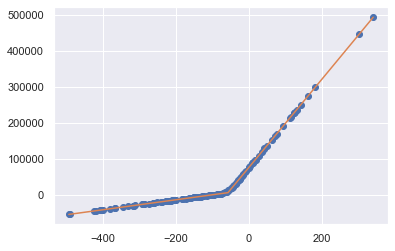

 56% (169 of 300) |############          | Elapsed Time: 6:04:59 ETA:   4:57:26

Parameters([('x0', <Parameter 'x0', value=-19.139662905216877 +/- 0.309, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=48997.847221380805 +/- 207, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.913, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1211.9360974443769 +/- 1.97, bounds=[-inf:inf]>)])


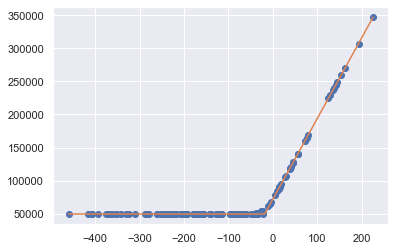

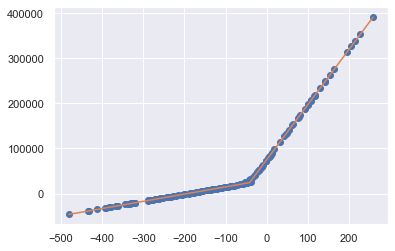

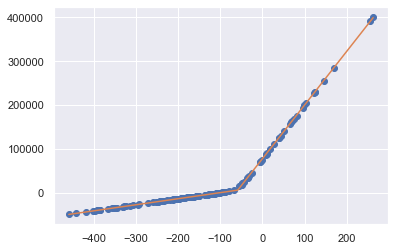

 56% (170 of 300) |############          | Elapsed Time: 6:07:13 ETA:   4:49:55

Parameters([('x0', <Parameter 'x0', value=-18.52391709738683 +/- 0.24, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=49544.55810112323 +/- 153, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.773, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1219.230733364663 +/- 2.29, bounds=[-inf:inf]>)])


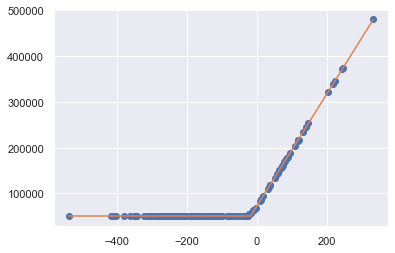

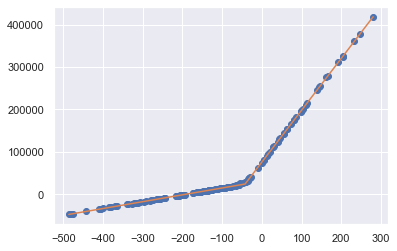

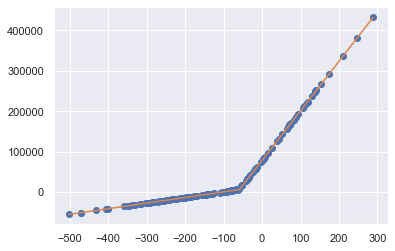

 57% (171 of 300) |############          | Elapsed Time: 6:09:21 ETA:   4:35:47

Parameters([('x0', <Parameter 'x0', value=-18.16905562495131 +/- 0.287, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=50382.737573240534 +/- 203, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.999, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1221.9971372067746 +/- 2.1, bounds=[-inf:inf]>)])


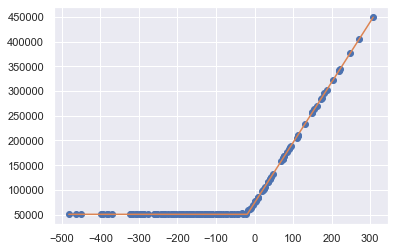

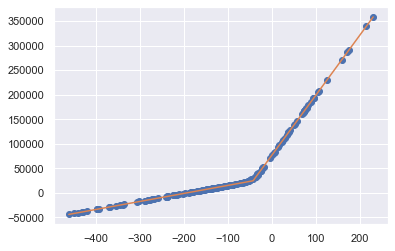

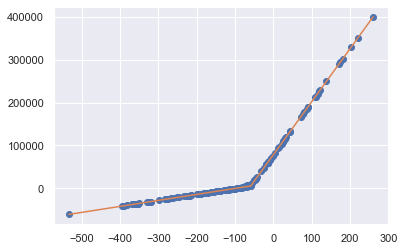

 57% (172 of 300) |############          | Elapsed Time: 6:11:35 ETA:   4:45:54

Parameters([('x0', <Parameter 'x0', value=-18.983187187323836 +/- 0.199, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=50529.78942675338 +/- 161, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.781, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1220.6451842625715 +/- 1.29, bounds=[-inf:inf]>)])


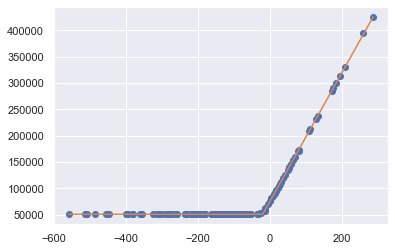

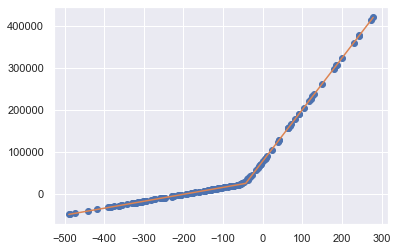

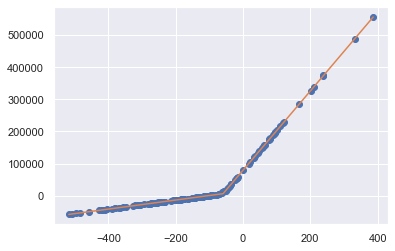

 57% (173 of 300) |############          | Elapsed Time: 6:13:45 ETA:   4:34:40

Parameters([('x0', <Parameter 'x0', value=-19.583020922176047 +/- 0.188, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=50670.99162603836 +/- 136, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.62, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1219.451354874644 +/- 1.52, bounds=[-inf:inf]>)])


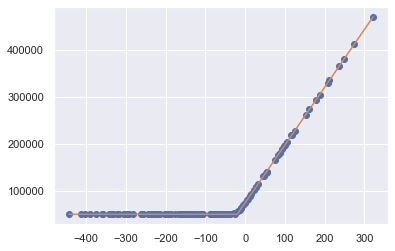

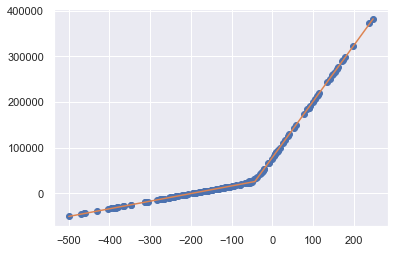

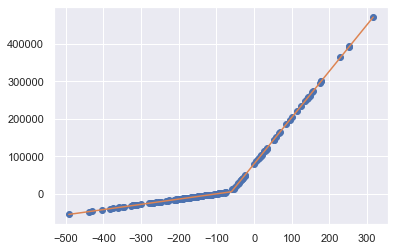

 58% (174 of 300) |############          | Elapsed Time: 6:15:55 ETA:   4:32:43

Parameters([('x0', <Parameter 'x0', value=-20.023542464643437 +/- 0.152, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=50877.413065158515 +/- 114, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.6, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1223.7767128114563 +/- 1.05, bounds=[-inf:inf]>)])


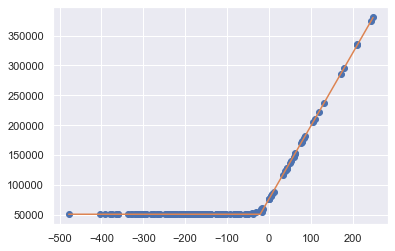

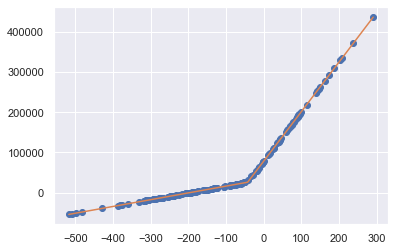

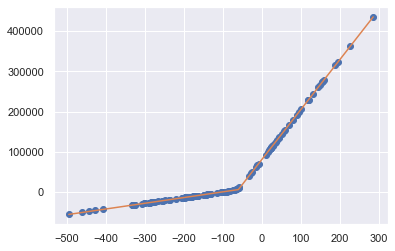

 58% (175 of 300) |############          | Elapsed Time: 6:18:06 ETA:   4:32:27

Parameters([('x0', <Parameter 'x0', value=-20.969450209759273 +/- 0.252, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=51093.5869805479 +/- 199, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.962, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1221.5747013041437 +/- 2.02, bounds=[-inf:inf]>)])


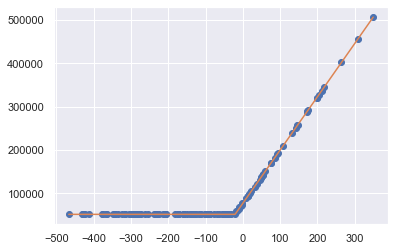

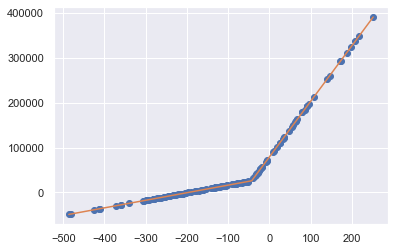

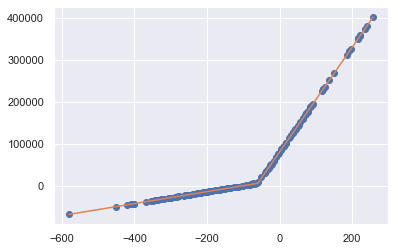

 58% (176 of 300) |############          | Elapsed Time: 6:20:11 ETA:   4:20:06

Parameters([('x0', <Parameter 'x0', value=-20.778011352245038 +/- 0.143, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=51181.772843115985 +/- 114, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.533, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1229.2602720027458 +/- 0.927, bounds=[-inf:inf]>)])


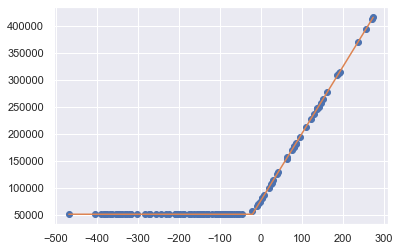

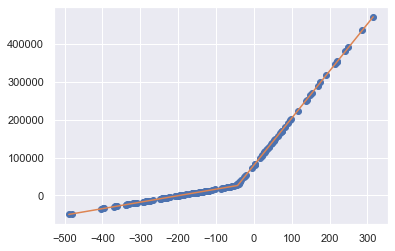

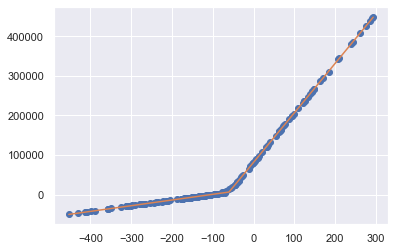

 59% (177 of 300) |############          | Elapsed Time: 6:22:21 ETA:   4:25:37

Parameters([('x0', <Parameter 'x0', value=-20.401286109428195 +/- 0.211, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=51422.3144068647 +/- 155, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.743, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1236.8081697736168 +/- 1.44, bounds=[-inf:inf]>)])


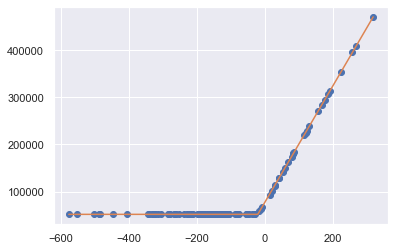

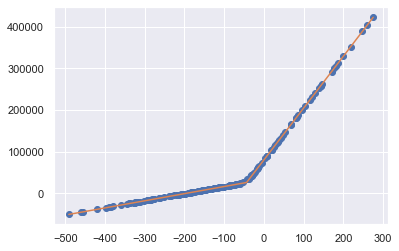

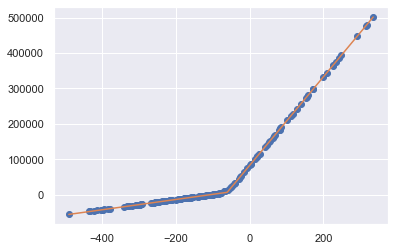

 59% (178 of 300) |#############         | Elapsed Time: 6:24:32 ETA:   4:26:24

Parameters([('x0', <Parameter 'x0', value=-20.91973873066046 +/- 0.161, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=51510.66793631915 +/- 102, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.474, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1237.452041901549 +/- 1.11, bounds=[-inf:inf]>)])


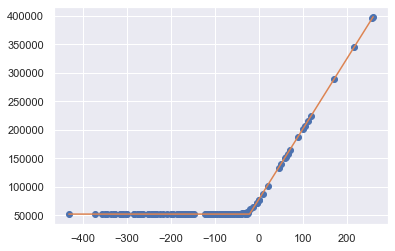

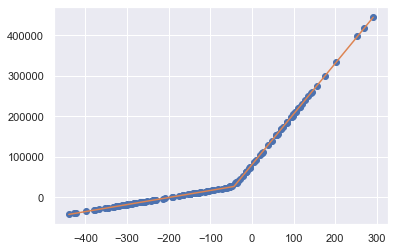

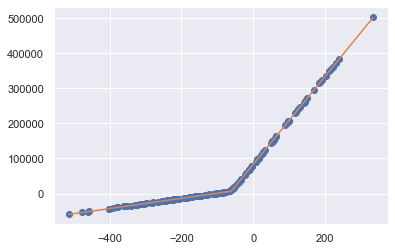

 59% (179 of 300) |#############         | Elapsed Time: 6:26:39 ETA:   4:16:08

Parameters([('x0', <Parameter 'x0', value=-21.61961721329468 +/- 0.301, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=51993.47517578017 +/- 185, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1235.385406866405 +/- 2.54, bounds=[-inf:inf]>)])


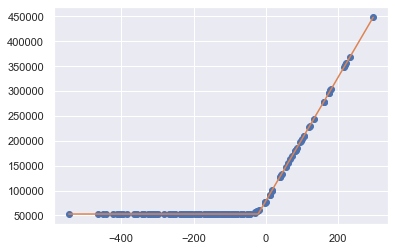

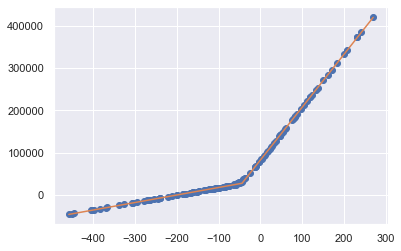

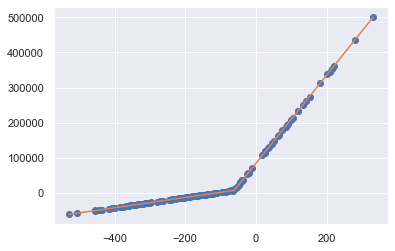

 60% (180 of 300) |#############         | Elapsed Time: 6:28:45 ETA:   4:11:25

Parameters([('x0', <Parameter 'x0', value=-21.288623207752 +/- 0.311, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=52717.17475482445 +/- 208, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.963, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1243.1422688070563 +/- 2.32, bounds=[-inf:inf]>)])


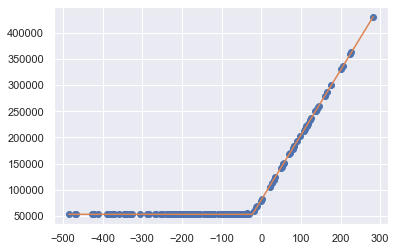

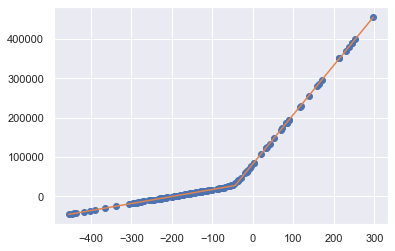

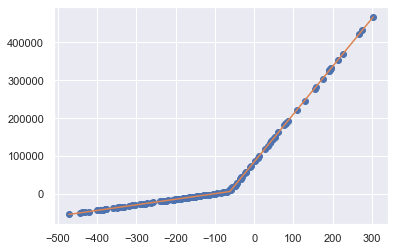

 60% (181 of 300) |#############         | Elapsed Time: 6:30:52 ETA:   4:12:41

Parameters([('x0', <Parameter 'x0', value=-22.0235193436537 +/- 0.173, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=52860.470051286495 +/- 111, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.527, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1241.9506811066133 +/- 1.32, bounds=[-inf:inf]>)])


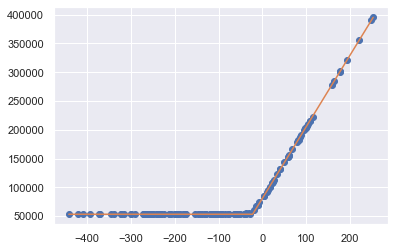

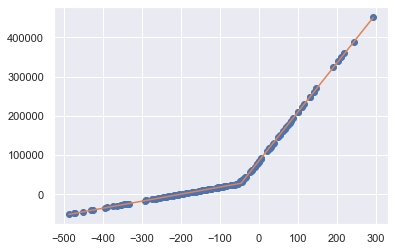

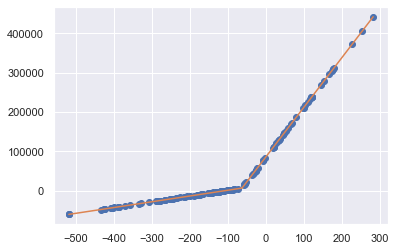

 60% (182 of 300) |#############         | Elapsed Time: 6:33:02 ETA:   4:15:17

Parameters([('x0', <Parameter 'x0', value=-22.329961086031574 +/- 0.209, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=53093.103503261445 +/- 164, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.839, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1246.6531157273357 +/- 1.69, bounds=[-inf:inf]>)])


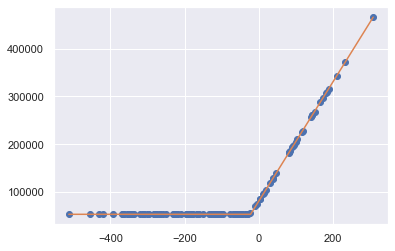

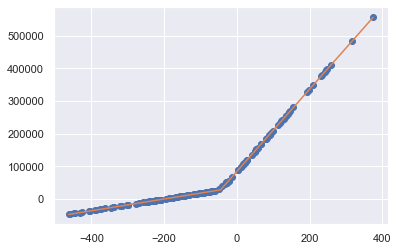

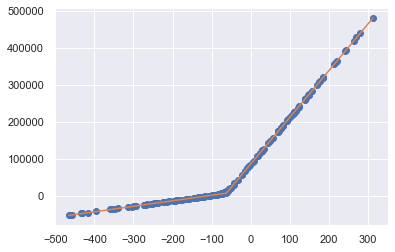

 61% (183 of 300) |#############         | Elapsed Time: 6:35:09 ETA:   4:07:57

Parameters([('x0', <Parameter 'x0', value=-22.553394059702327 +/- 0.149, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=53267.61670692141 +/- 102, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.461, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1250.3182596283918 +/- 1.07, bounds=[-inf:inf]>)])


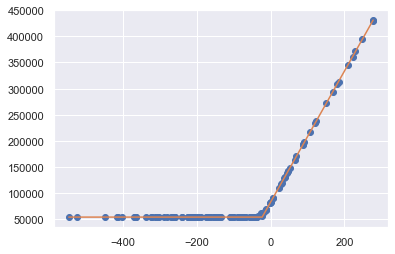

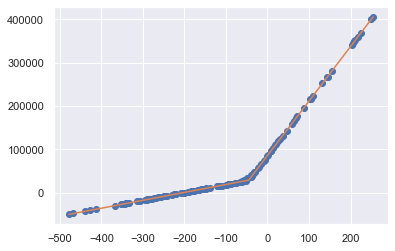

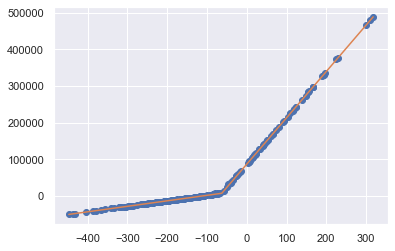

 61% (184 of 300) |#############         | Elapsed Time: 6:37:15 ETA:   4:02:36

Parameters([('x0', <Parameter 'x0', value=-22.730224012025857 +/- 0.249, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=53811.341047769885 +/- 186, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.892, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1255.2562649438987 +/- 1.8, bounds=[-inf:inf]>)])


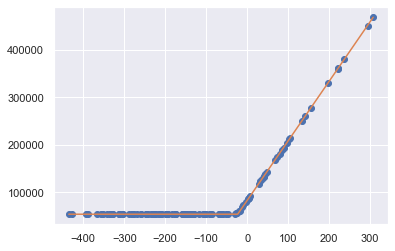

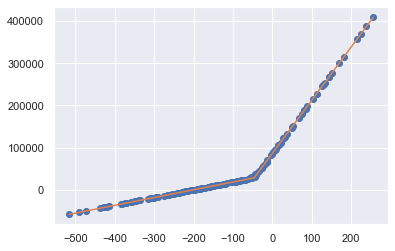

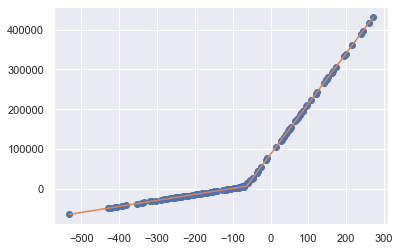

 61% (185 of 300) |#############         | Elapsed Time: 6:39:28 ETA:   4:15:31

Parameters([('x0', <Parameter 'x0', value=-23.30957588835941 +/- 0.198, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=54172.287027028935 +/- 161, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.772, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1254.2801471890039 +/- 1.35, bounds=[-inf:inf]>)])


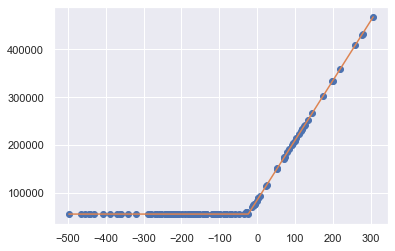

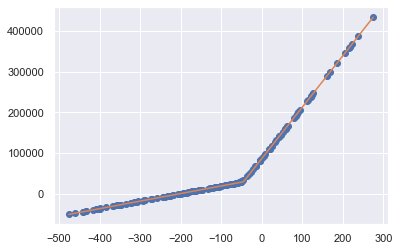

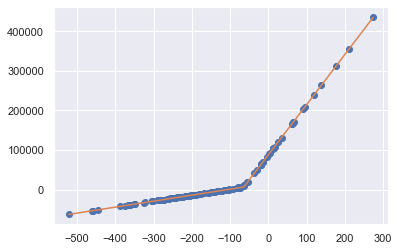

 62% (186 of 300) |#############         | Elapsed Time: 6:41:40 ETA:   4:11:17

Parameters([('x0', <Parameter 'x0', value=-23.408495157707357 +/- 0.212, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=54804.94899608622 +/- 164, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.791, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1253.9394977195739 +/- 1.43, bounds=[-inf:inf]>)])


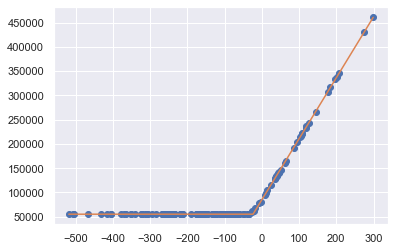

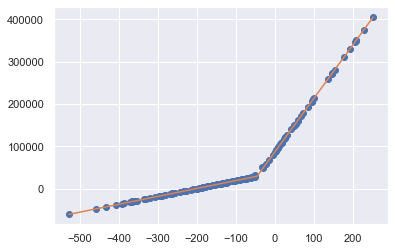

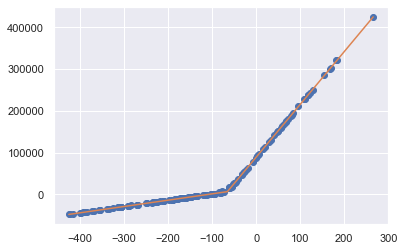

 62% (187 of 300) |#############         | Elapsed Time: 6:43:49 ETA:   4:02:41

Parameters([('x0', <Parameter 'x0', value=-23.5310318717301 +/- 0.268, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=55190.828228534214 +/- 184, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.85, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1256.5849000757762 +/- 2.07, bounds=[-inf:inf]>)])


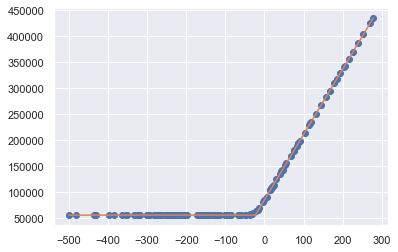

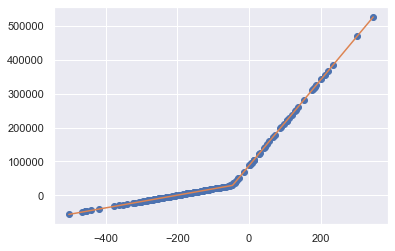

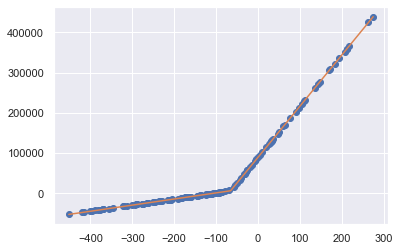

 62% (188 of 300) |#############         | Elapsed Time: 6:46:01 ETA:   4:07:07

Parameters([('x0', <Parameter 'x0', value=-23.49044950160274 +/- 0.191, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=55659.49749344254 +/- 156, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.726, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1257.5898087121118 +/- 1.24, bounds=[-inf:inf]>)])


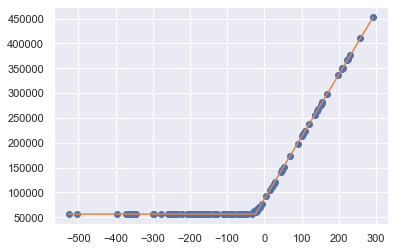

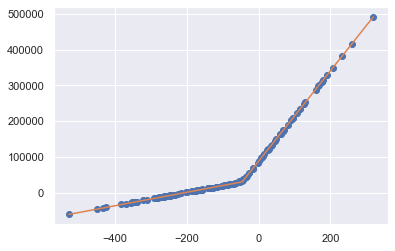

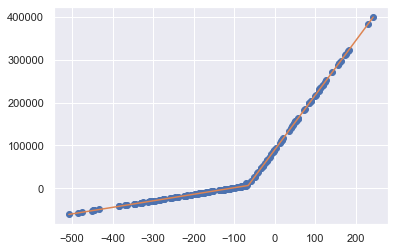

 63% (189 of 300) |#############         | Elapsed Time: 6:48:10 ETA:   3:58:05

Parameters([('x0', <Parameter 'x0', value=-24.3672258907848 +/- 0.325, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=56183.296667508366 +/- 276, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.37, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1252.9789562016167 +/- 2.02, bounds=[-inf:inf]>)])


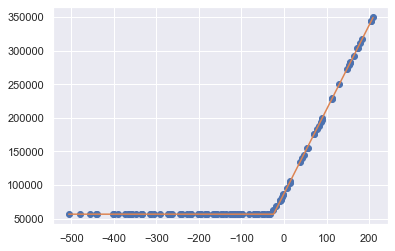

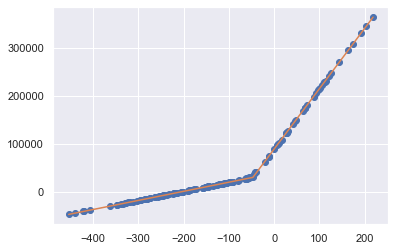

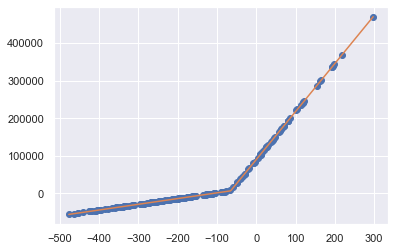

 63% (190 of 300) |#############         | Elapsed Time: 6:50:18 ETA:   3:53:55

Parameters([('x0', <Parameter 'x0', value=-24.52242697706187 +/- 0.252, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=56465.5962726734 +/- 180, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.793, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1254.0908674416664 +/- 1.96, bounds=[-inf:inf]>)])


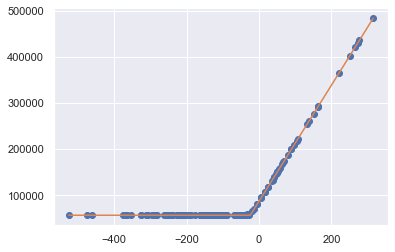

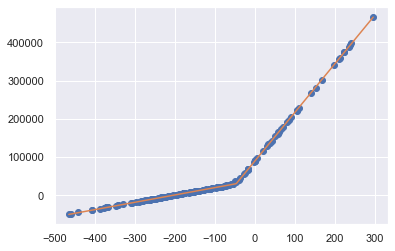

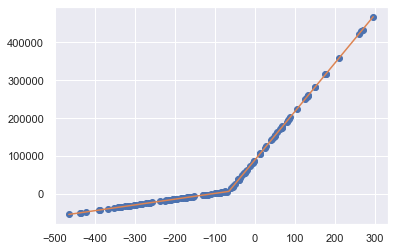

 63% (191 of 300) |##############        | Elapsed Time: 6:52:30 ETA:   4:01:01

Parameters([('x0', <Parameter 'x0', value=-23.987435606407953 +/- 0.139, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=56787.01306497731 +/- 103, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.558, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1258.7106328197947 +/- 1, bounds=[-inf:inf]>)])


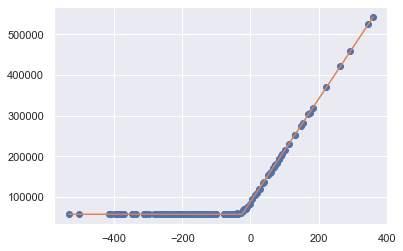

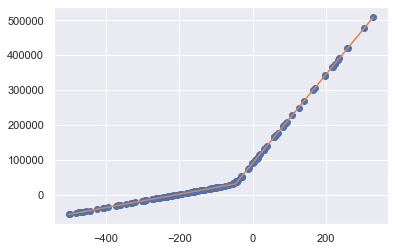

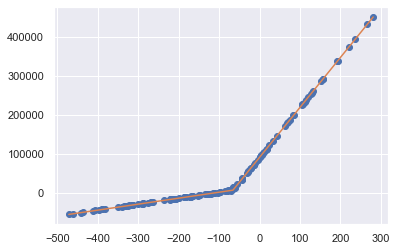

 64% (192 of 300) |##############        | Elapsed Time: 6:54:42 ETA:   3:55:54

Parameters([('x0', <Parameter 'x0', value=-24.66782197776761 +/- 0.292, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=57082.375997559124 +/- 239, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.1, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1262.5229801139174 +/- 1.84, bounds=[-inf:inf]>)])


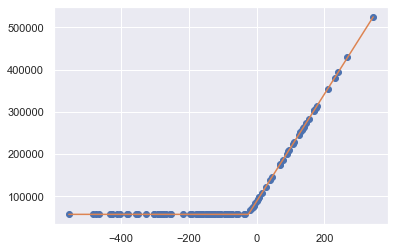

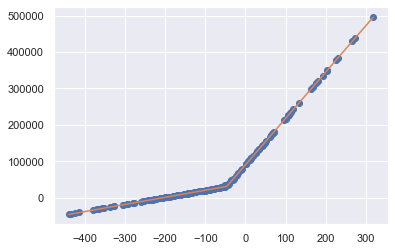

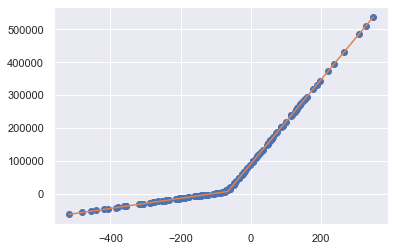

 64% (193 of 300) |##############        | Elapsed Time: 6:56:55 ETA:   3:58:27

Parameters([('x0', <Parameter 'x0', value=-24.57085588446517 +/- 0.134, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=57149.26657097408 +/- 105, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.447, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1267.9596879779608 +/- 0.866, bounds=[-inf:inf]>)])


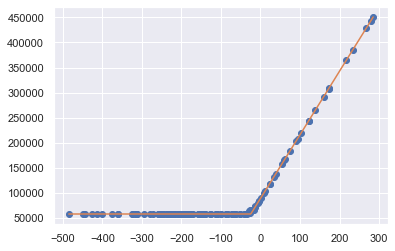

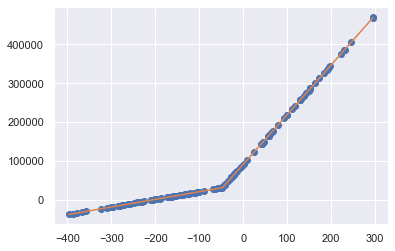

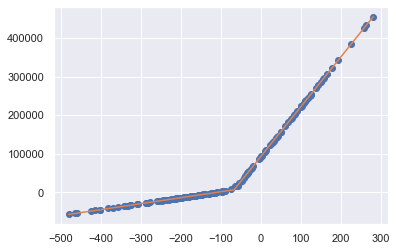

 64% (194 of 300) |##############        | Elapsed Time: 6:59:03 ETA:   3:46:19

Parameters([('x0', <Parameter 'x0', value=-24.57729440557074 +/- 0.315, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=57904.09237338084 +/- 241, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.19, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1268.629863585208 +/- 2.23, bounds=[-inf:inf]>)])


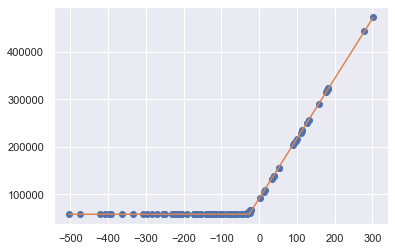

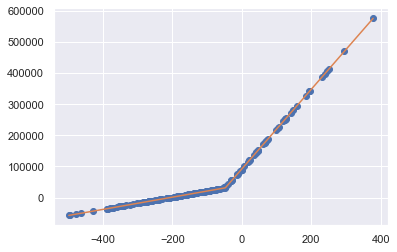

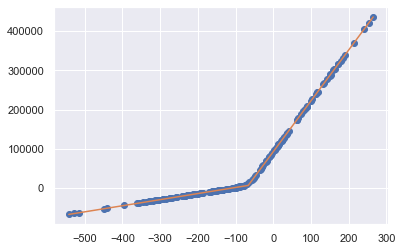

 65% (195 of 300) |##############        | Elapsed Time: 7:01:18 ETA:   3:55:25

Parameters([('x0', <Parameter 'x0', value=-26.312371435734846 +/- 0.373, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=58197.000507857345 +/- 259, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.38, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1261.2279988055964 +/- 2.73, bounds=[-inf:inf]>)])


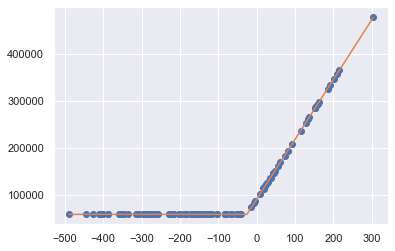

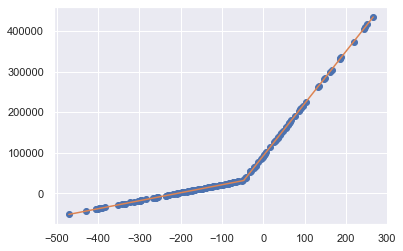

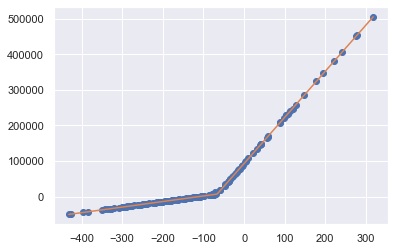

 65% (196 of 300) |##############        | Elapsed Time: 7:03:29 ETA:   3:47:04

Parameters([('x0', <Parameter 'x0', value=-25.509678566571292 +/- 0.138, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=58236.763936989584 +/- 103, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.465, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1272.9877962548874 +/- 0.996, bounds=[-inf:inf]>)])


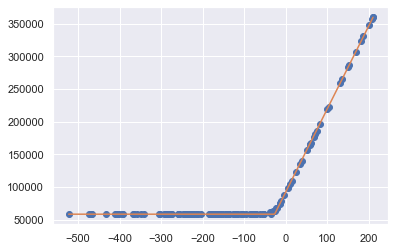

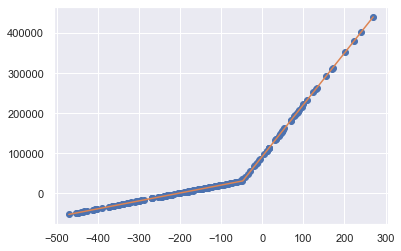

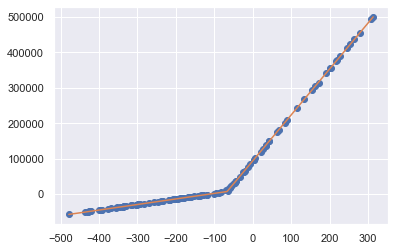

 65% (197 of 300) |##############        | Elapsed Time: 7:05:45 ETA:   3:54:08

Parameters([('x0', <Parameter 'x0', value=-26.24877151855565 +/- 0.304, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=58517.34073704921 +/- 223, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.01, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1270.5085050599162 +/- 2.42, bounds=[-inf:inf]>)])


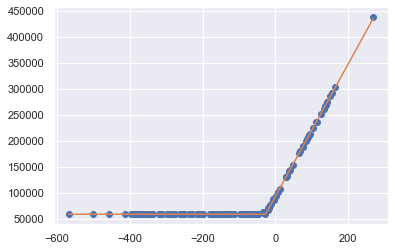

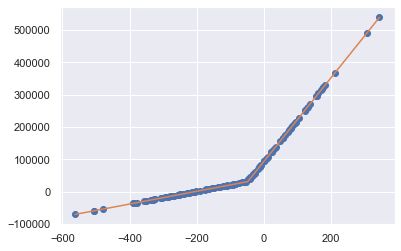

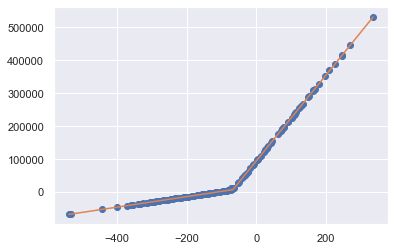

 66% (198 of 300) |##############        | Elapsed Time: 7:07:52 ETA:   3:36:00

Parameters([('x0', <Parameter 'x0', value=-26.54079336522626 +/- 0.206, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=58857.74794248616 +/- 155, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.704, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1270.280117052989 +/- 1.87, bounds=[-inf:inf]>)])


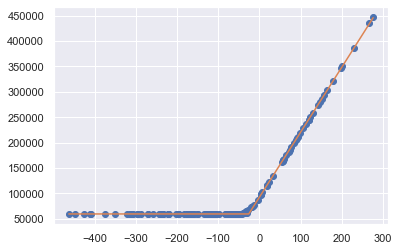

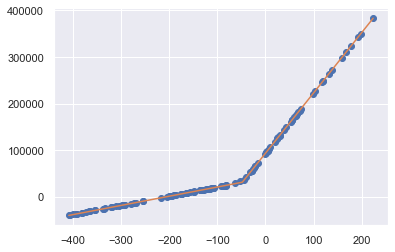

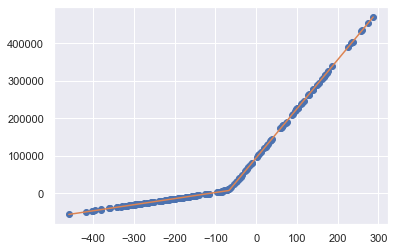

 66% (199 of 300) |##############        | Elapsed Time: 7:09:57 ETA:   3:29:27

Parameters([('x0', <Parameter 'x0', value=-25.903926398139067 +/- 0.323, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=59691.32826015616 +/- 229, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.26, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1277.7863299554956 +/- 2.52, bounds=[-inf:inf]>)])


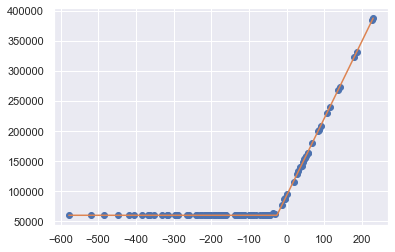

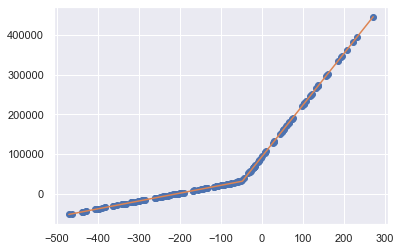

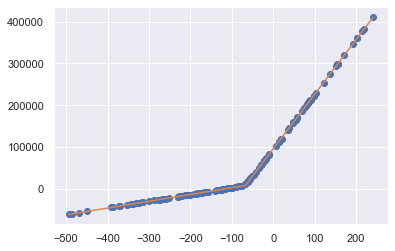

 66% (200 of 300) |##############        | Elapsed Time: 7:12:09 ETA:   3:40:55

Parameters([('x0', <Parameter 'x0', value=-25.456486814517337 +/- 0.176, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=59842.0273945622 +/- 115, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.55, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1283.2522345963077 +/- 1.61, bounds=[-inf:inf]>)])


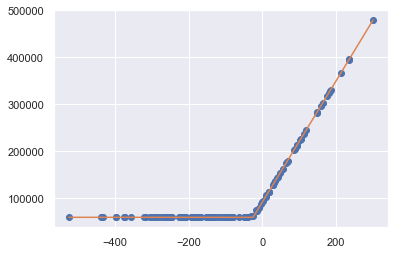

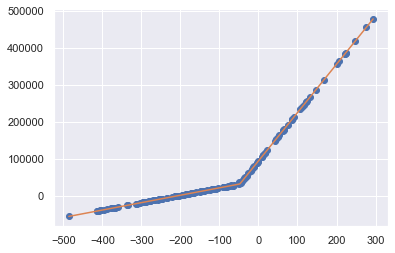

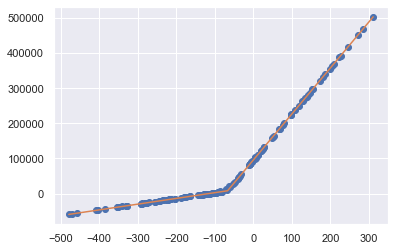

 67% (201 of 300) |##############        | Elapsed Time: 7:14:20 ETA:   3:35:04

Parameters([('x0', <Parameter 'x0', value=-25.368841699499058 +/- 0.21, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=59991.94547610927 +/- 179, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.878, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1290.1673962077966 +/- 1.5, bounds=[-inf:inf]>)])


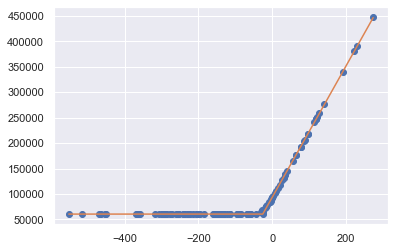

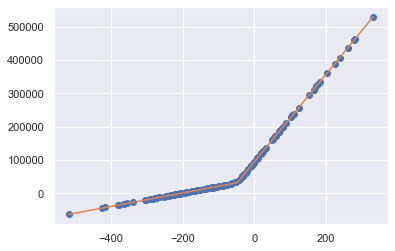

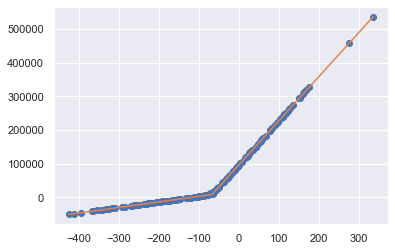

 67% (202 of 300) |##############        | Elapsed Time: 7:16:26 ETA:   3:26:40

Parameters([('x0', <Parameter 'x0', value=-25.63752023784145 +/- 0.338, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=60559.14856447422 +/- 290, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.32, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1290.3732132466048 +/- 2.86, bounds=[-inf:inf]>)])


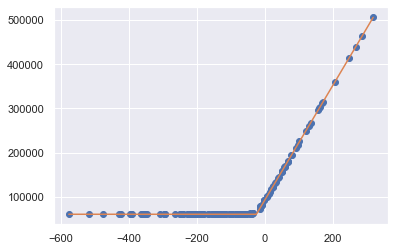

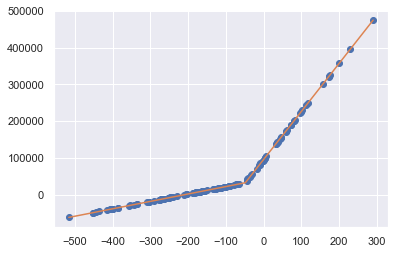

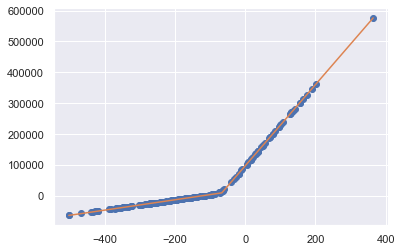

 67% (203 of 300) |##############        | Elapsed Time: 7:18:33 ETA:   3:24:16

Parameters([('x0', <Parameter 'x0', value=-25.35082459133138 +/- 0.211, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=60834.69707986021 +/- 178, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.831, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1298.4460395933359 +/- 1.56, bounds=[-inf:inf]>)])


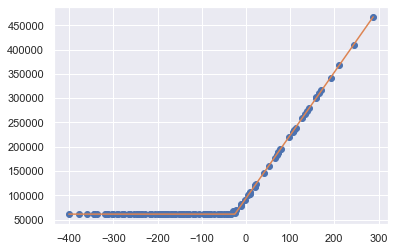

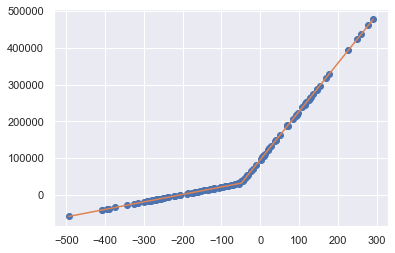

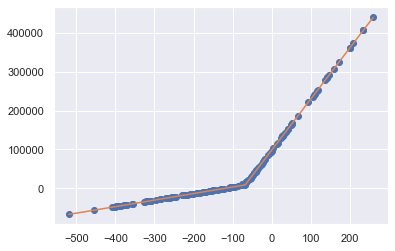

 68% (204 of 300) |##############        | Elapsed Time: 7:20:40 ETA:   3:24:34

Parameters([('x0', <Parameter 'x0', value=-25.198482846559113 +/- 0.282, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=61356.53857887076 +/- 222, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.21, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1296.9126531189208 +/- 2.15, bounds=[-inf:inf]>)])


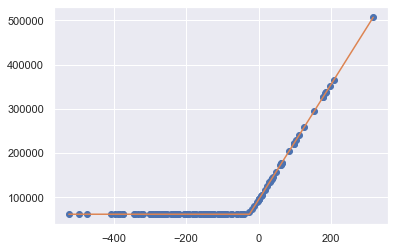

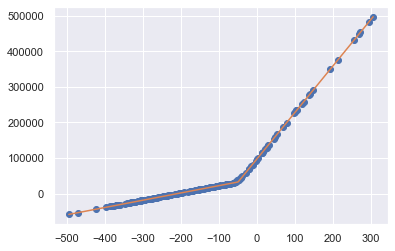

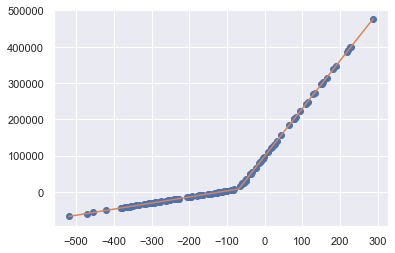

 68% (205 of 300) |###############       | Elapsed Time: 7:22:53 ETA:   3:29:24

Parameters([('x0', <Parameter 'x0', value=-24.958509825971817 +/- 0.2, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=61706.89305815986 +/- 170, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.783, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1303.1471687959274 +/- 1.58, bounds=[-inf:inf]>)])


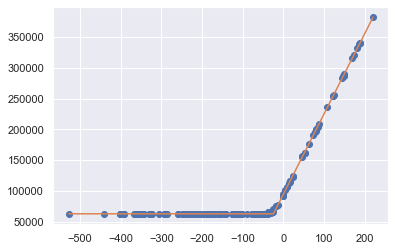

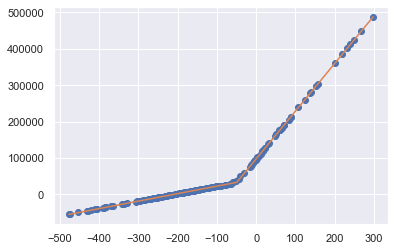

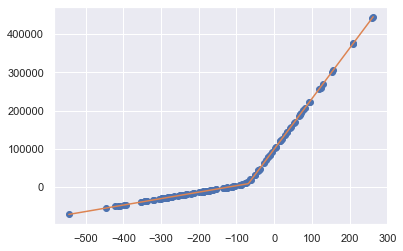

 68% (206 of 300) |###############       | Elapsed Time: 7:25:04 ETA:   3:25:12

Parameters([('x0', <Parameter 'x0', value=-24.69133758714192 +/- 0.294, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=62609.229368699496 +/- 211, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.02, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1306.4208976267596 +/- 2.53, bounds=[-inf:inf]>)])


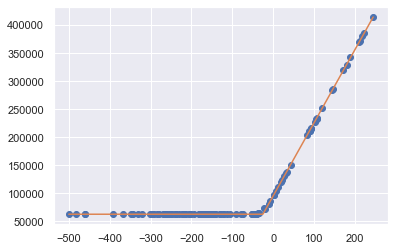

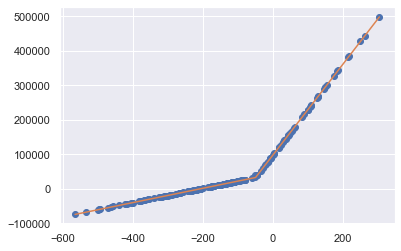

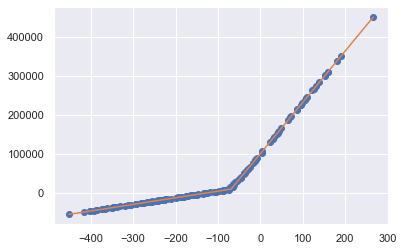

 69% (207 of 300) |###############       | Elapsed Time: 7:27:18 ETA:   3:28:02

Parameters([('x0', <Parameter 'x0', value=-25.39010025870181 +/- 0.264, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=62865.185026306215 +/- 208, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.993, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1304.7427716765897 +/- 1.98, bounds=[-inf:inf]>)])


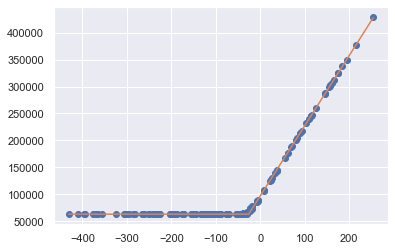

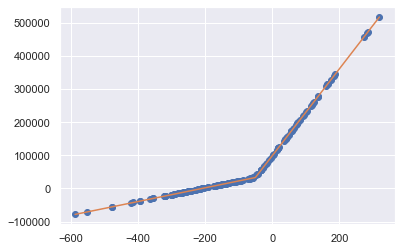

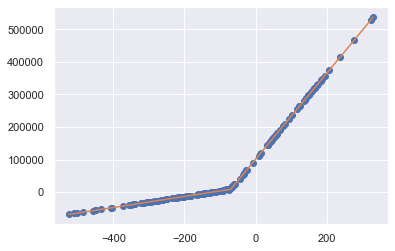

 69% (208 of 300) |###############       | Elapsed Time: 7:29:29 ETA:   3:21:02

Parameters([('x0', <Parameter 'x0', value=-26.275676466805777 +/- 0.264, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=63203.331237408966 +/- 210, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.13, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1301.435362429326 +/- 2.08, bounds=[-inf:inf]>)])


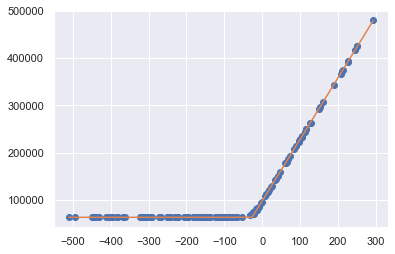

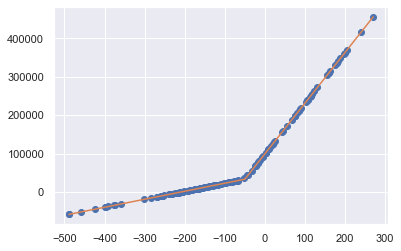

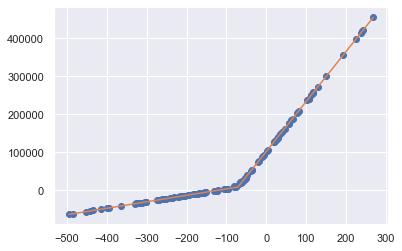

 69% (209 of 300) |###############       | Elapsed Time: 7:31:40 ETA:   3:18:26

Parameters([('x0', <Parameter 'x0', value=-26.74868213198175 +/- 0.258, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=63374.607856456365 +/- 226, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.992, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1302.189081715819 +/- 1.73, bounds=[-inf:inf]>)])


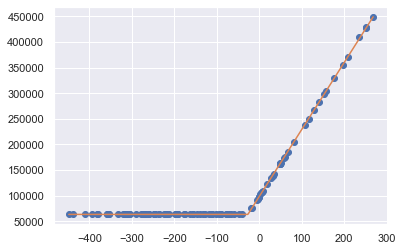

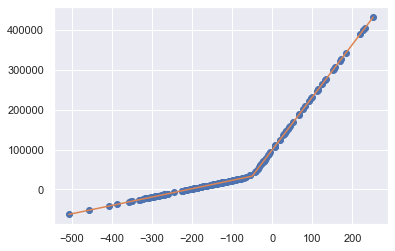

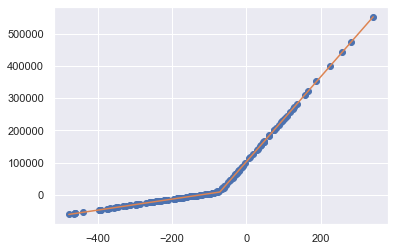

 70% (210 of 300) |###############       | Elapsed Time: 7:33:53 ETA:   3:19:39

Parameters([('x0', <Parameter 'x0', value=-26.904716794075643 +/- 0.193, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=63327.47659626889 +/- 181, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.814, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1307.9293748849777 +/- 1.31, bounds=[-inf:inf]>)])


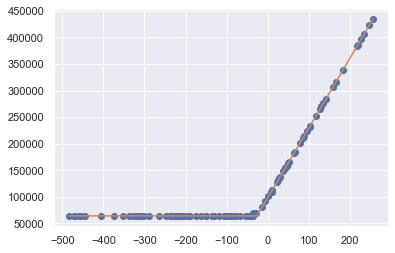

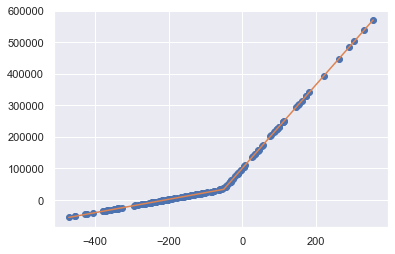

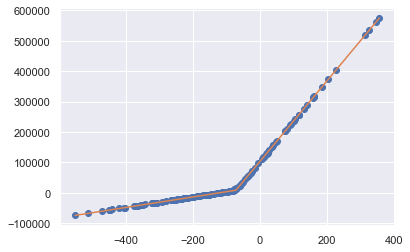

 70% (211 of 300) |###############       | Elapsed Time: 7:36:05 ETA:   3:15:43

Parameters([('x0', <Parameter 'x0', value=-26.14528657653231 +/- 0.302, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=64235.767185026576 +/- 234, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.07, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1312.5210948107324 +/- 2.24, bounds=[-inf:inf]>)])


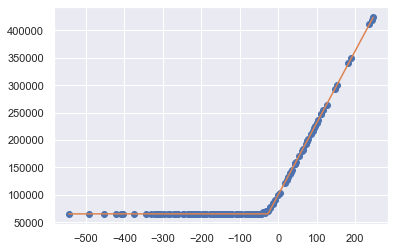

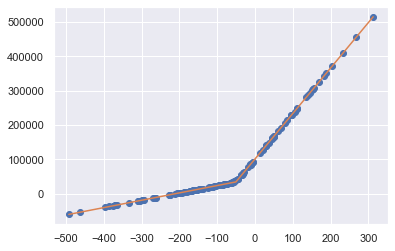

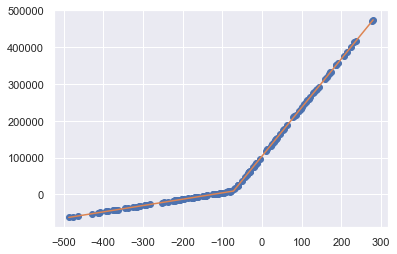

 70% (212 of 300) |###############       | Elapsed Time: 7:38:09 ETA:   3:02:39

Parameters([('x0', <Parameter 'x0', value=-26.200238149299512 +/- 0.322, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=65152.5466147698 +/- 244, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 1.2, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1310.7518377795905 +/- 2.77, bounds=[-inf:inf]>)])


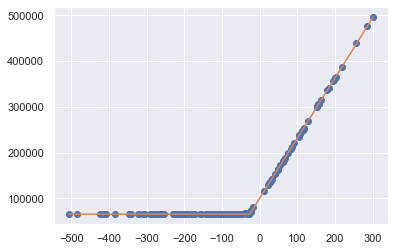

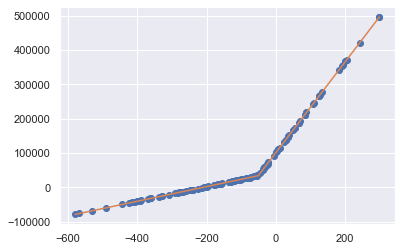

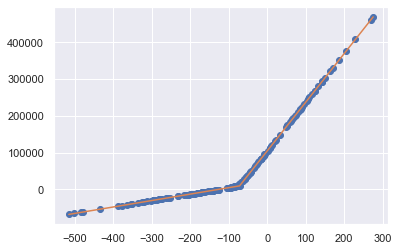

 71% (213 of 300) |###############       | Elapsed Time: 7:40:18 ETA:   3:05:49

Parameters([('x0', <Parameter 'x0', value=-26.288799886521453 +/- 0.234, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=65559.78061003027 +/- 164, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.872, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1313.283733445624 +/- 1.67, bounds=[-inf:inf]>)])


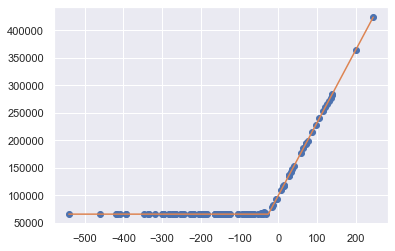

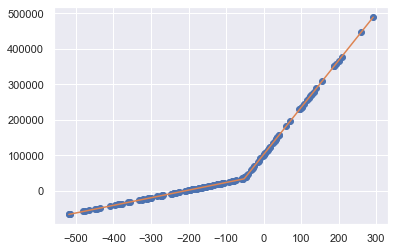

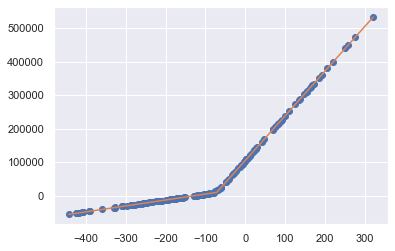

 71% (214 of 300) |###############       | Elapsed Time: 7:42:31 ETA:   3:11:33

Parameters([('x0', <Parameter 'x0', value=-25.4148318248927 +/- 0.186, bounds=[-inf:inf]>), ('y0', <Parameter 'y0', value=65976.00013944111 +/- 129, bounds=[-inf:inf]>), ('k1', <Parameter 'k1', value=0 +/- 0.634, bounds=[-inf:inf]>), ('k2', <Parameter 'k2', value=1322.0529224041213 +/- 1.82, bounds=[-inf:inf]>)])


KeyboardInterrupt: 

In [15]:
vfs = adp_algorithm_complete()


In [ ]:
vfs_models = {}
for i in range(len(vfs)):
    vfs_models[i] = vfs[i].models

In [ ]:
df_vfs = pd.DataFrame(vfs_params)
identificator = pd.Timestamp.now().strftime("%Y-%m-%d_H%H")
df_vfs.to_pickle(f'saved_vfs/vfs_{identificator}.pkl')

# Conslusion
- All seems reasonable, no powerplant has more value, because it is vulnerable for price drops. 
- The code is now somehow reasonable and ready to be used in the next notebook in simulation.

- Testing: 
   1. Look what actions are being performed in what states and if they make sense. 
   2. Look what is the result, how does it compare to baseline models and to the pce equivalent stated by the Vf. 
   3. Maybe play more with the constants... 

# Conclusion and model adjustments 
- Each night, I will run the model, with visualisation and see, how good the model is. 
- I will make notes and adjust the model so it is able to catch the pattern better. 

Individual sample size - 200, global sample size -2000, Integral sample size 100. 


# 19.12. First run with large sample size 
- It went good in the first 290 rounds, the option pattern is always there. 

- Problems: 
    1. Negative expected price for the first plant state, should be strictly higher than 0, because I can always do. In other model cases, the project can heave negative value, but not here, where we have the option to do nothing. 
    2. There is s degeneration of the model as we approach time epoch 0. This is caused by low support of the modelled spark prices. We model their variance to be linearly time dependent, but we should put a limit on it. 
         - I have decided this is not that important... It is an approximation, it can slightly not make sense. 
- Powerplant cost is very low, 65M now, could be set to 650, or the volatility of prices could be set lower. 

# 24.12. New format run 
- I have cleaned up the code and prepared the algorithm for weekly time epochs. 
- This code will be run through the night of 24.12. 
- I have the vfs for monthly structure in file 24.12. 